### Preparation

In [3]:
!pip install gymnasium

In [62]:
!pip show gym

Name: gym
Version: 0.26.2
Summary: Gym: A universal API for reinforcement learning environments
Home-page: https://www.gymlibrary.dev/
Author: Gym Community
Author-email: jkterry@umd.edu
License: MIT
Location: c:\users\jakob\miniconda3\envs\iannwtf\lib\site-packages
Requires: cloudpickle, gym-notices, importlib-metadata, numpy
Required-by: 


In [137]:
# Requirements
import sys
#sys.path.append(r'\users\jakob\miniconda3\envs\iannwtf\lib\site-packages')
import gymnasium as gym
import random
import os
import numpy as np
import time
from collections import defaultdict
from time import sleep
from random import randrange
from pickle import dump, load
from matplotlib import pyplot as plt

This notebook uses the following functionalities from the gym package: 
    gym.Env : ...
    gym.Spaces.Discrete, gym.Spaces.Discrete.n: ...

# ENVIRONMENT 

In [64]:
# import sys
# sys.path.append(r'\users\jakob\miniconda3\envs\iannwtf\lib\site-packages')
# import gymnasium as gym
# import random
# import os

### Gridworld 

In [124]:
class GridWORLD(gym.Env):
    ##### Environment-reward dynamics parameters #####
    WINDY = 0.3
    BUMPING = -3
    DYING = -500
    WINNING = 1000
    DEFAULT = -1
    MAX_N_STEPS = 150
    
    # WIND: West, East, North, South
    # OBJECTS: Obstacle, Goal, Trap, Portal
    # Else: Free tile
    WORLD = [['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O'],
             ['O', 'T', 'T', 'T', 'O', ' ', 'E', 'G', 'W', 'O'],
             ['O','NE','NE', 'T', 'O', ' ','NE', 'N','NW', 'O'],
             ['O','NE','NE', 'T', 'O', ' ', ' ', ' ', ' ', 'O'],
             ['O', ' ', 'O', 'O', 'O', 'O', 'E', ' ', 'T', 'O'],
             ['O', ' ', ' ', ' ', ' ', 'O', 'E', ' ', 'T', 'O'],
             ['O','SE', 'S','SW', ' ', 'O', 'E', ' ', 'T', 'O'],
             ['O', 'E', 'T', 'W', ' ', ' ', ' ', ' ', ' ', 'O'],
             ['O','NE', 'N','NW', ' ', ' ', ' ', ' ', ' ', 'O'],
             ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']]
    WIND = {'N':  [-1,  0], 'E':  [ 0,  1],
            'S':  [ 1,  0], 'W':  [ 0, -1],
            'NW': [-1, -1], 'NE': [-1,  1],
            'SW': [ 1, -1], 'SE': [ 1,  1]}
    # Cardinal points of actions (with negative latitude to navigate through nested list) 
    #            north     east      south     west
    ACTIONS = [[-1,  0], [ 0,  1], [ 1,  0], [ 0, -1]]
    START = (5, 4)
    
    ##### Rendering info #####
    metadata = {'render.modes': ['human']}
    SYMBOLS = {'N':  ' ↑ ', 'E':  ' → ', 'S':  ' ↓ ', 'W':  ' ← ', 
               'NW': ' ↖ ', 'NE': ' ↗ ', 'SE': ' ↘ ', 'SW': ' ↙ ', 
               'O':  ' ■ ', 'G':  ' ★ ', 'T':  ' ☢ ', ' ':  '   ', 'P': ' ✈ '}


    def __init__(self):
        self.action_space = gym.spaces.Discrete(4)
        self.observation_space = gym.spaces.Discrete(2)
        self.rows = len(self.WORLD)
        self.columns = len(self.WORLD[0])
        self.portals = [(i, j) for i in range(self.rows) for j in range(self.columns) if self.WORLD[i][j] == 'P']
        self.t = 0


    
    def step(self, action):
        '''
        Performs agent step for RL applying stochastic environment-reward dynamics.
        Returns a quadruple of observation, current reward, end-of-episode status and optional info.

            Parameters:
                    action (int): Index of action to perform 

            Returns:
                    self.state, reward, self.done, info (tuple(list, int, bool, dict): 
                        State-reward feedback with episode state {T,F} and optional info dictionary
        '''
        self.t += 1
        
        ##### End of episode yields no more reward #####
        if self.MAX_N_STEPS and self.t  >= self.MAX_N_STEPS:
            self.done = True
            return self.state, 0, self.done, {}
        if self.done:
            return self.state, 0, self.done, {}
        
        ##### Sampling from state transition dynamics: s′∼p(s′|s,a) #####
        i, j = self.state
        square = self.WORLD[i][j]
        a_di, a_dj = self.ACTIONS[action]
        # CHECK FOR WIND
        if square in self.WIND:
            w_di, w_dj = self.WIND[square]
            # APPLY WIND STOCASTICALLY
            if random.uniform(0, 1) < self.WINDY:
                a_di += w_di
                a_dj += w_dj
                # CLIP MOVEMENT
                if abs(a_di) > 1:
                    a_di //= 2
                if abs(a_dj) > 1:
                    a_dj //= 2
        # APPLY MOVEMENT
        i_new, j_new = i + a_di, j + a_dj
        
        ##### Applying reward function #####
        newsquare = str(self.WORLD[i_new][j_new])
        if newsquare == 'O':
            reward = self.BUMPING
            # i,j = i,j(you bump back to your original position)
        elif newsquare == 'T':
            reward = self.DYING
            i, j = i_new, j_new
            self.done = True
        elif newsquare == 'G':
            reward = self.WINNING
            i, j = i_new, j_new
            self.done = True
        elif newsquare == 'P':
            reward = self.DEFAULT
            i, j = random.choice(self.portals)
        else:
            i, j = i_new, j_new
            reward = self.DEFAULT
        if not i_new in range(self.rows) or not j_new in range(self.columns):
            reward = self.BUMPING
        
        self.state = (i,j)
        return self.state, reward, self.done, {}


    def reset(self):
        self.state = self.START
        self.done = False
        self.t = 0
        return self.state


    def render(self, mode='human'):
        os.system('clear')
        def symbol(i, j):
            # Renders objects and free tiles with fixred fixed symbol
            if self.WORLD[j][i] != 'O':
                return self.SYMBOLS[self.WORLD[j][i]]
            # Rendering wall tile depends on neighboring 'O'-tiles 
            else:
                left   = i - 1 in range(self.rows) and self.WORLD[j][i-1] == 'O'
                right  = i + 1 in range(self.rows) and self.WORLD[j][i+1] == 'O'
                top    = j - 1 in range(self.columns) and self.WORLD[j-1][i] == 'O'
                bottom = j + 1 in range(self.columns) and self.WORLD[j+1][i] == 'O'
                # Recombination yields 2^4=16 cases of rendering a wall tile
                #          Left  Right   Top  Bottom
                symbs = {( True,  True,  True,  True): '─┼─',
                         ( True,  True,  True, False): '─┴─',
                         ( True,  True, False,  True): '─┬─',
                         ( True,  True, False, False): '───',
                         ( True, False,  True,  True): '─┤ ',
                         ( True, False,  True, False): '─┘ ',
                         ( True, False, False,  True): '─┐ ',
                         ( True, False, False, False): '───',
                         (False,  True,  True,  True): ' ├─',
                         (False,  True,  True, False): ' └─',
                         (False,  True, False,  True): ' ┌─',
                         (False,  True, False, False): '───',
                         (False, False,  True,  True): ' │ ',
                         (False, False,  True, False): ' │ ',
                         (False, False, False,  True): ' │ ',
                         (False, False, False, False): ' ▪ ',}
                return symbs[left, right, top, bottom]

        # GridWorld representation -> squares of symbols
        squares = [[symbol(i, j)
            for i in range(self.rows)] for j in range(self.columns)]
        i, j = self.state
        squares[i][j] = ' × '
        # Outputs rendered world to console
        print('\n'.join(''.join(row) for row in squares))

        
    def seed(self, seed):
        random.seed(seed)

In [125]:
class Labyrinth(GridWORLD):
    WORLD = [['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O'],
             ['O', 'T', ' ', ' ', ' ', ' ', ' ', 'O', 'P', 'O', 'T', ' ', ' ', 'O', ' ', 'O', 'G', 'O'],
             ['O', ' ', 'O', 'O', 'O', 'O', ' ', 'O', ' ', 'O', 'O', 'O', ' ', ' ', ' ', 'O', ' ', 'O'],
             ['O', ' ', 'O', ' ', ' ', ' ', ' ', 'O', ' ', ' ', ' ', 'O', 'O', 'O', ' ', 'O', ' ', 'O'],
             ['O', ' ', 'O', ' ', 'O', ' ', 'O', 'O', 'O', ' ', ' ', ' ', 'O', ' ', ' ', ' ', ' ', 'O'],
             ['O', ' ', ' ', ' ', 'O', ' ', 'O', 'T', 'O', ' ', 'O', ' ', 'O', ' ', 'O', 'O', 'O', 'O'],
             ['O', 'O', 'O', ' ', 'O', 'O', 'O', ' ', 'O', ' ', 'O', ' ', ' ', ' ', 'O', 'P', ' ', 'O'],
             ['O', ' ', ' ', ' ', 'O', 'P', 'O', ' ', 'O', ' ', 'O', 'O', ' ', 'O', 'O', 'O', ' ', 'O'],
             ['O', ' ', 'O', ' ', 'O', ' ', 'O', ' ', ' ', ' ', ' ', 'O', 'O', 'O', ' ', 'O', ' ', 'O'],
             ['O', ' ', 'O', ' ', ' ', ' ', 'O', ' ', 'O', 'O', ' ', 'O', ' ', ' ', ' ', 'O', ' ', 'O'],
             ['O', ' ', 'O', 'O', ' ', 'O', 'O', 'O', 'O', 'T', ' ', 'O', ' ', 'O', ' ', 'O', ' ', 'O'],
             ['O', ' ', 'O', ' ', ' ', ' ', ' ', 'O', ' ', ' ', ' ', ' ', ' ', 'O', ' ', ' ', ' ', 'O'],
             ['O', ' ', ' ', ' ', ' ', 'O', ' ', 'O', ' ', 'O', 'O', ' ', 'O', 'O', ' ', 'O', 'O', 'O'],
             ['O', 'O', ' ', 'O', 'O', 'O', ' ', 'O', ' ', 'O', ' ', ' ', ' ', ' ', ' ', ' ', ' ', 'O'],
             ['O', ' ', ' ', 'O', ' ', ' ', ' ', 'O', ' ', ' ', ' ', 'O', ' ', ' ', ' ', ' ', ' ', 'O'],
             ['O', ' ', 'O', 'O', ' ', 'O', 'O', 'O', ' ', ' ', ' ', 'O', ' ', 'O', 'O', 'O', ' ', 'O'],
             ['O', ' ', ' ', 'O', ' ', ' ', ' ', ' ', ' ', 'O', 'P', 'O', ' ', ' ', ' ', ' ', 'T', 'O'],
             ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']]
    START = (16, 1)

# MAIN - Try Environment

In [91]:
#env = GridWORLD()
env = Labyrinth()
env.reset()
env.render()
d = {'w': 0, 'd': 1, 's': 2, 'a': 3}
while True:
    try:
        # Prompts user to enter a character (a/s/d/w) representing the action to take
        action = d[input('»»»')]
    except:
        break
    O, R, done, info = env.step(action)
    env.render()
    print(R)

 ┌────────────────────┬─────┬───────────┬─────┬─────┐ 
 │  ☢                 │  ✈  │  ☢        │     │  ★  │ 
 │     ┌──────────    │     └─────┐           │     │ 
 │     │              │           └──┬────    │     │ 
 │     │     │     ┌──┴──┐           │              │ 
 │           │     │  ☢  │     │     │     ┌────────┤ 
 ├───────    ├─────┤     │     │           │  ✈     │ 
 │           │  ✈  │     │     └──┐     ┌──┴──┐     │ 
 │     │     │     │              ├─────┘     │     │ 
 │     │           │     ┌────    │           │     │ 
 │     ├────   ────┴──┬──┘  ☢     │     │     │     │ 
 │     │              │                 │           │ 
 │              │     │     ┌────   ────┘    ───────┤ 
 ├────    ┌─────┘     │     │                       │ 
 │        │           │           │                 │ 
 │    ────┤    ───────┘           │    ─────────    │ 
 │  ×     │                 │  ✈  │              ☢  │ 
 └────────┴─────────────────┴─────┴─────────────────┘ 
»»»l


In [126]:
# import random
# import numpy as np

In [127]:
class Policy:
    def __init__(self, agent):
        # Policy is assigned to 1 agent, giving access to V,Q-stimates and action space
        self.agent = agent
        self.As = range(agent.env.action_space.n)
        self.Q = self.agent.Q
        self.V = self.agent.V


    def draw(self, O):
        # Compute the probability distribution over actions given the observation
        P = self.distribution(O)
        # list of k samples drawn from distribution P over actions As
        return random.choices(self.As, weights=P, k=1)[0]


    def __call__(self, O, A):
        '''Calculates the probability of selecting an action in the given state according to the policy's probability distribution.
        
            Parameters:
                    O (tuple(int,int)): Observation at current time - state as tuple of integer x,y-coordinates 
                    A (int): Action to be evaluated, encoded as int over the length of the action space

            Returns:
                    P[A] (float): Current likelihood of selecting action A under policy
        '''
        P = self.distribution(O)
        return P[A]

### Distribution functions

In [128]:
class Softmax(Policy):
    def distribution(self, O):
        '''Computes the softmax probability distribution over actions for the given state O'''
        
        Qs = np.array([self.Q[O, A] for A in self.As])
        # Softmax to transforms action values into probabilities [0,1]
        exp = np.exp(Qs)
        normalized_distribution = exp/np.sum(exp)
        return normalized_distribution

In [129]:
class EpsilonGreedy(Policy):
    epsilon = 0.2

    def distribution(self, O):
        '''Computes the epsilon-greedy probability distribution over actions for the given state O'''
        Q_values = [self.Q[O, a] for a in self.As]
        # Select greedy action 
        best_index = np.argmax(Q_values)
        best_action = self.As[best_index]
        
        # Computing epsilon-greedy probabilities
        prob_a = np.ones(len(self.As)) * self.epsilon / (len(self.As)-1) 
        # Probability of A* is not affected by epsilon-probability distributed over (len(self.As)-1) non-greedy actions
        prob_a[best_action] = 1 - self.epsilon
        return prob_a

# Agent

In [130]:
# from collections import defaultdict
# from time import sleep
# from random import randrange
# from policy import *
# import numpy as np
# from pickle import dump, load

In [139]:
class TabularAgent:
    # state-action value function
    Q = defaultdict(lambda: 0.0)   #given function will provide default values for all undefined dictionary keys (0)   
    # state value function
    V = defaultdict(lambda: 0.0)

    
    def __call__(self, render={'mode':'human', 'speed': 0.1}):
        # Runs the agent with fixed policy
        O, R = env.reset(), 0
        done = False
        while not done:
            self.render(render)
            A = self.policy.draw(O)
            O, R, done, info = self.env.step(A) 
        self.render(render)


    def save(self, path):
        '''
        Stores our TabularAgent's V,Q-values to a (python) pickle file (.pkl)
        (Serializes our tuple of numpy arrays)
        '''
        with open(path, 'wb') as file:
            dump((dict(self.Q), dict(self.V)), file)


    def load(self, path):
        with open(path, 'rb') as file:
            Q, V = load(file)
            self.Q.update(Q)                            # Is this smart when loading an old model? Rather set self.Q = Q...
            self.V.update(V)


    def train(self, episodes, render={'mode':'human', 'speed': 0}):
        start_time = time.time()  # records start time of training
        
        for n in range(episodes):
            O, R = self.env.reset(), 0
            self.pre_episode() 
            
            done = False
            step = 0
            ep_return = 0
            # Performs actions and observes environment dynamics until episode ends (Goal or Death)  
            while not done:
                self.render(render)
                # action selection based on policy (or random sampling)
                A = self.action(O, R)
                print(f'EPISODE {n} - STEP {step} - Last R {R}')
                # observe environment dynamics  (observation, reward)
                O, R, done, info = self.env.step(A)
                
                step += 1
                ep_return += R
            
            # Store metrics
            self.episode_returns.append(ep_return)
            self.episode_times.append(time.time() - start_time)
            # Terminal output
            self.render(render)
            print(f'EPISODE {n} - STEP {step} end')
            self.post_episode(O, R)


    def render(self, render):
        '''
        Initiates the agent's environment to re-render according to reder-directions and print to terminal
            
            Parameters: 
                    render (dict of {str:int, str:str}): Dictionary with speed and mode to direct rendering
        '''
        speed = render['speed']
        mode = render['mode']
        # speed regulates the framerate of subsequent calls to plt visualizations during training with interactive mode on (plt.ion())
        if speed:
            sleep(speed)
        if mode:
            self.env.render(mode)


    def expectation(self, O):
        '''
        Calculates the Expected State-Value for given observed state O according to current policy.
            
            Returns: 
                    E (float): Sum of the product between the probability of each action and the corresponding current Q-values.
        '''
        E = sum(self.policy(O, A) * self.Q[O, A] for A in self.env.action_space)
        return E


    def action(self, O, R):
        # A TabularAgent's action method returns a random action as default 
        return self.env.action_space.sample()


    def pre_episode(self,):
        pass


    def post_episode(self,):
        pass

### Agent extension: Temporal Difference Learning

In [140]:
# from matplotlib import pyplot as plt

In [141]:
class TabularTD(TabularAgent):
    def __init__(self, env, alpha=0.5, gamma=.9, policy=Softmax, N=10):
        self.alpha = alpha
        self.gamma = gamma
        self.env = env
        self.As = range(self.env.action_space.n)
        self.policy = policy(self)
        # Fixed length of the trajectory sequence used to compute the TD target value
        self.N = N
        
        # (storing matplotlib.pyplot reference as attribute to avoid re-imports)  
        self.plt = plt
        # turns on interactive mode for plotting to update changes in real-time
        self.plt.ion()
        
        self.episode_returns = []  # to store the return for each episode for plotting
        self.episode_times = []  # to store the wall clock time for each episode


        
    def Qviz(self):
        # Inintialize
        X = self.env.rows
        Y = self.env.columns
        Vs = np.zeros((X + 2, Y + 2))
        # Aggregate of number of times each state is visited in iteration
        N = np.zeros((X + 2, Y + 2))
        # Extracts all state values Vs from learned state-action-function self.Q 
        # by looping over all state-action pairs and aggregating therr values
        for k in range(4):  
            for i in range(X):
                for j in range(Y):
                    if k == 0:
                        Vs[i, j + 1] += self.Q[(i, j), k]
                        if self.Q[(i, j), k] != 0: # NORTH
                            N[i, j + 1] += 1
                    elif k == 1:
                        Vs[i + 1, j + 2] += self.Q[(i, j), k]
                        if self.Q[(i, j), k] != 0: # EAST
                            N[i + 1, j + 2] += 1
                    elif k == 2:
                        Vs[i + 2, j + 1] += self.Q[(i, j), k]
                        if self.Q[(i, j), k] != 0: # SOUTH
                            N[i + 2, j + 1] += 1
                    elif k == 3:
                        Vs[i + 1, j] += self.Q[(i, j), k]
                        if self.Q[(i, j), k] != 0: # WEST
                            N[i + 1, j] += 1
        # Averages the aggregated state-values Vs by N 
        # Plots symplified estimates of the expected value of each state as heat map
        self.plt.imshow(Vs[1:X+1, 1:Y+1]/N[1:X+1, 1:Y+1], cmap='inferno')
        self.plt.colorbar()
        self.plt.draw()
        self.plt.pause(0.001)


    ##### Drawing actions, calculating expected Returns G and updating Q #####

    def pre_episode(self):
        # Time and trajectory initializations
        self.trajectory = []
        self.t = 0


    def action(self, O_tn, R_tn, done=False):
        # A TabularTD agent chooses actions according to her policy.   
        A_tn = self.policy.draw(O_tn)
        self.t += 1
        
        ##### TD(0) algorithm ##### 
        # Apply updates at each step of the trajectory, once the sequence is > N (and therefore self.t > N)  
        if self.t > self.N or done:
            # Remove the oldest element in the trajectory sequence
            O_t, R_t, A_t = self.trajectory.pop(0)
            # Compute target value (estimation) G from rewards in sequence (+Q values for the end of the sequence with t>N)
            S = sum(self.gamma**k * R for k, (O, R, A) in enumerate(self.trajectory)) 
            G = S + self.gamma**len(self.trajectory) * self.Q[O_tn, A_tn]
            # Update Q-estimate by bootstrapping from our estimate value function Q 
            self.update(G, O_t, A_t)
        
        # Append current element of trajectory sequence  
        self.trajectory.append((O_tn, R_tn, A_tn))
        return A_tn


    def post_episode(self, O, R):
        # Iterates the rest of the trajectory 
        # No updates are applied since the temporal difference of N is not given for the rest of the states in sequence (???)
        N = len(self.trajectory)
        for n in range(N):
            # Actions are called with done=0 to prevent updates
            A = self.action(O, R, done=True)
            O, R, done, info = self.env.step(A)
        self.Qviz()

### Agent extension: TD - Algorithms for estimating Q  

In [142]:
class TabularSarsa(TabularTD):
    # Update based on the TD error (G - Q(O,A)) and the learning rate alpha 
    def update(self, G, O, A):
        # Uses the next state-action pair (O',A') in the current policy as estimate
        self.Q[O, A] += self.alpha * (G - self.Q[O, A])

In [143]:
class TabularQ(TabularTD):
    # Update based on the TD error (G - Q(O,A)) and the learning rate alpha 
    def update(self, G, O, A):
        # Uses the maximum Q value over all possible actions as estimate 
        td_error = G - max(self.Q[O, a] for a in self.As)
        self.Q[O, A] += self.alpha * td_error)

### MAIN - Try Agent

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 27
 ┌────────

C:\Users\Jakob\miniconda3\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide


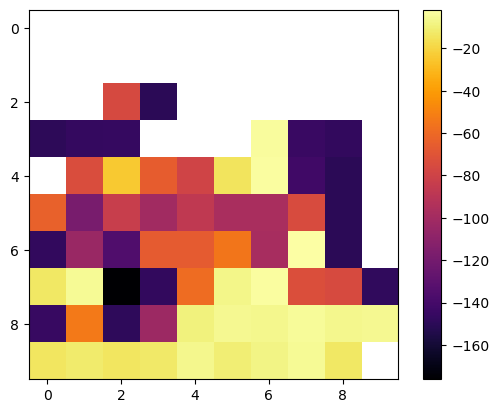

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 29
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 54
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 81
 ┌────────

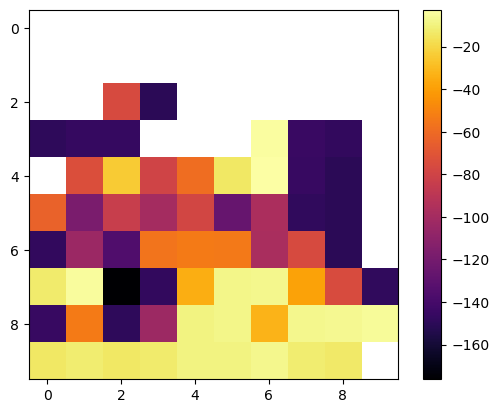

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 28
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 53
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 80
 ┌────────

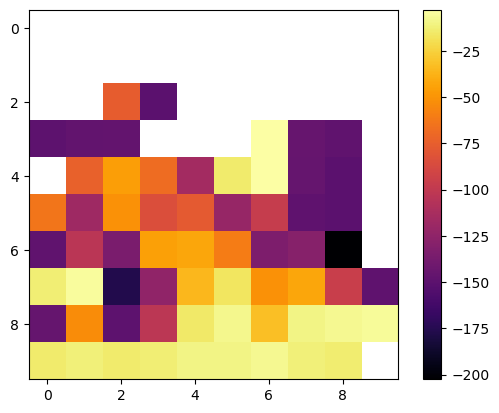

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 29
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 56
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 82
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 108
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 133
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 134
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 135
 ┌─────

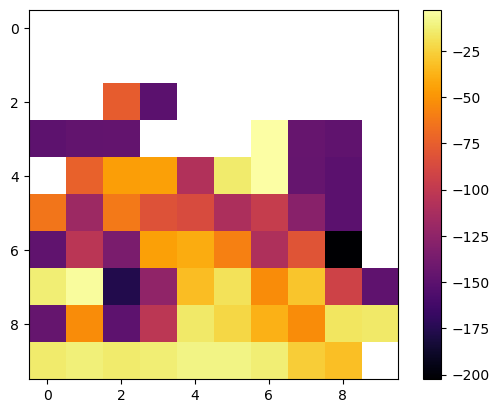

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 28
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 53
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 80
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 103
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 104
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 105
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 129
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 130
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 131
 ┌─────

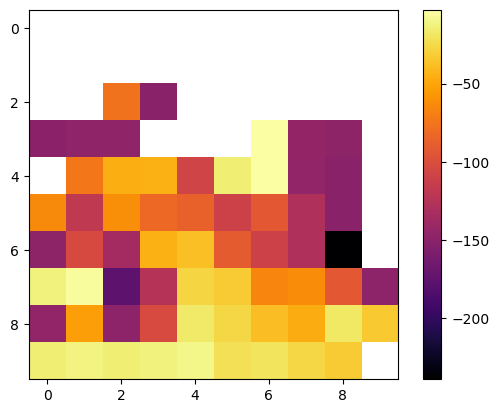

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 29
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←              ×  │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 56
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 57
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 82
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 107
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 133
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 134
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 135
 ┌─────

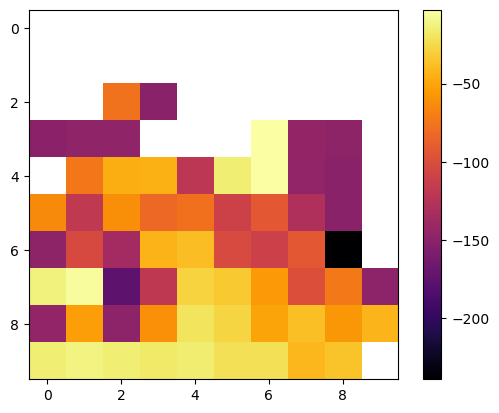

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 27
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 53
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 80
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 104
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 106
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 130
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 132
 ┌─────

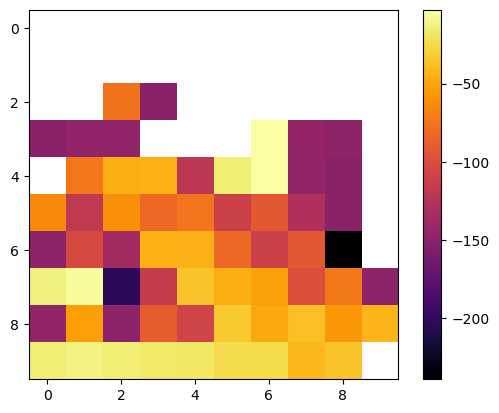

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 28
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 55
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 82
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 108
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 109
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 133
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 134
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ×  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 135
 ┌─────

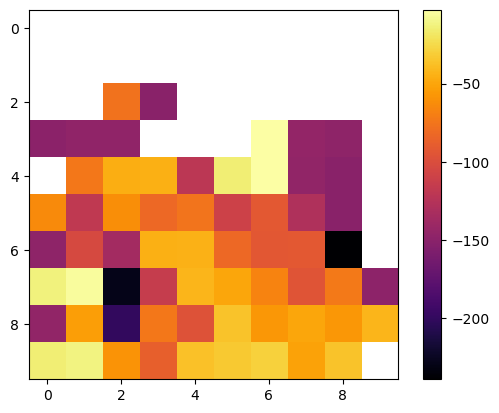

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 29
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 30
 ┌────────

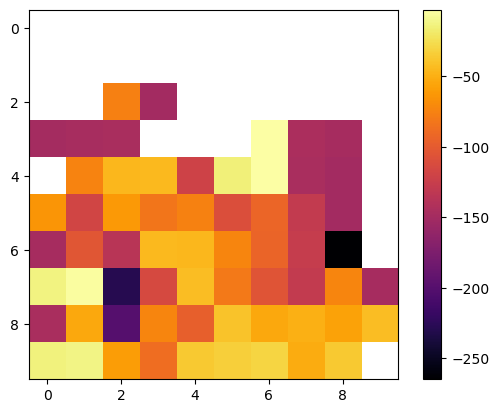

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 2
 ┌───────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 28
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 53
 ┌────────

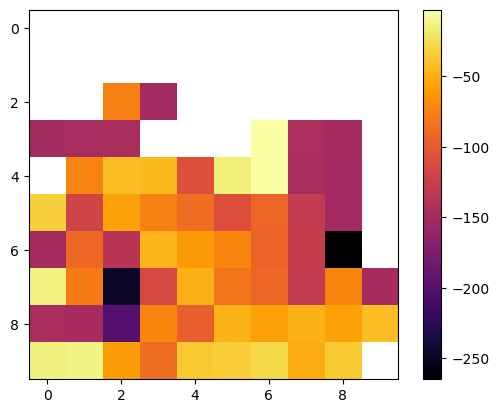

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 28
 ┌─────

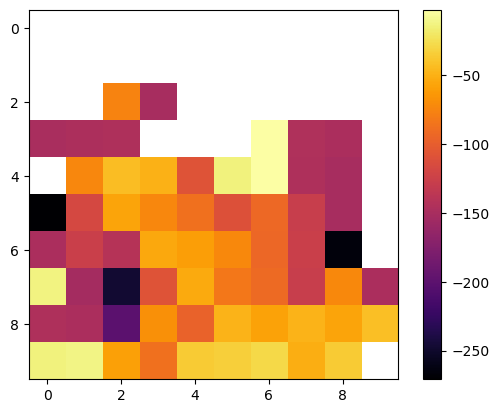

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 29
 ┌─────

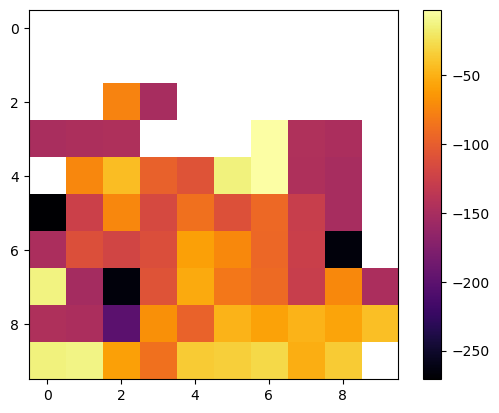

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 28
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 53
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 80
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 107
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ×                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 130
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ×  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 132
 ┌──

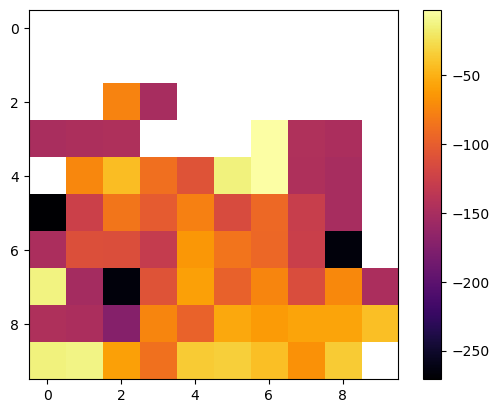

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 82
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 107
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 132
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 133
 ┌──

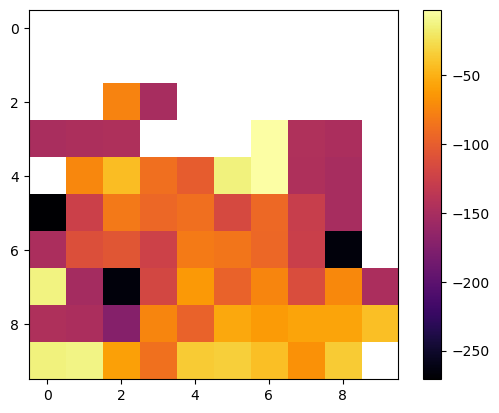

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ×                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 28
 ┌─────

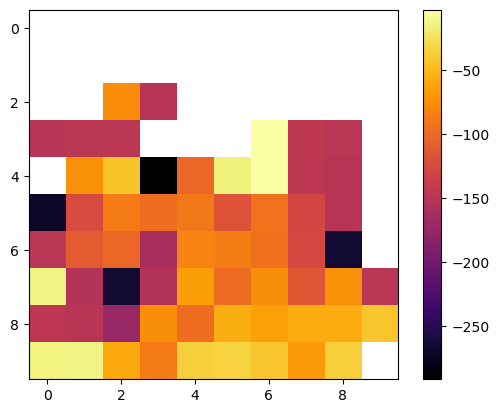

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 77
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 79
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ×                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ×                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 107
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 132
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 133
 ┌──

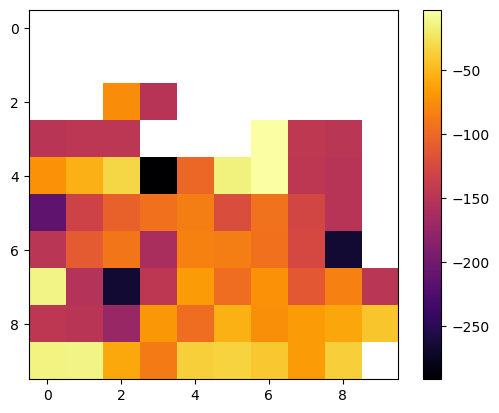

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←              ×  │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 82
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 108
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 132
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 133
 ┌──

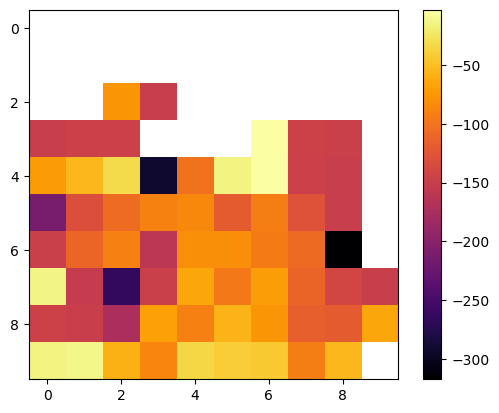

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ×                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ×  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 29
 ┌─────

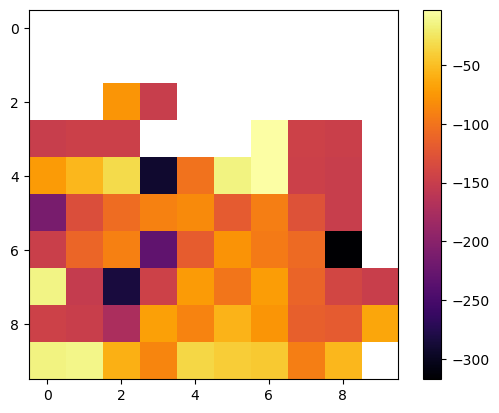

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 18 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 18 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 18 - STEP 2
 ┌────────

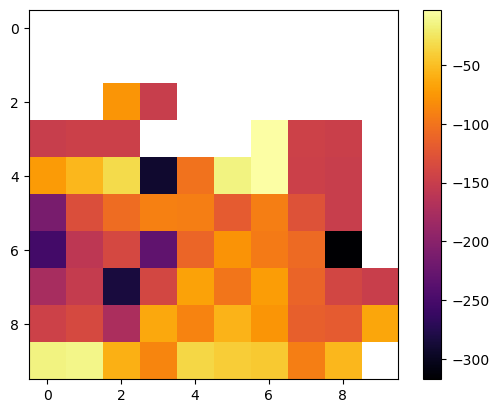

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 19 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 19 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 19 - STEP 2
 ┌────────

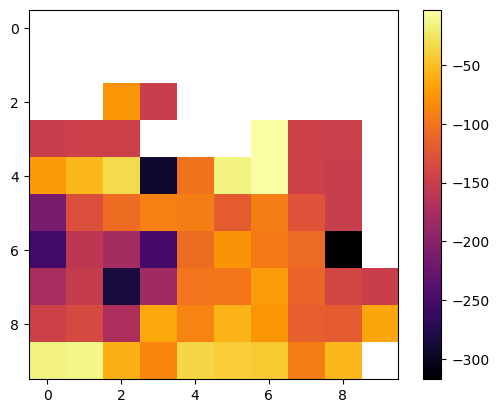

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 20 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 20 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 20 - STEP 2
 ┌────────

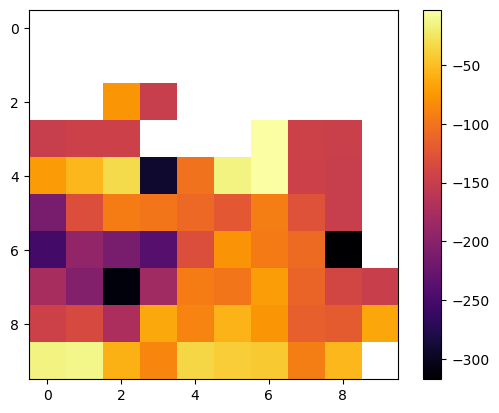

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ×  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ×  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 28
 ┌─────

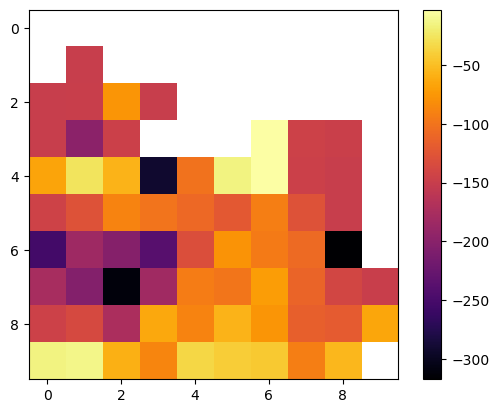

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 22 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 22 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 22 - STEP 2
 ┌────────

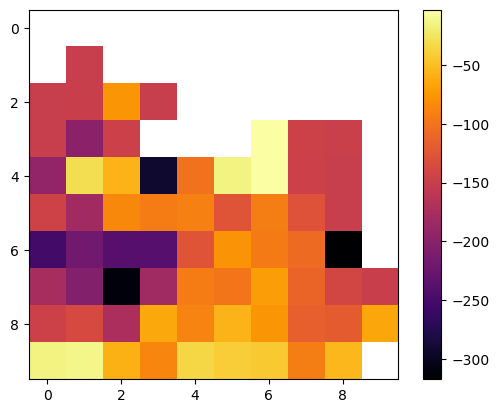

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 23 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 23 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 23 - STEP 2
 ┌────────

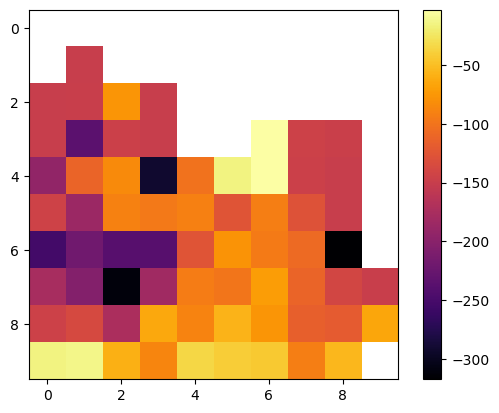

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 81
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 108
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 133
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 134
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 135
 ┌──

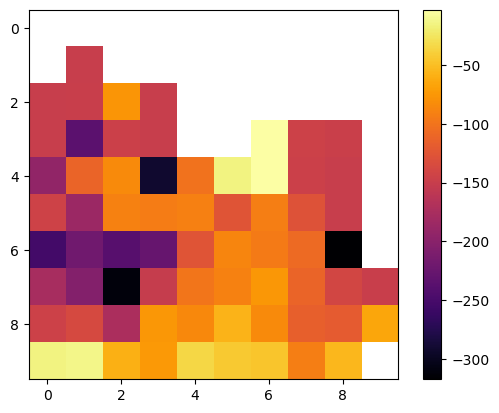

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 27
 ┌─────

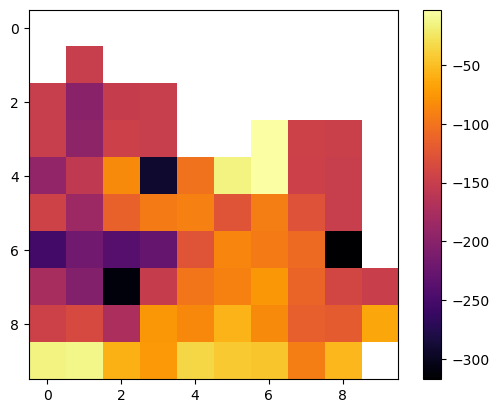

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 55
 ┌─────

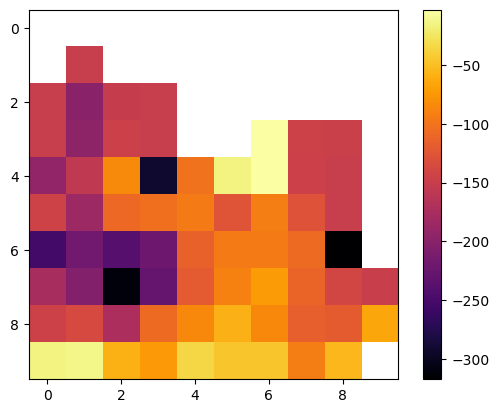

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 81
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 108
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 133
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 134
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 135
 ┌──

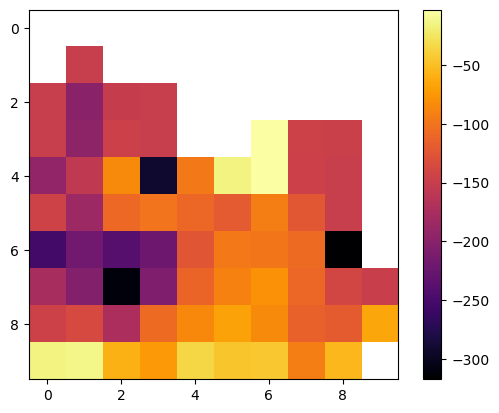

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 29
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 30
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ×  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 81
 ┌─────

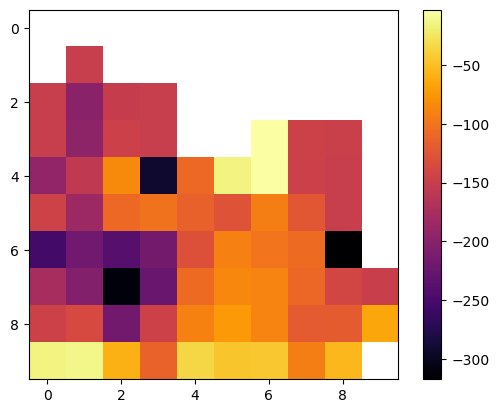

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 54
 ┌─────

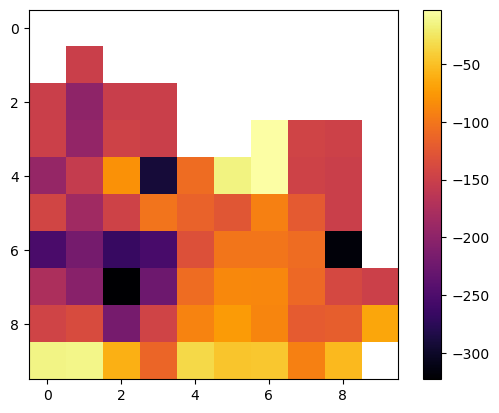

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 53
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 77
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 79
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 104
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 106
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 132
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 133
 ┌──

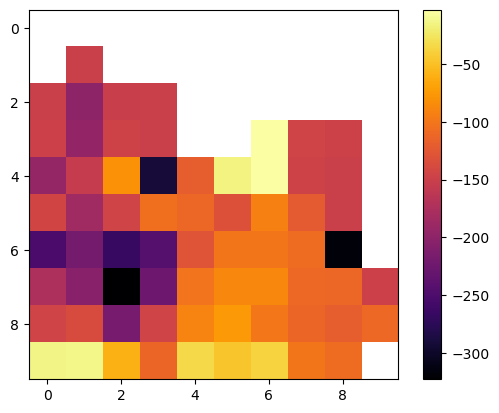

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 53
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 80
 ┌─────

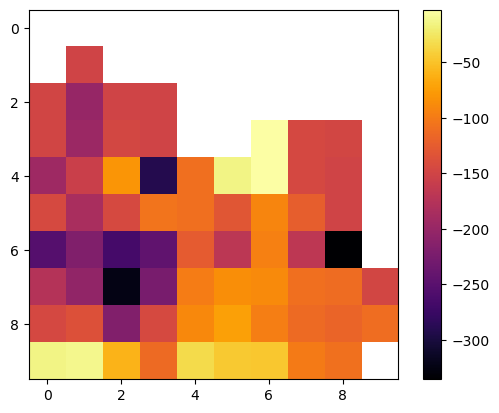

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 82
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 83
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 108
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 109
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 110
 ┌──

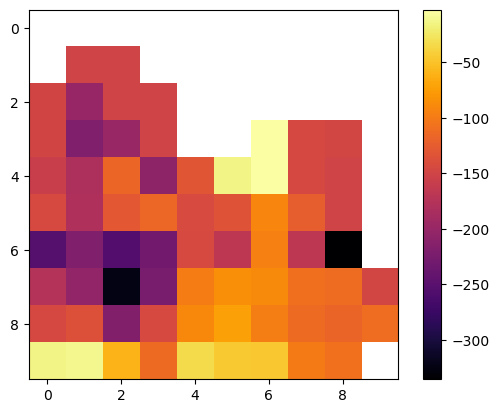

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 27
 ┌─────

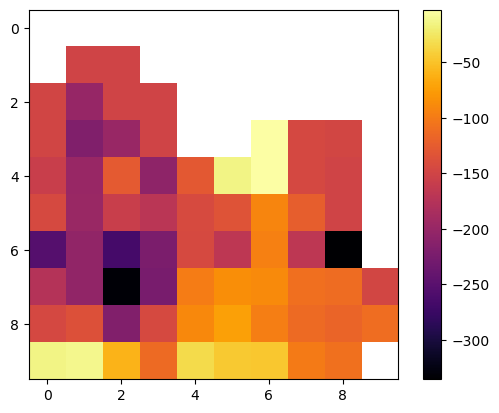

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ×  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 27
 ┌─────

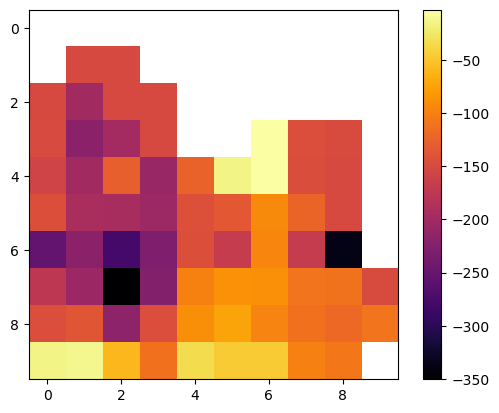

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 28
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 55
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 82
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 108
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 132
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 133
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 134
 ┌──

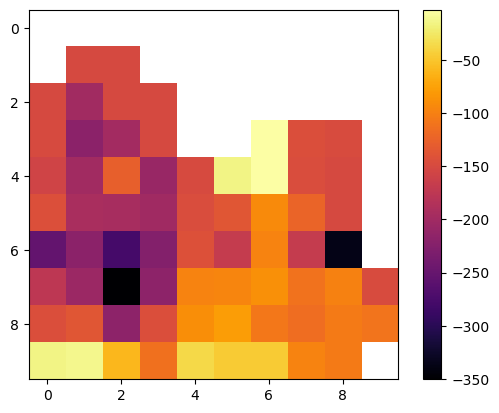

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 81
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 104
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 106
 ┌──

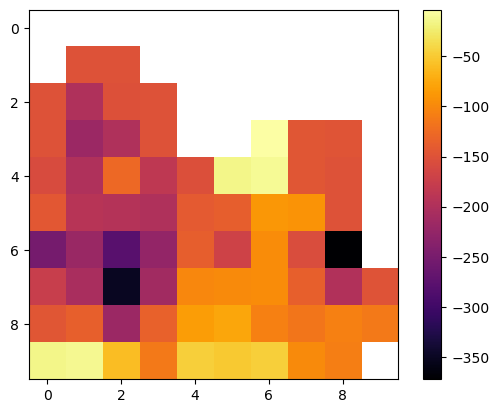

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 29
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 30
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 56
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 57
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←              ×  │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 82
 ┌─────

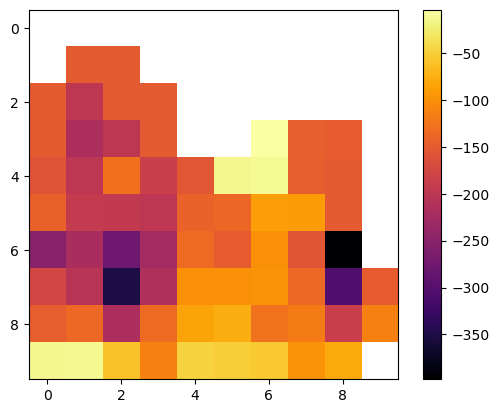

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 50
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←              ×  │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←              ×  │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 52
 ┌─────

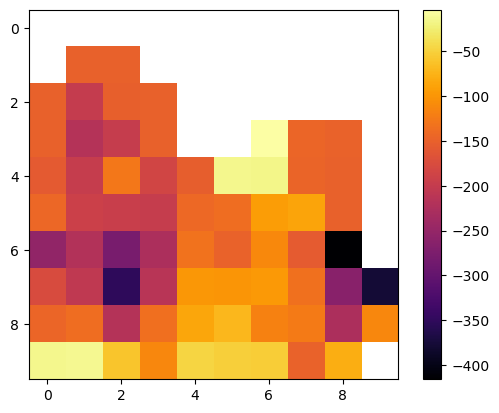

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 39 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 39 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 39 - STEP 2
 ┌────────

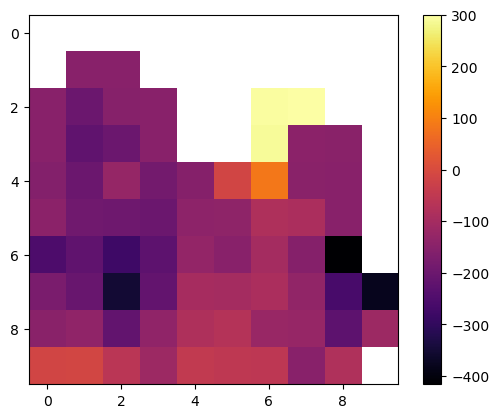

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 40 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 40 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 40 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 40 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ×  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 40 - STEP 28 end


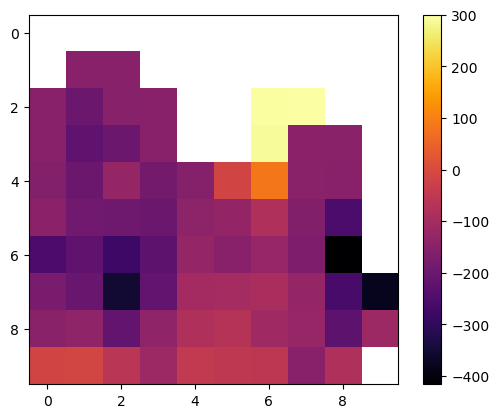

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 54
 ┌─────

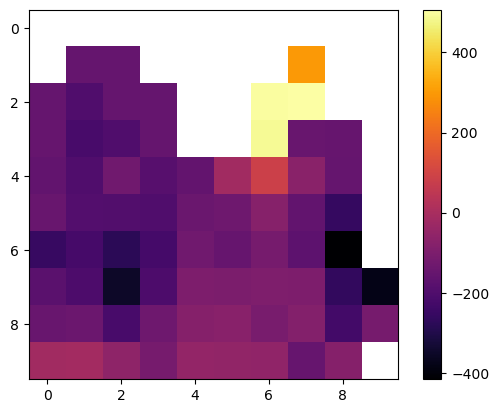

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 28 end


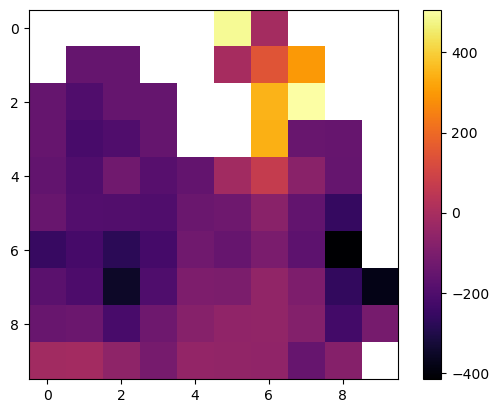

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 43 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 43 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 43 - STEP 2
 ┌────────

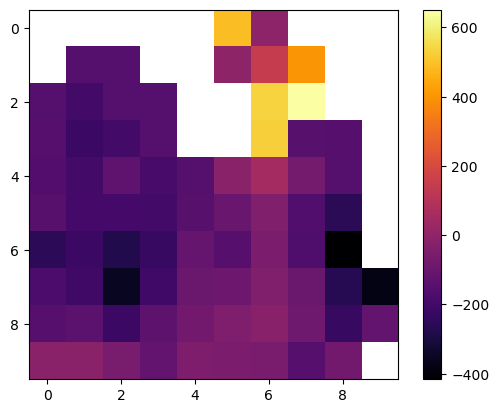

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 44 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 44 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 44 - STEP 2
 ┌────────

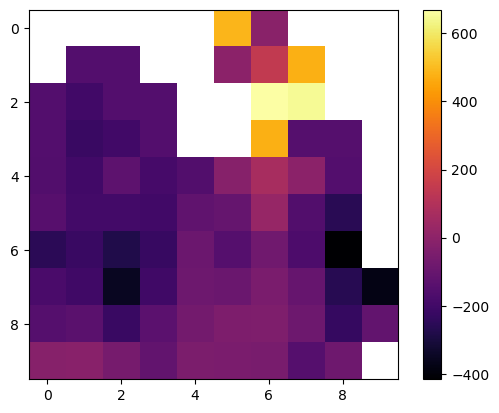

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 45 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 45 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 45 - STEP 2
 ┌────────

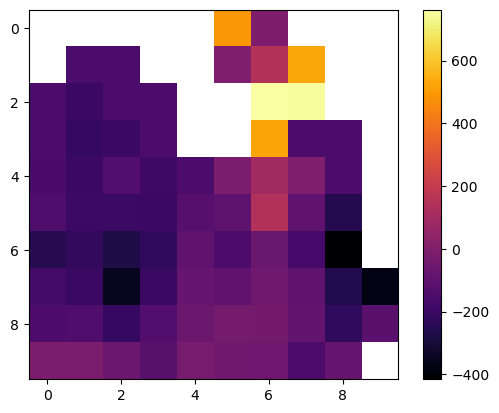

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 46 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 46 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 46 - STEP 2
 ┌────────

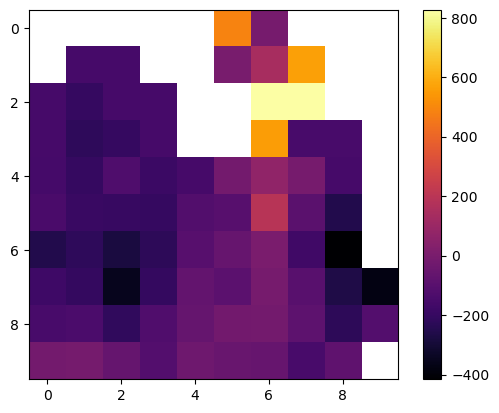

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  ×     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │     ×        │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ×  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 29
 ┌─────

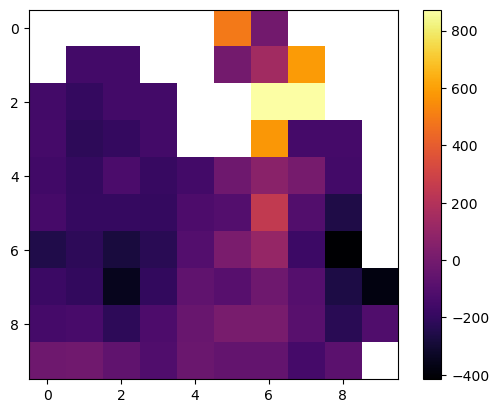

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  ×     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │     ×        │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 27
 ┌─────

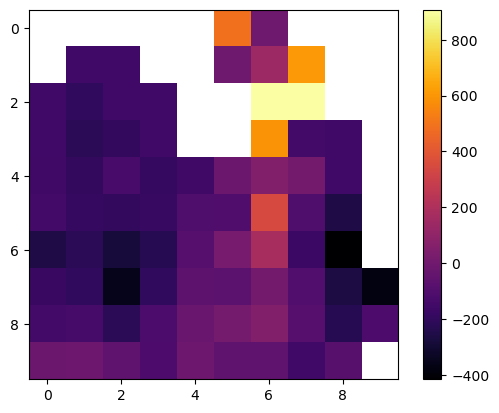

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 49 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 49 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 49 - STEP 2
 ┌────────

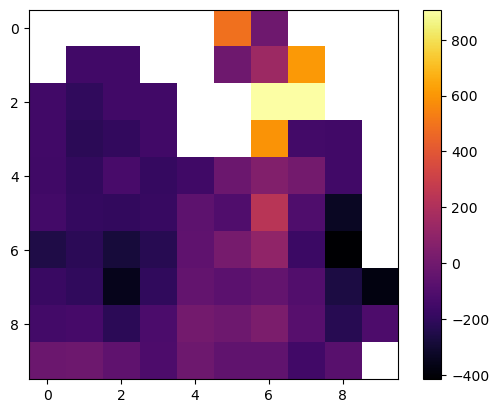

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 28
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 77
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 79
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 102
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 103
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 104
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 130
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 132
 ┌──

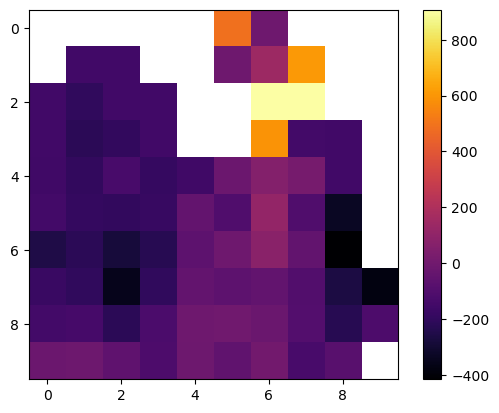

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 55
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 82
 ┌─────

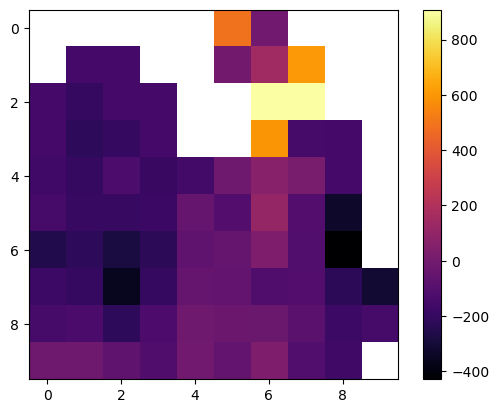

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 29
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 30
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 56
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 57
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 58
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ×                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 82
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 83
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 108
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 109
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 110
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 134
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 135
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 136
 ┌──

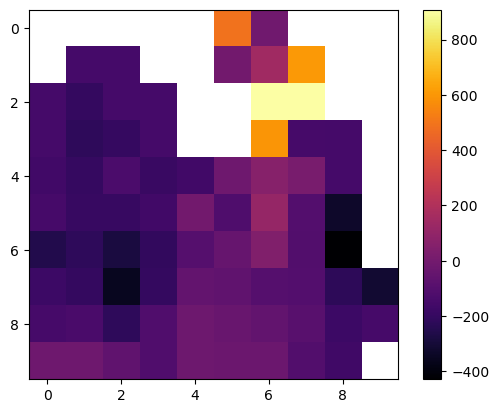

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 82
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 83
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 108
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 109
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  ×     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 133
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  ×     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 134
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │     ×        │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 135
 ┌──

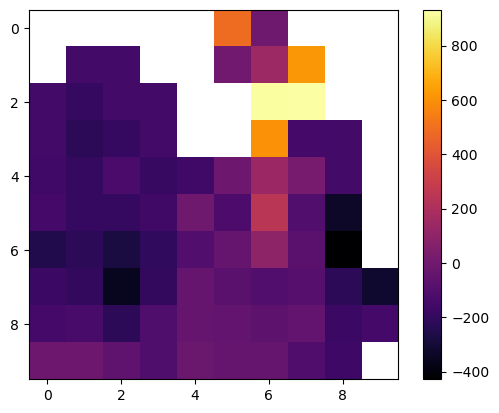

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 81
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 104
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 106
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 130
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 132
 ┌──

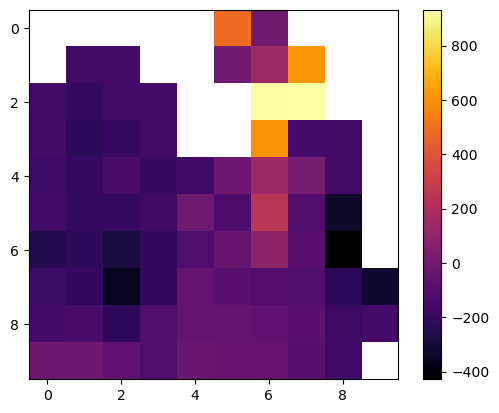

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 27
 ┌─────

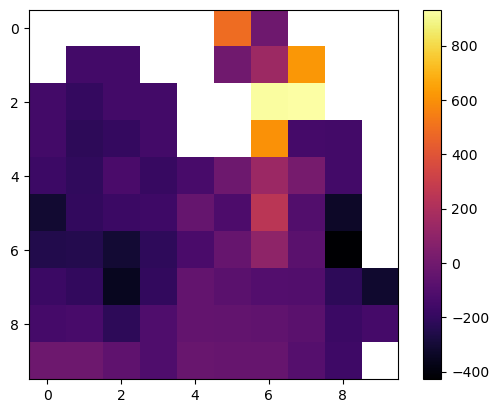

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 82
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 83
 ┌─────

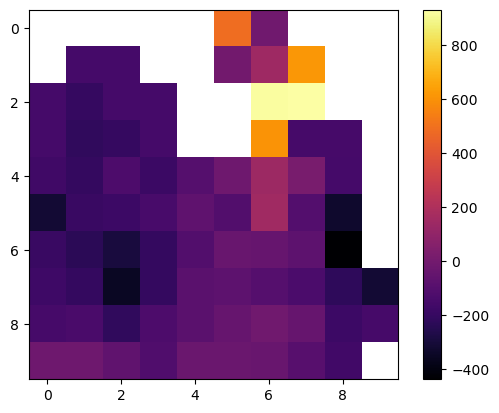

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 57 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 57 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 57 - STEP 2
 ┌────────

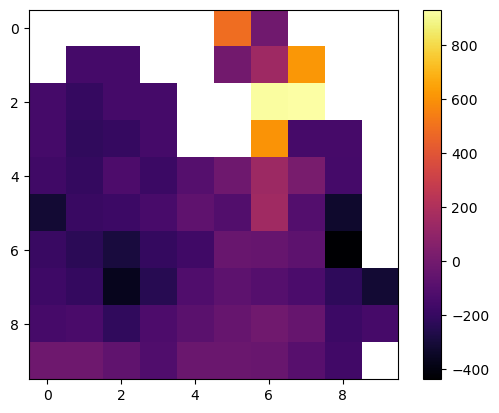

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 55
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 81
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 105
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 107
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 130
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 132
 ┌──

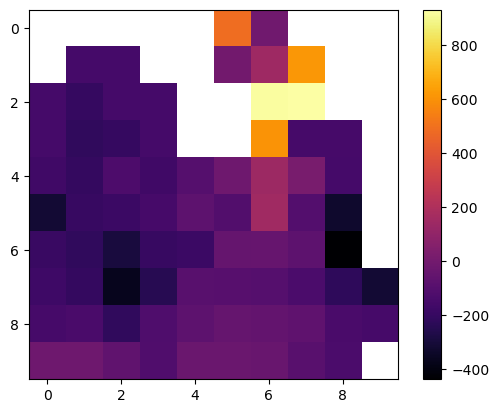

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 28
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 51
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 53
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ×  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 77
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ×  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ×  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 79
 ┌─────

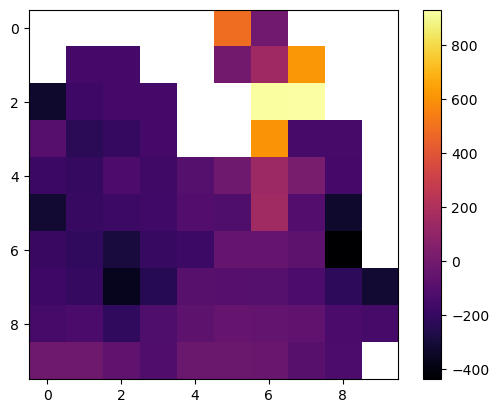

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 80
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 103
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 104
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →  ×  ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 105
 ┌──

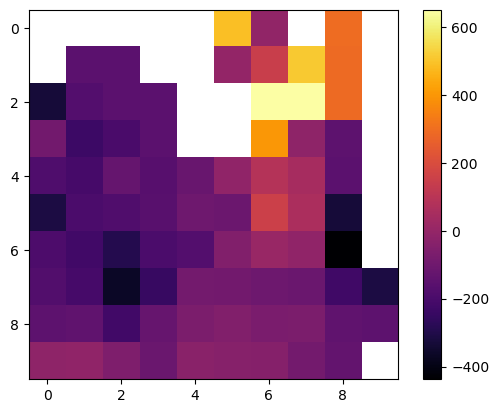

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 28
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ×                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ×  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 53 end


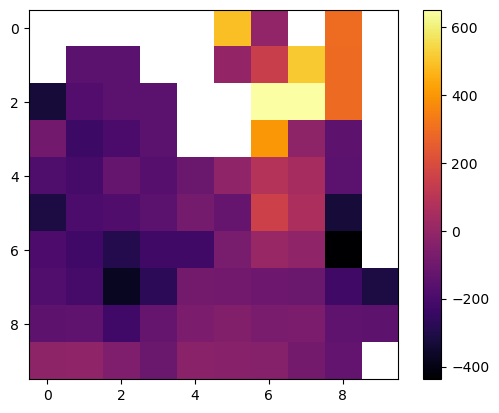

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 81
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 108
 ┌──

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 131
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 132
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 133
 ┌──

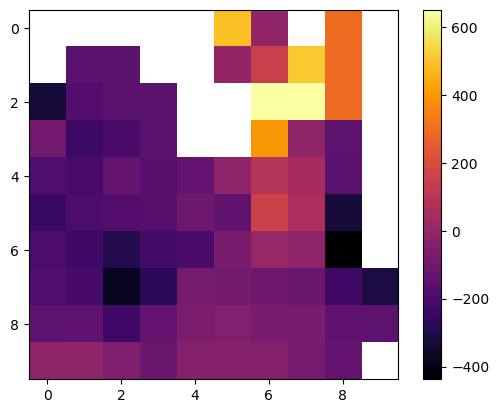

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ×  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ×  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ×  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 29
 ┌─────

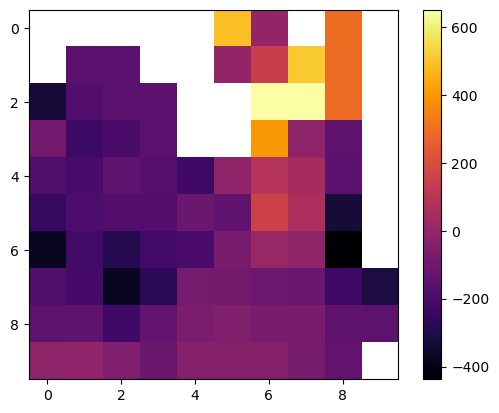

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 82
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 83
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →  ×  ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 108
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 109
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 110
 ┌──

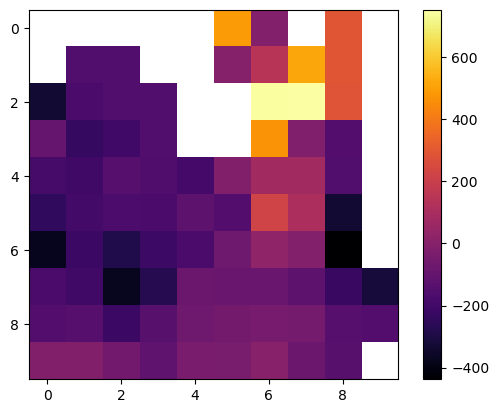

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │  ×           │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 56
 ┌─────

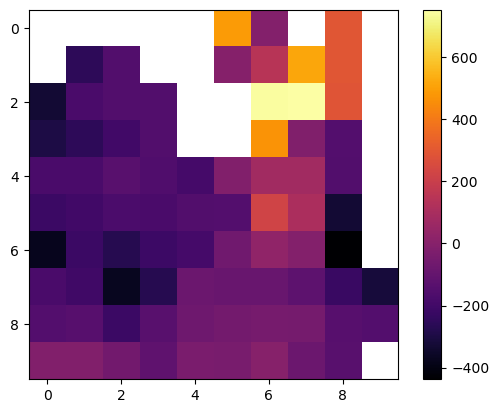

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 29
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 30
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 81
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 106
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 108
 ┌──

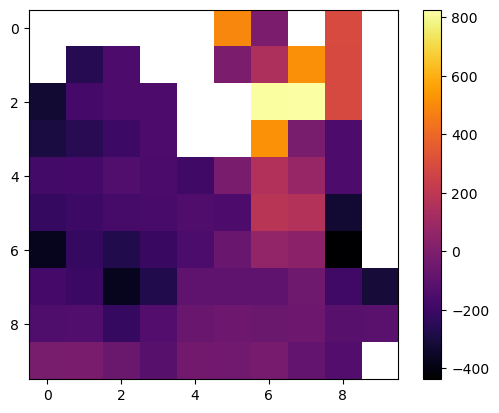

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 27
 ┌─────

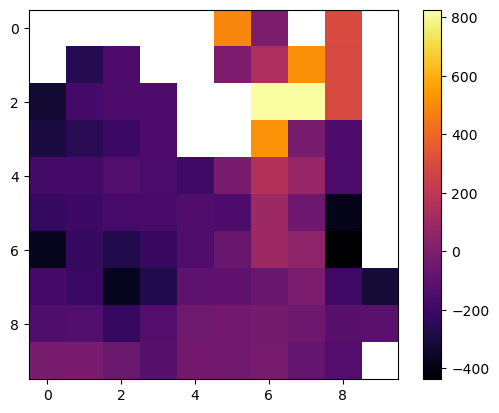

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 68 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 68 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 68 - STEP 2
 ┌────────

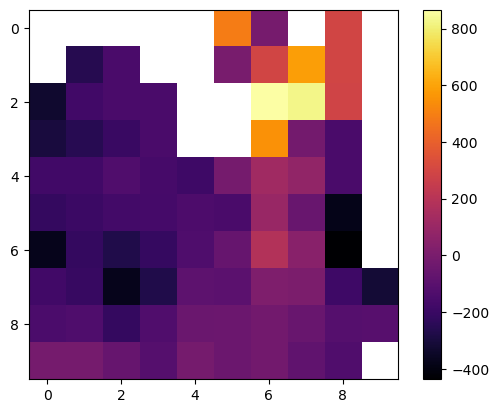

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 29
 ┌─────

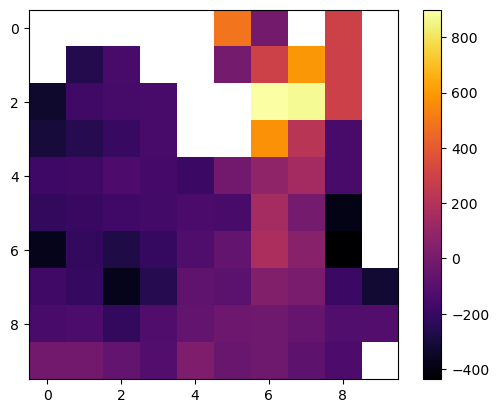

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 27
 ┌─────

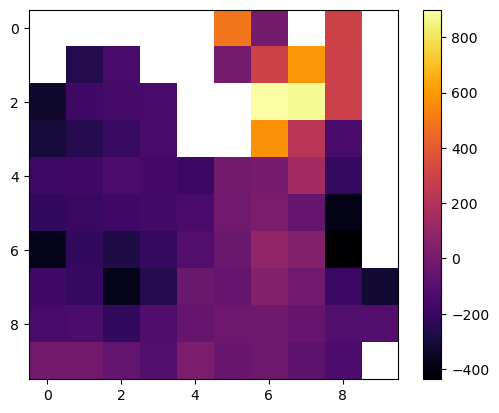

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 71 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 71 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 71 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ×  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 71 - STEP 27 end


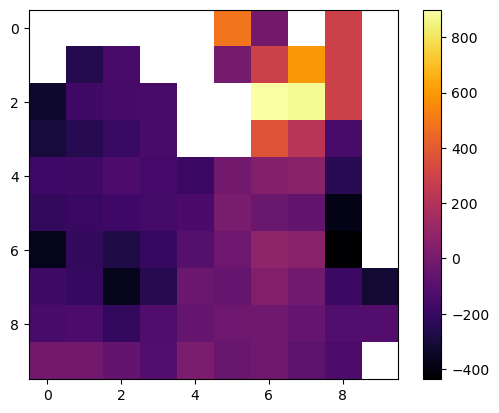

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 29
 ┌─────

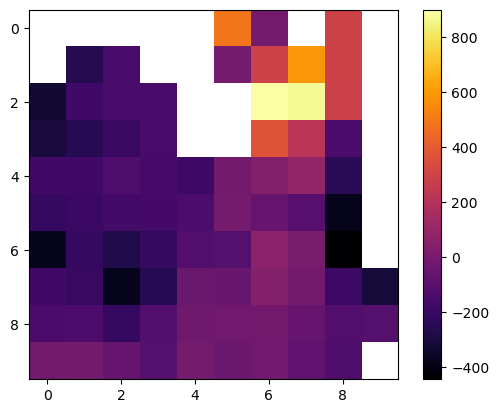

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →  ×  ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  ×     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │        ×     │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 27
 ┌─────

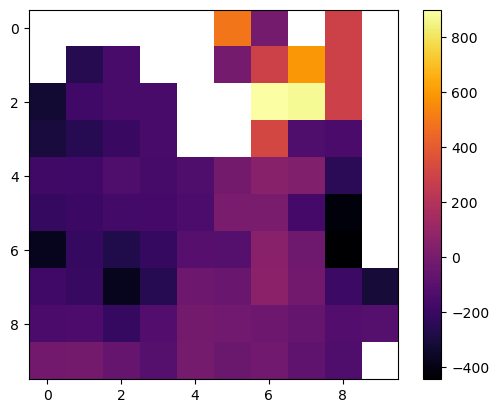

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 56
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 80
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 81
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 82
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 107
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 108
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 109
 ┌──

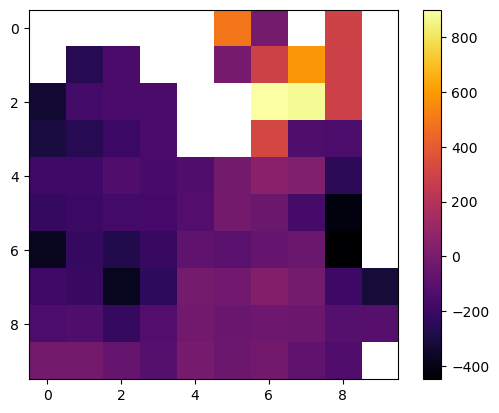

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 54
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖           ×     │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 78
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 79
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 80
 ┌─────

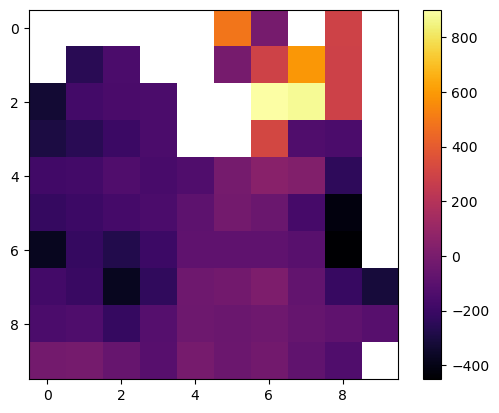

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →  ×  ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  ×     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 56
 ┌─────

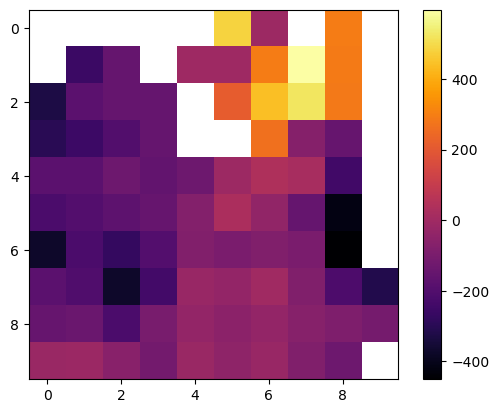

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 29
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │        ×     │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ×  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 55
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ×  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 56
 ┌─────

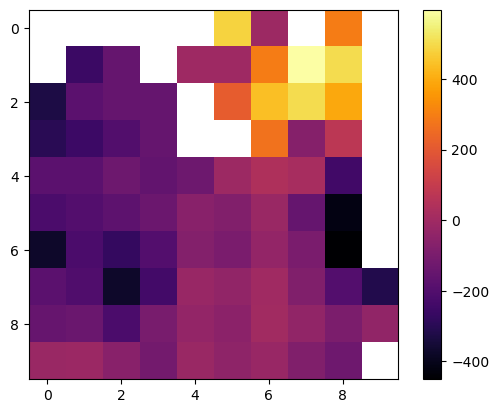

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 78 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 78 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 78 - STEP 2
 ┌────────

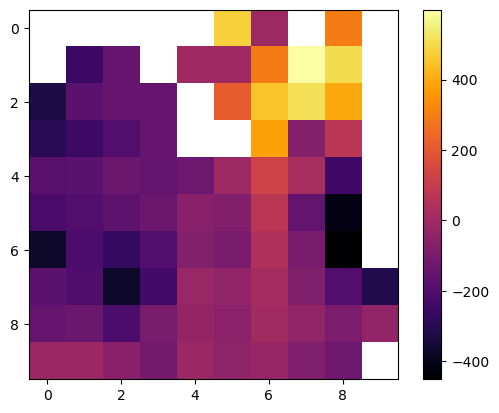

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 79 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 79 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 79 - STEP 2
 ┌────────

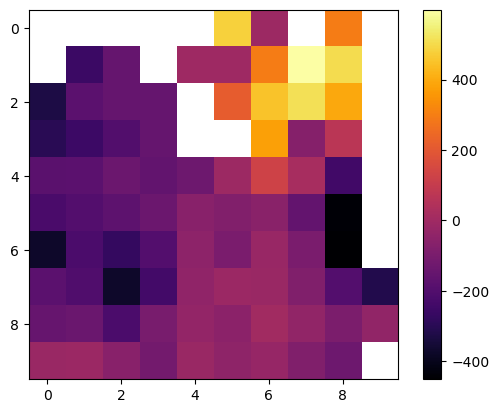

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖        ×        │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 27
 ┌─────

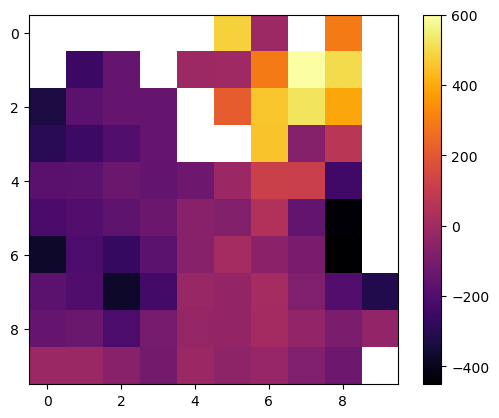

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ×                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 27
 ┌─────

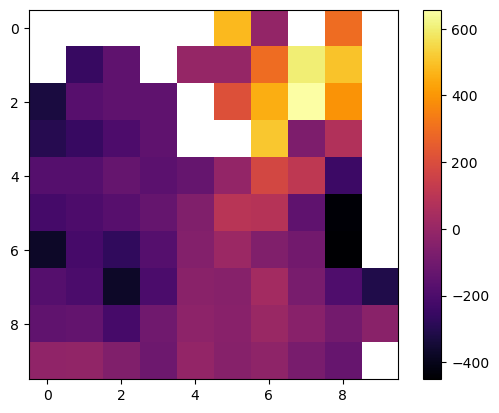

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 82 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 82 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 82 - STEP 2
 ┌────────

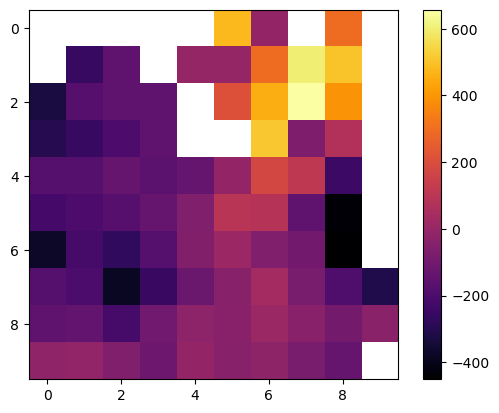

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 27
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 52
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 54
 ┌─────

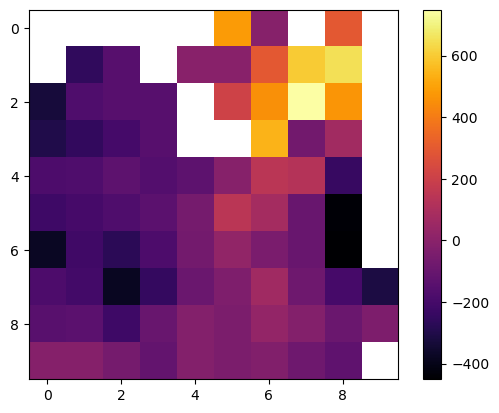

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ×  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 27 end


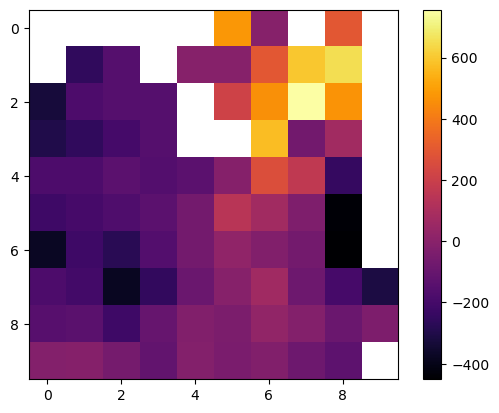

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 85 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 85 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 85 - STEP 2
 ┌────────

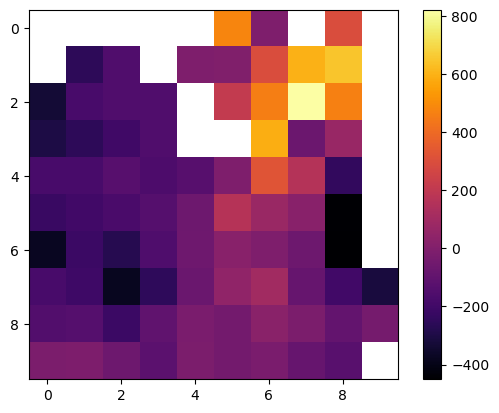

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ×  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ×  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 27 end


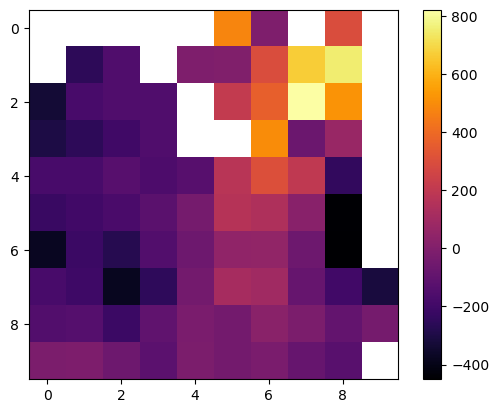

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 87 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 87 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 87 - STEP 2
 ┌────────

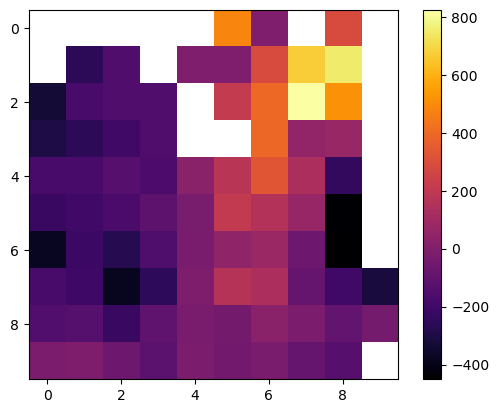

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 88 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 88 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 88 - STEP 2
 ┌────────

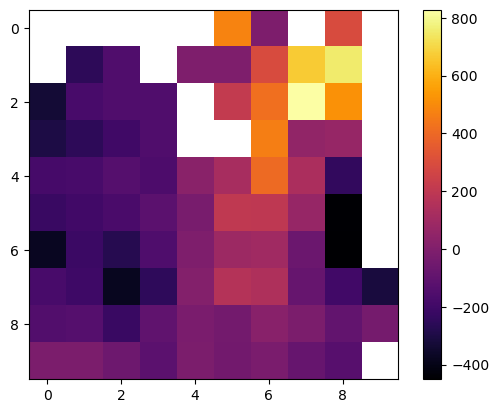

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 89 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 89 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 89 - STEP 2
 ┌────────

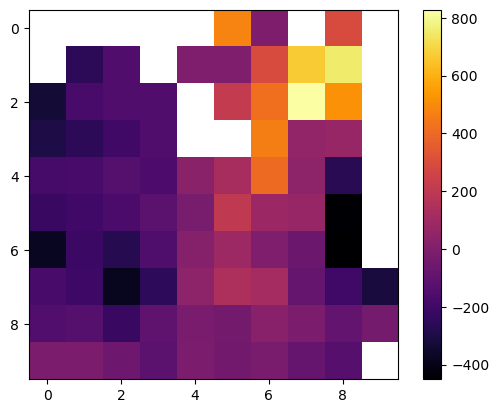

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 90 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 90 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 90 - STEP 2
 ┌────────

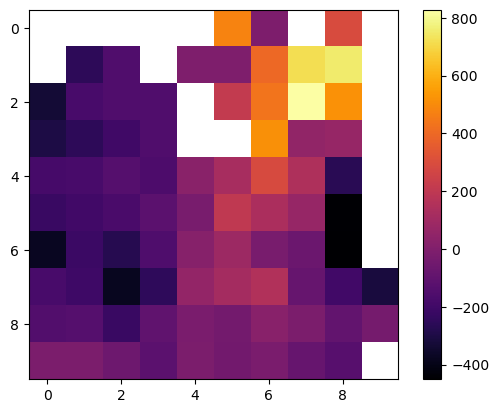

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 25
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ×  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 27
 ┌─────

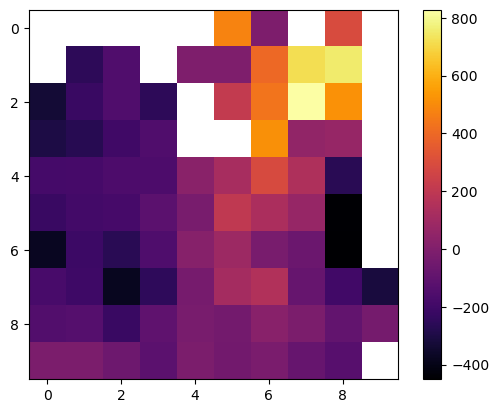

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 92 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 92 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 92 - STEP 2
 ┌────────

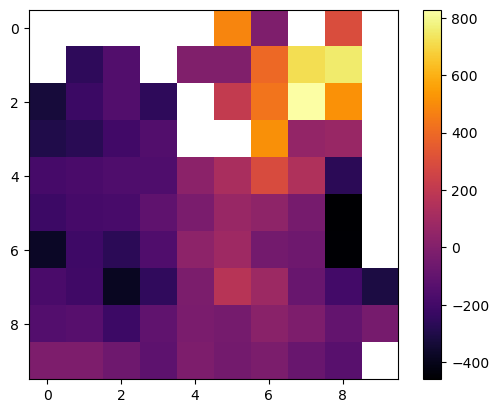

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 26
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 27
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │  × ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 28
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 53
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖     ×           │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 54
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 55
 ┌─────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 80 end


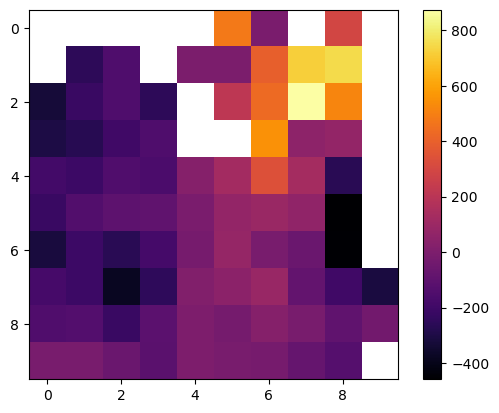

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 94 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 94 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 94 - STEP 2
 ┌────────

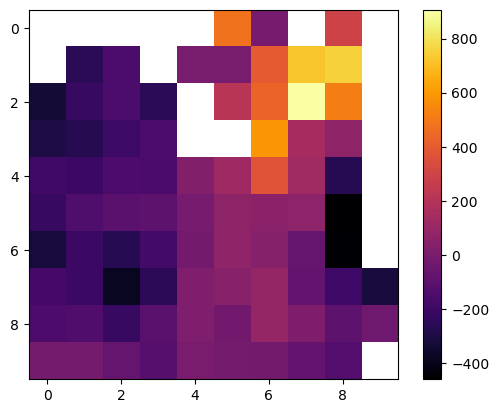

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 95 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 95 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 95 - STEP 2
 ┌────────

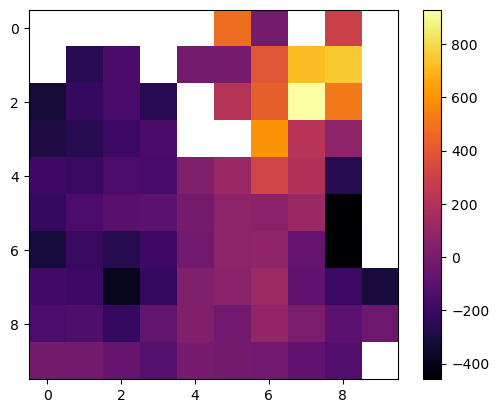

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 96 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 96 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 96 - STEP 2
 ┌────────

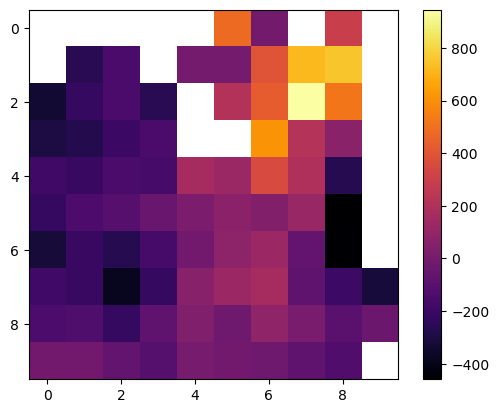

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 97 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 97 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 97 - STEP 2
 ┌────────

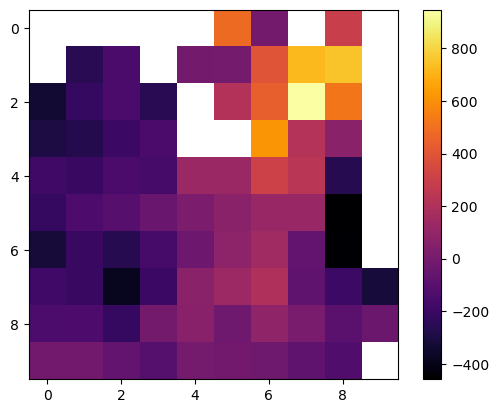

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 2
 ┌────────

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ×  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 28
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ×  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 29
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 30 end


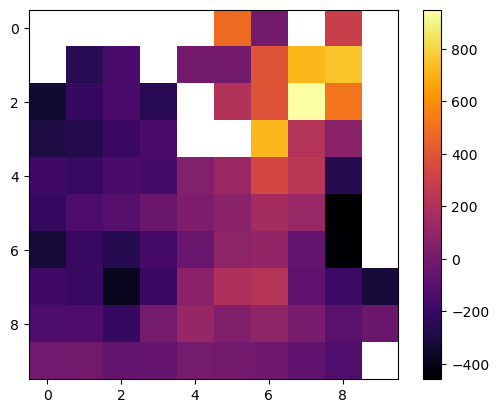

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 99 - STEP 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 99 - STEP 1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 99 - STEP 2
 ┌────────

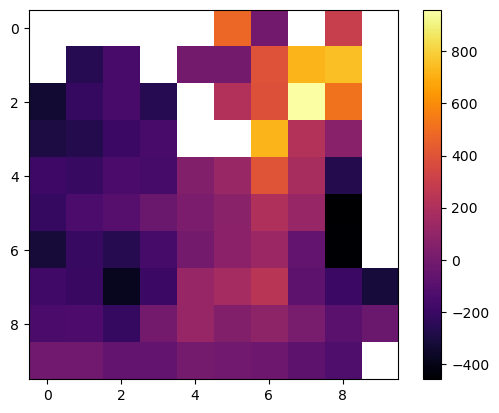

In [113]:
env = GridWORLD()
#env = Labyrinth()
agent = TabularSarsa(env, policy=EpsilonGreedy, alpha=0.3, gamma=0.99, N=5)
#agent = TabularQ(env, policy=Softmax, alpha=0.3, gamma=0.98, N=5)
agent.train(episodes=100, render={'mode': 'human', 'speed': 0.001})

In [115]:
agent.save('gridworld_q_SARSA-01.pkl')
agent.load('gridworld_q_SARSA-01.pkl')
# agent.save('gridworld_q_Q-01.pkl')
# agent.load('gridworld_q_Q-01.pkl')
agent(render={'mode': 'human', 'speed': 0.1})

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗

# MAIN -  Monte Carlo (MC) estimation
###### Since the MC-estimation is equivalent to TD(0) with an infinite number of bootstrapping steps (N=float('inf')), <br>here we implement the tabular MC-estimate Policy Iteration algorithm:

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 0

C:\Users\Jakob\miniconda3\lib\site-packages\ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in true_divide


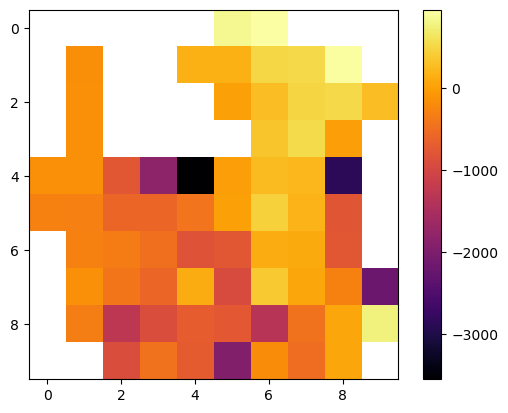

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 1

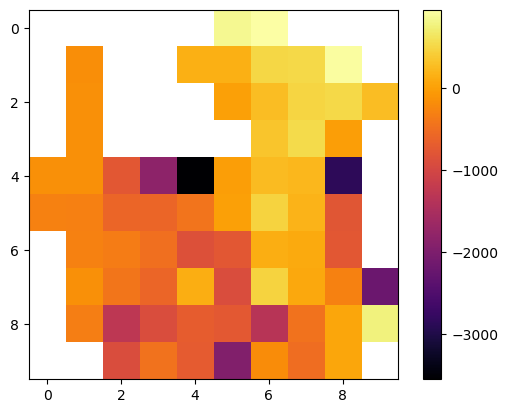

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 2

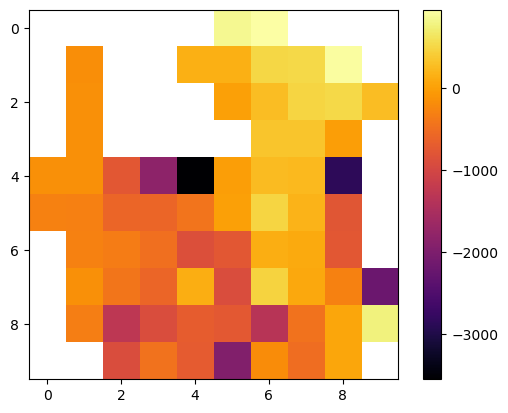

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 3

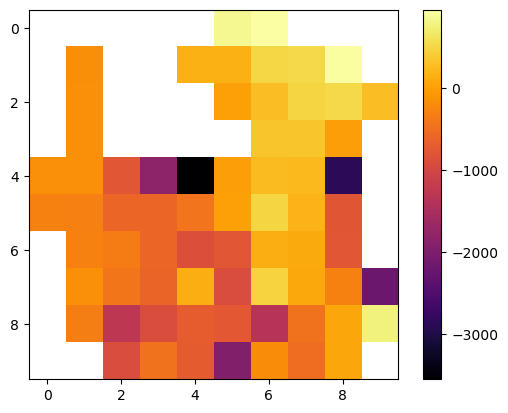

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 4

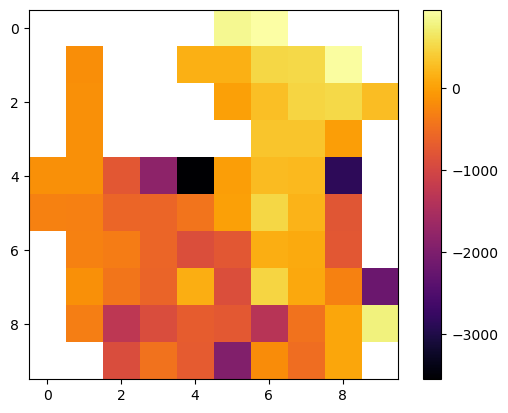

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 5

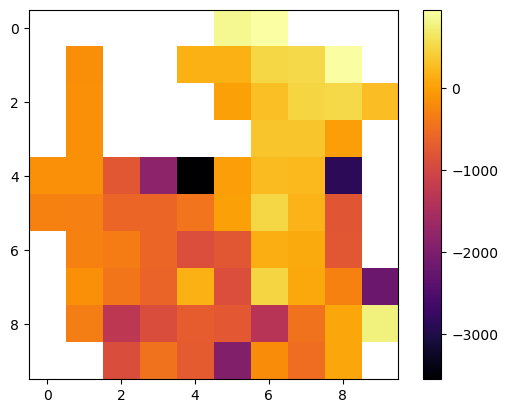

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 6

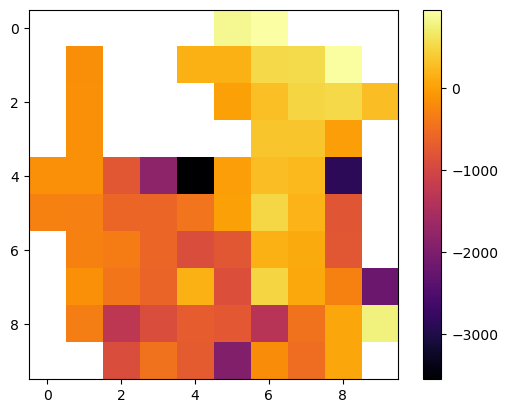

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 7

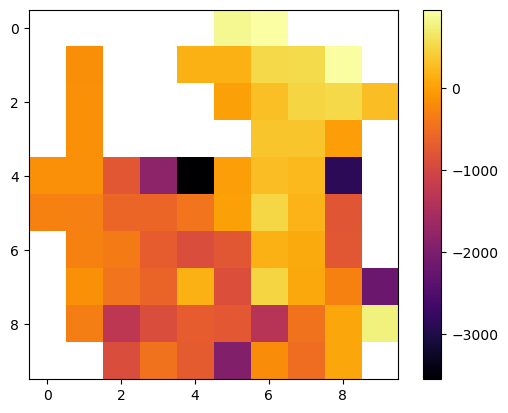

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 8

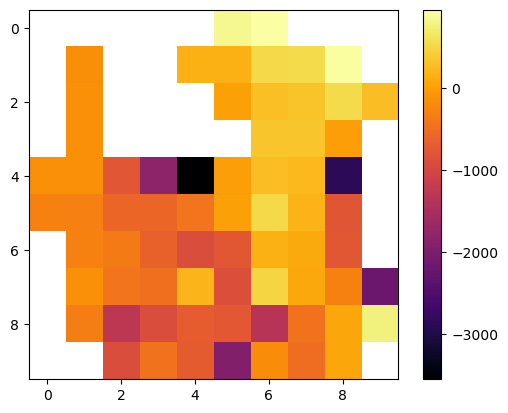

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 9

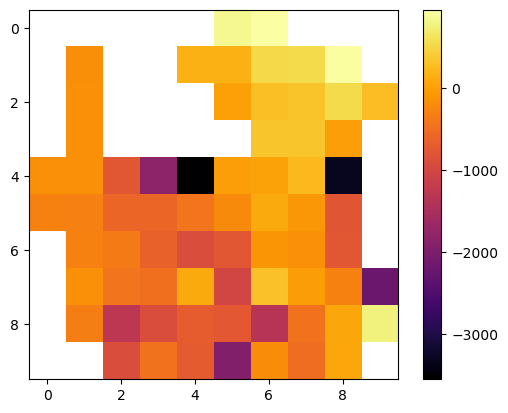

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 10 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

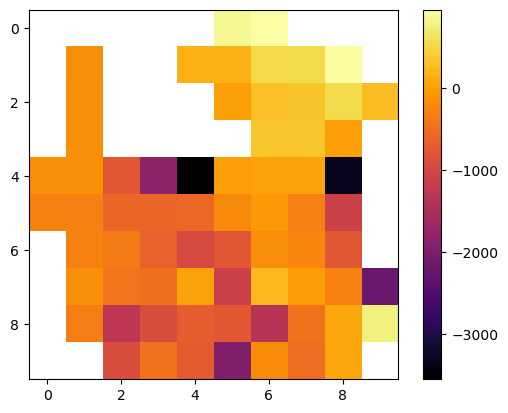

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←              ×  │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 11 - STEP 26 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPIS

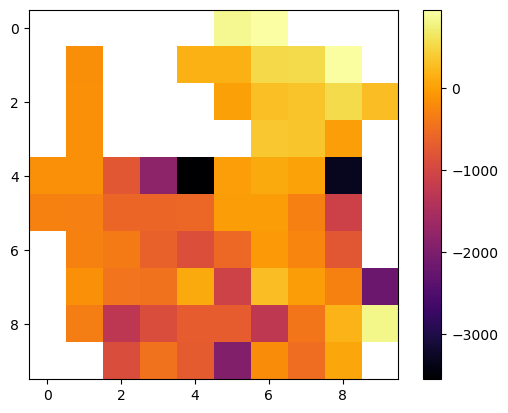

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 24 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 12 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

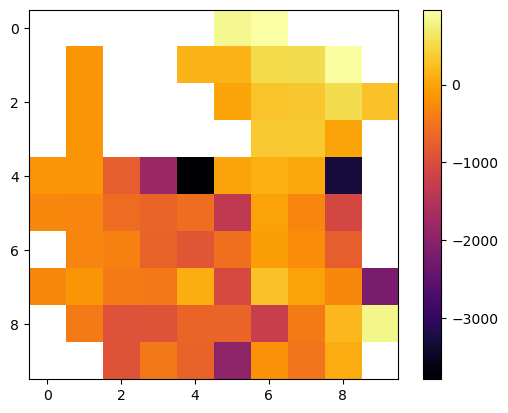

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 26 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 13 - STEP 27 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

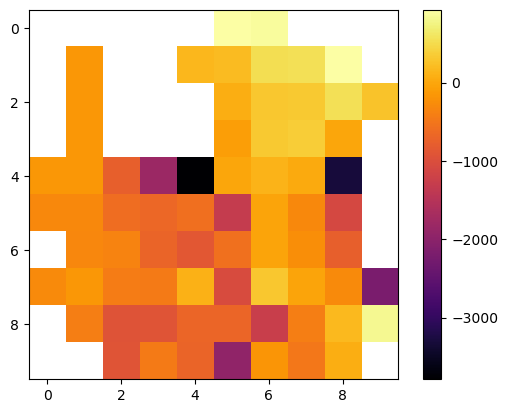

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 50 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 14 - STEP 51 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

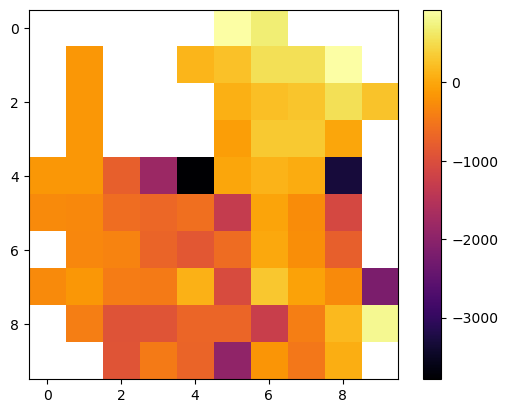

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │     ×        │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 26 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │        ×     │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 15 - STEP 27 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │     ×        │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

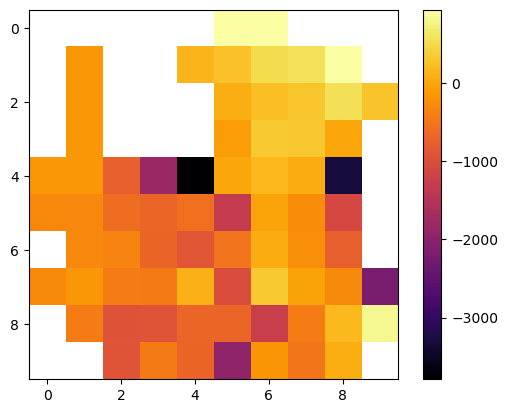

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 24 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 16 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

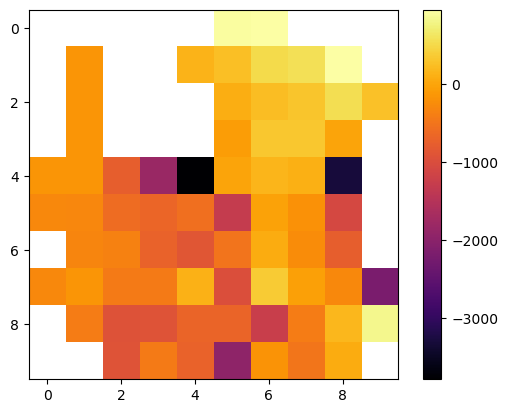

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 17 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

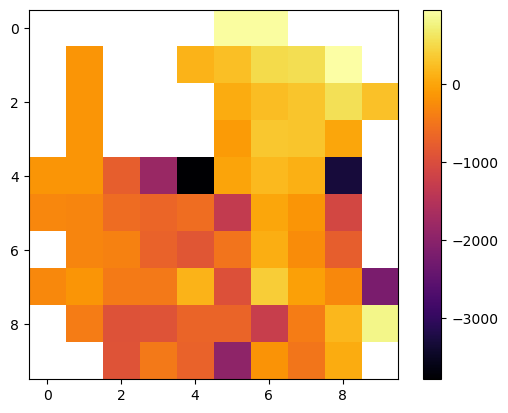

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 18 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 18 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 18 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 18 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

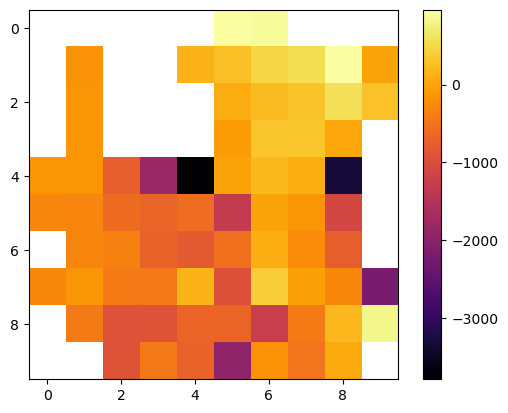

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 19 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 19 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

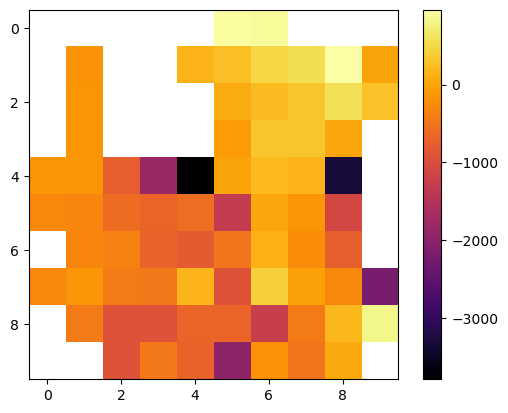

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 20 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 20 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

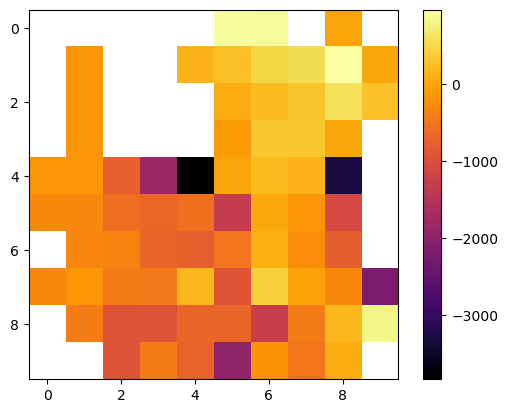

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 21 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

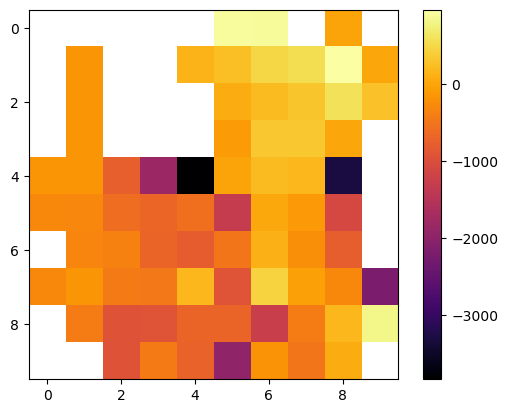

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 22 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 22 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

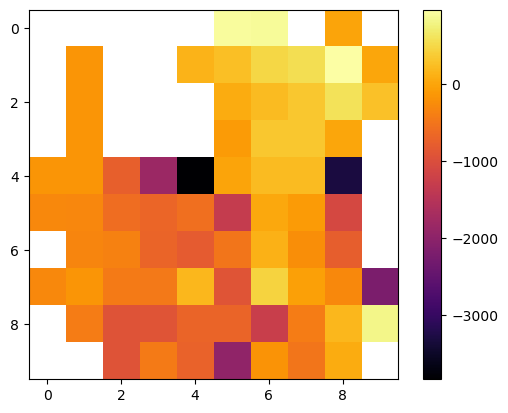

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 23 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 23 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

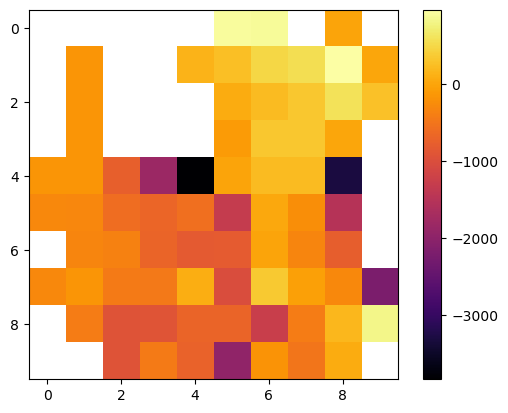

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 24 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

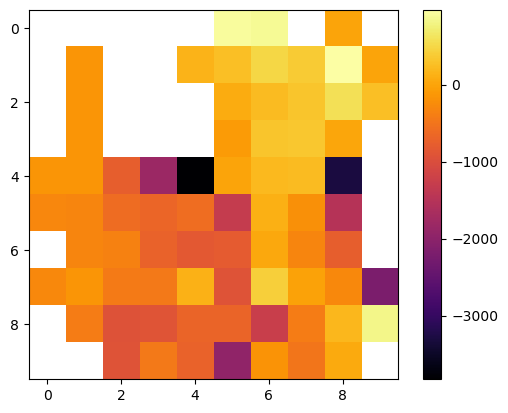

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 25 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

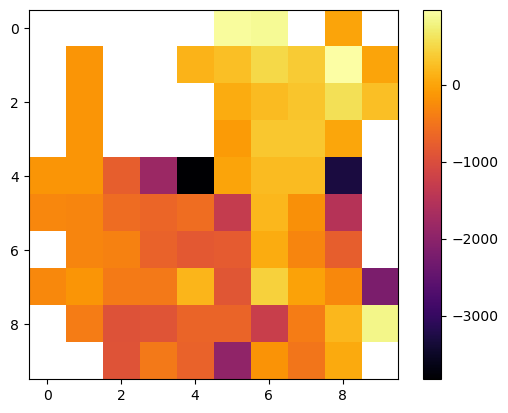

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 26 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

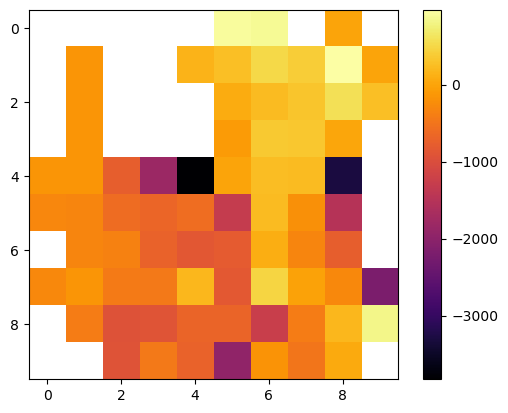

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 27 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

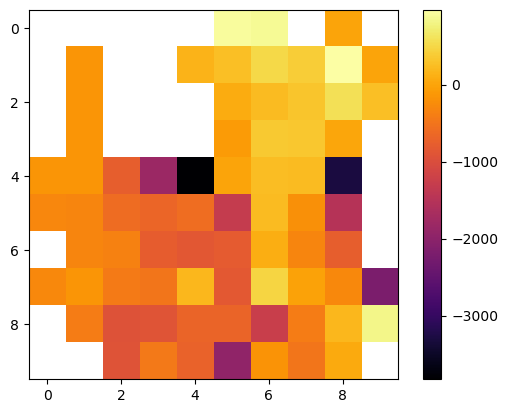

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 28 - STEP 27 end


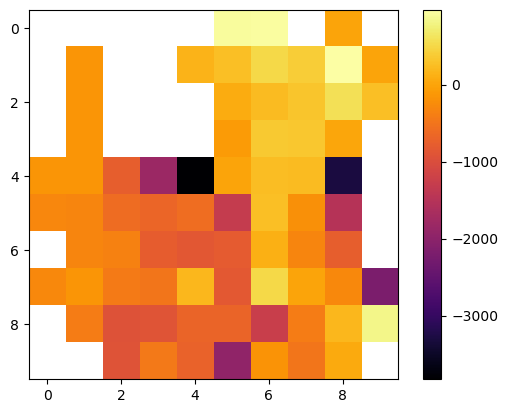

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 29 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

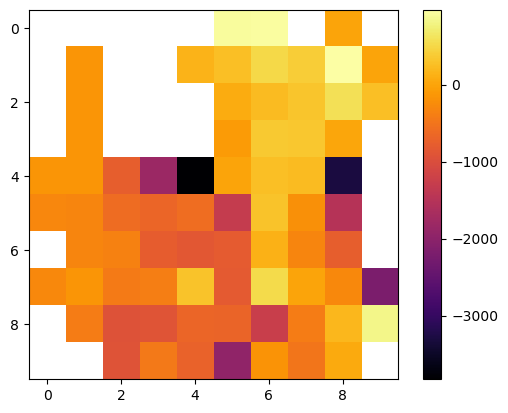

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 30 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

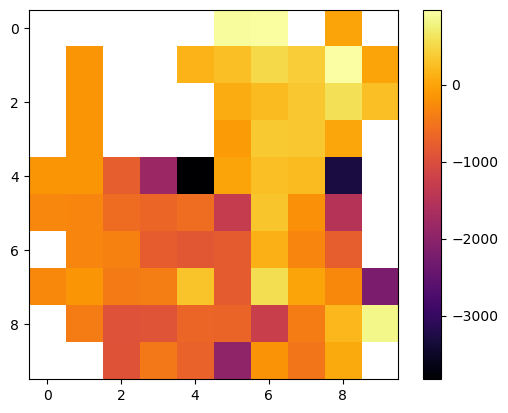

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 31 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

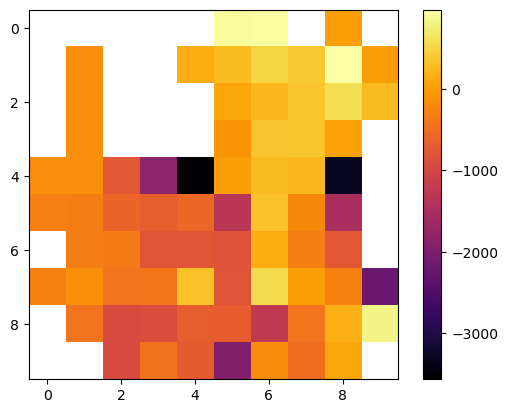

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 32 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

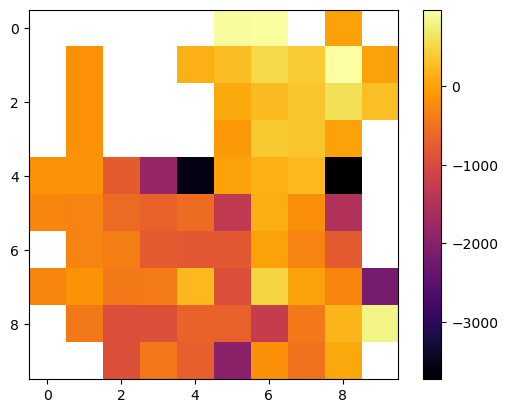

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 33 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

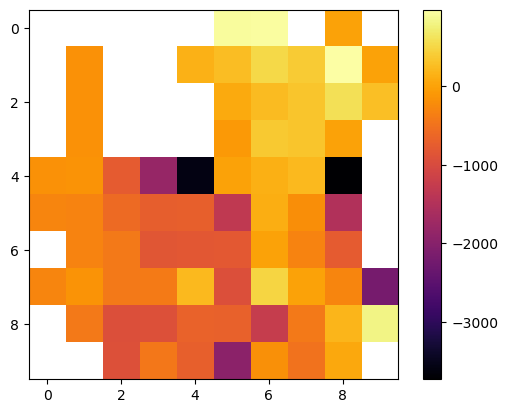

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 34 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

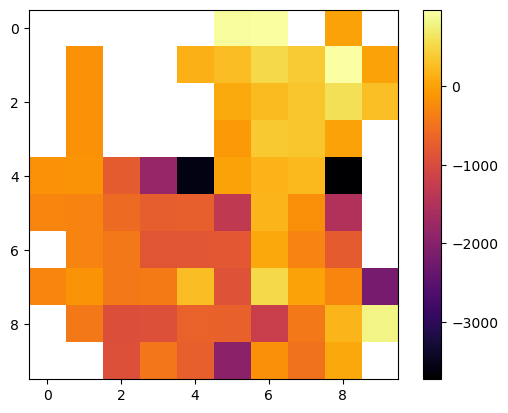

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 35 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

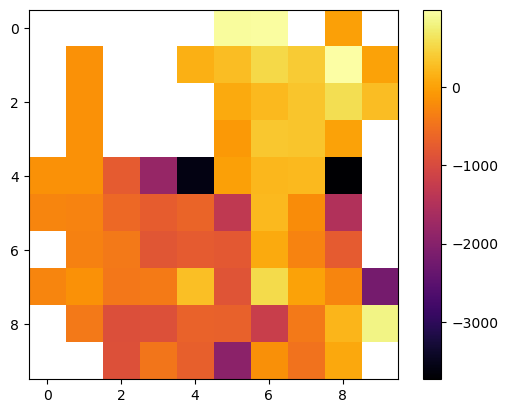

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 36 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

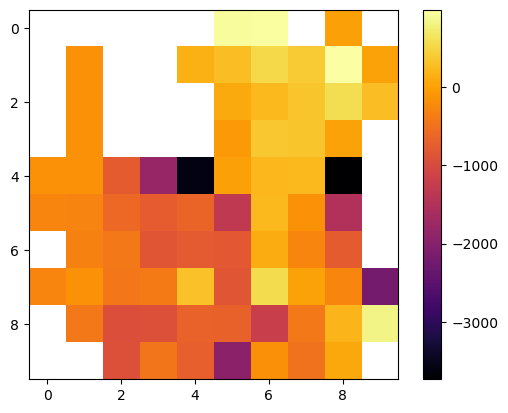

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 37 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

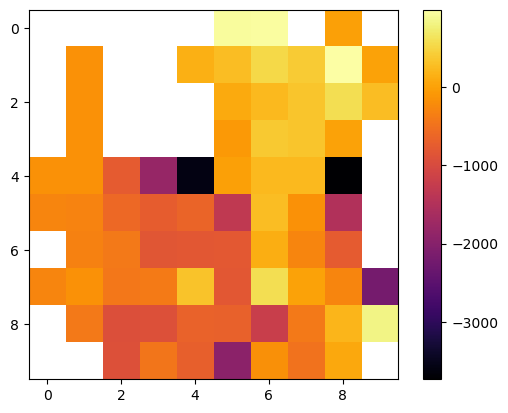

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 38 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

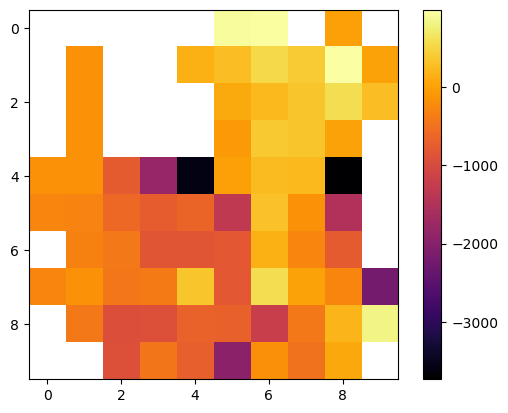

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 39 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 39 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │  ×  ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 39 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │  ×           │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 39 - STEP 26 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │  ×  ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

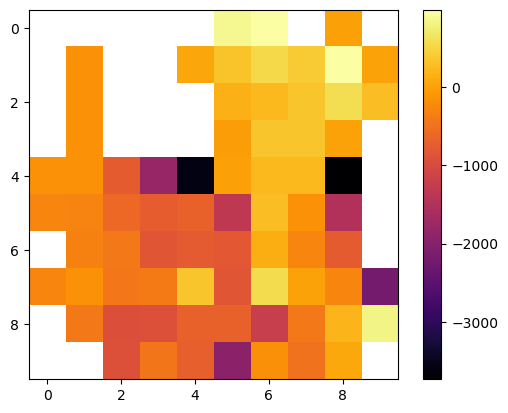

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 40 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 40 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

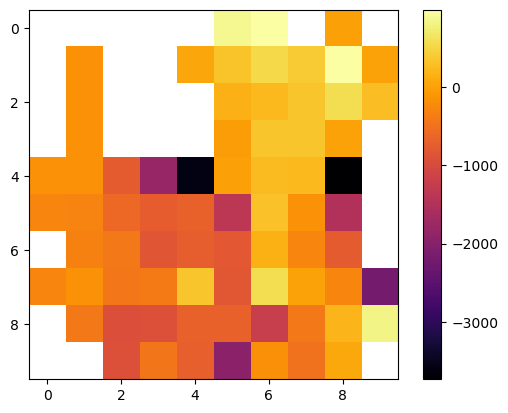

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 41 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

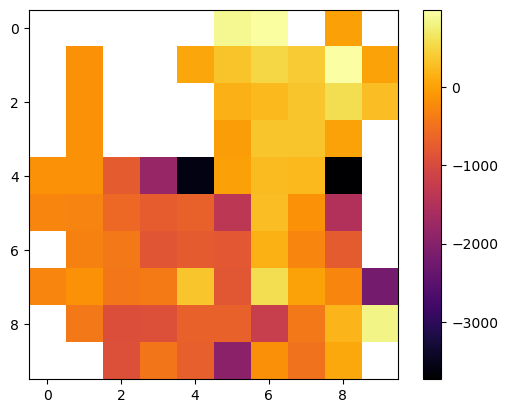

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 42 - STEP 27 end


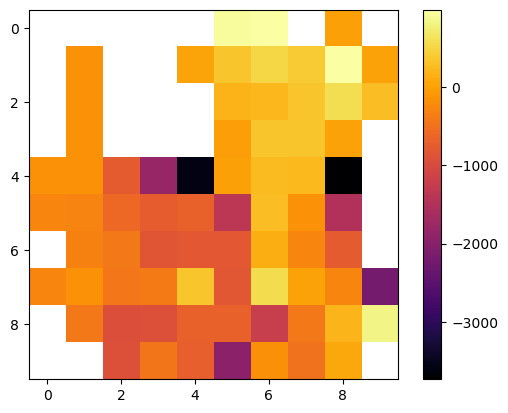

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 43 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 43 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

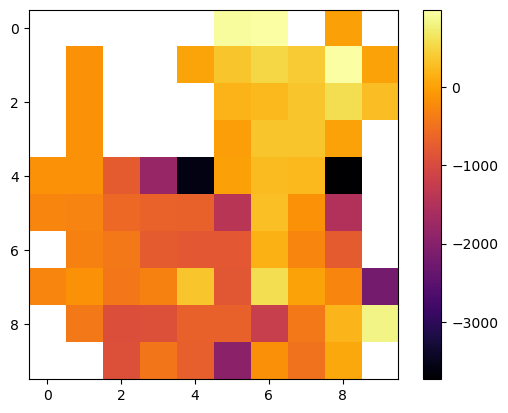

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 44 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 44 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

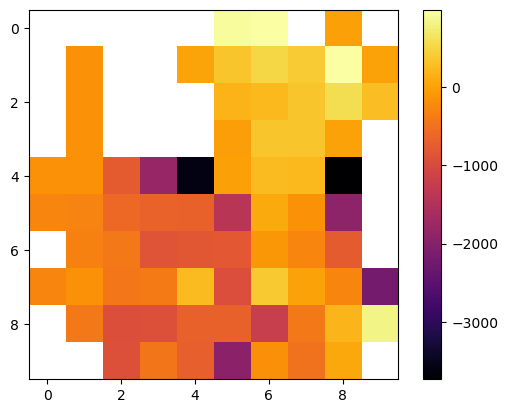

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 45 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 45 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

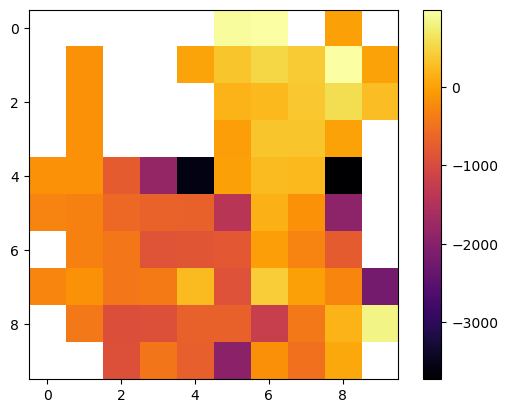

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 46 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 46 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

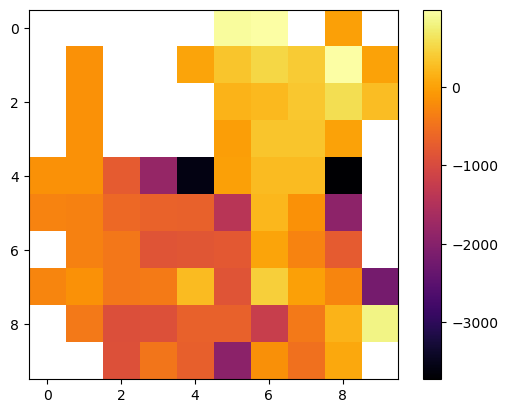

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 47 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

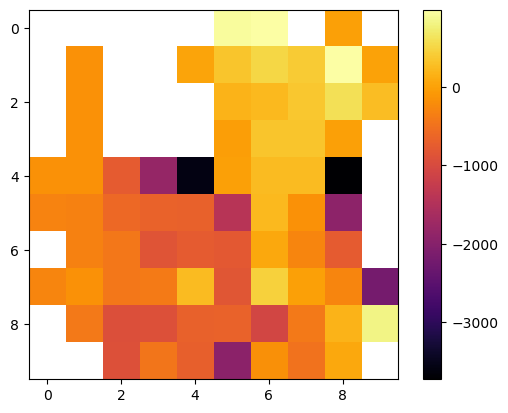

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 48 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

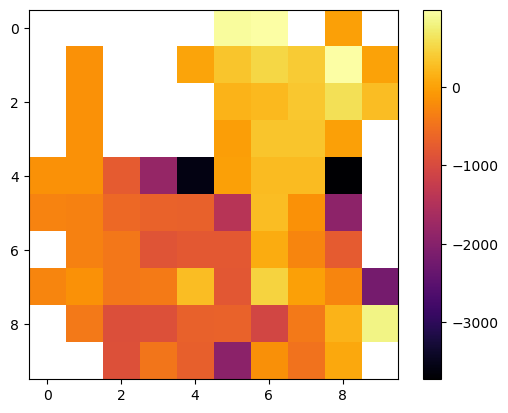

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 49 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 49 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

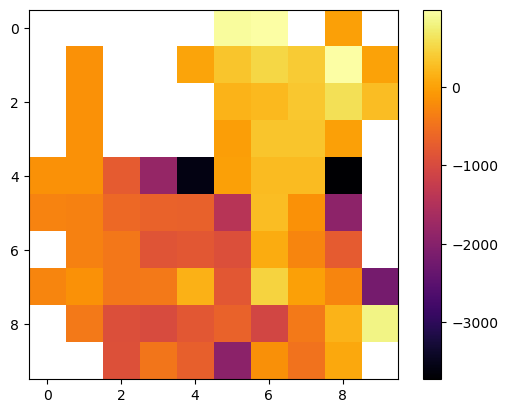

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 50 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

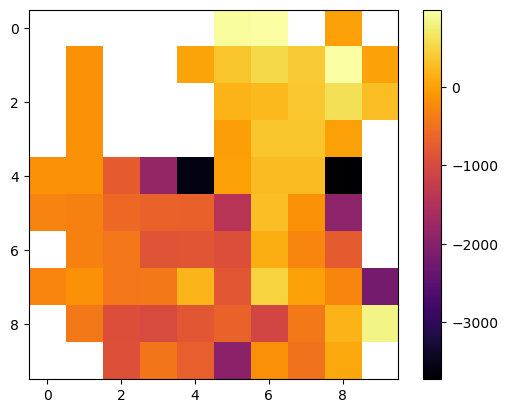

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 51 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

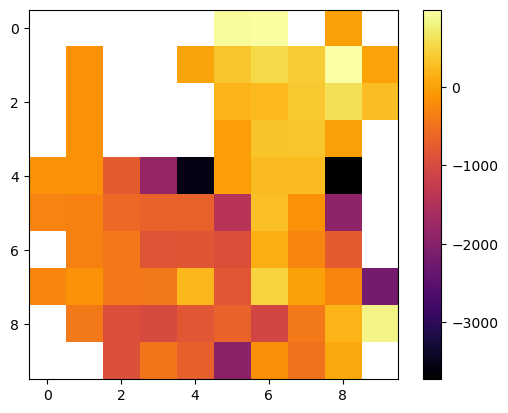

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 52 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

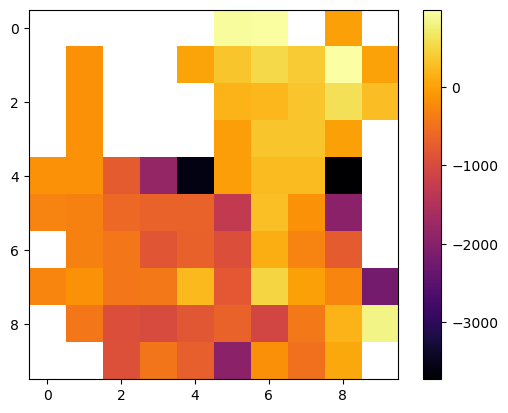

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 53 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

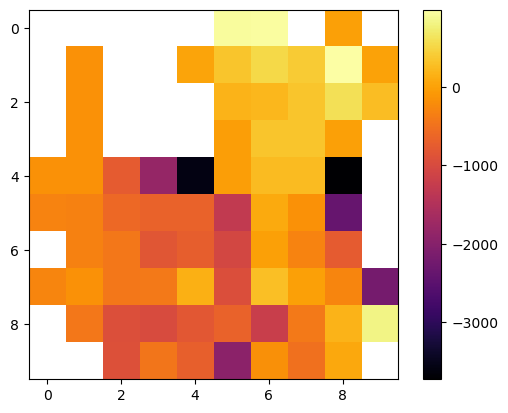

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 54 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

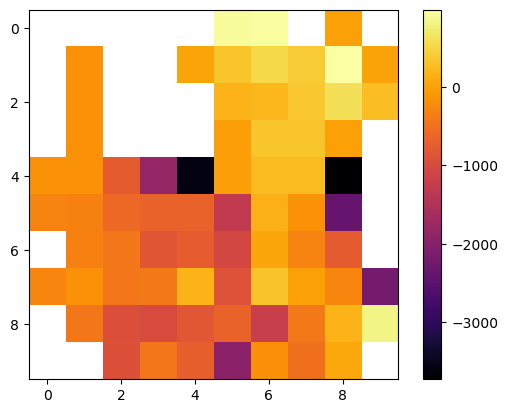

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 55 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

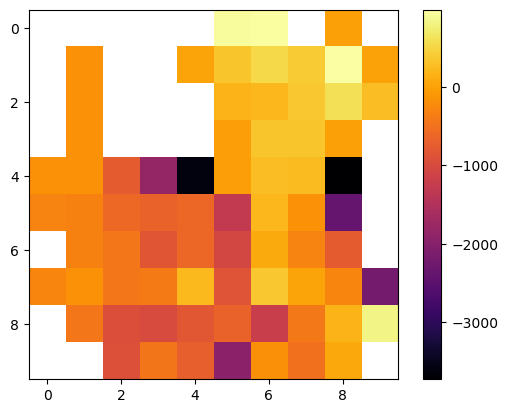

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 56 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

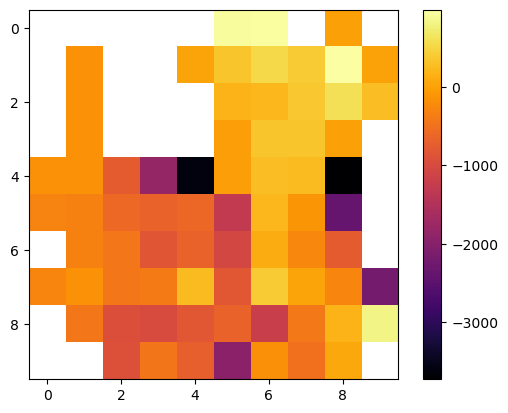

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 57 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 57 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

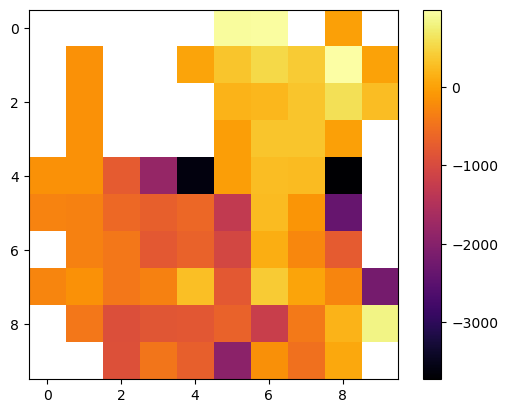

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 58 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

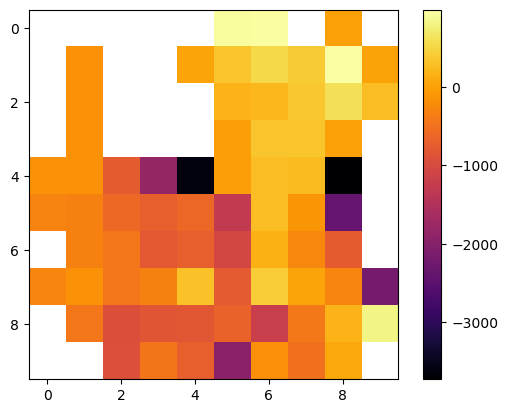

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 59 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

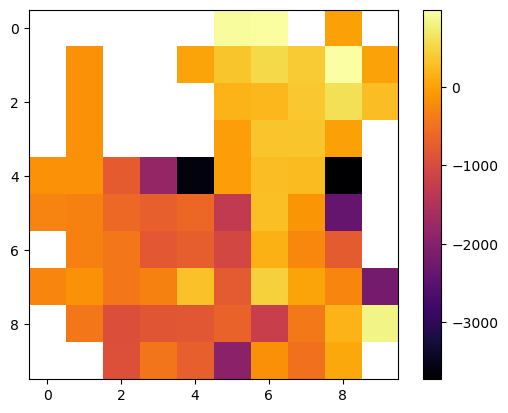

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 60 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

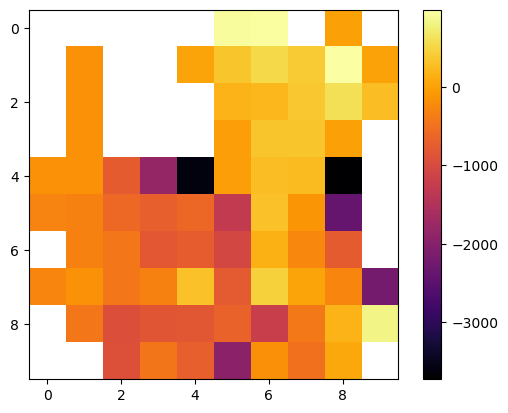

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 61 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

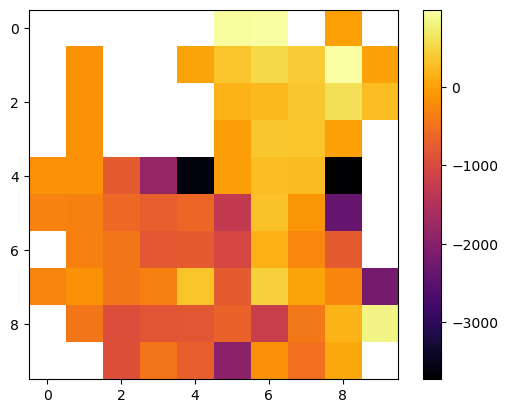

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 62 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

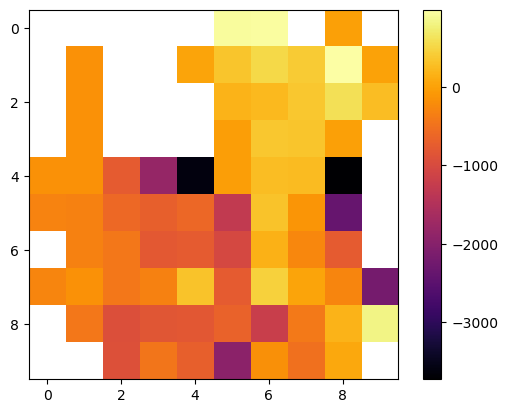

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 63 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

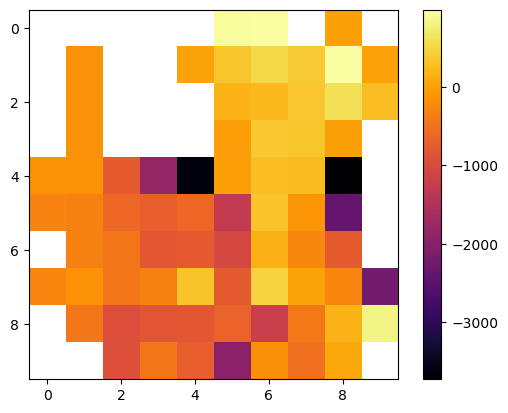

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 64 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

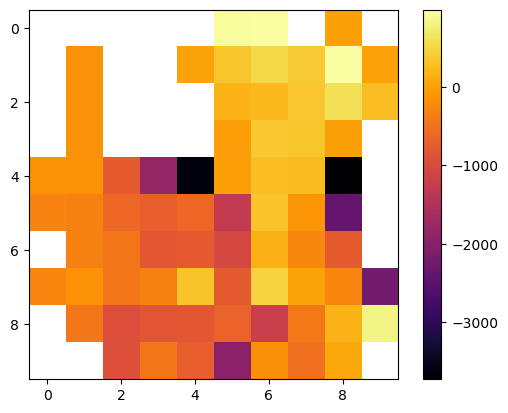

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 65 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

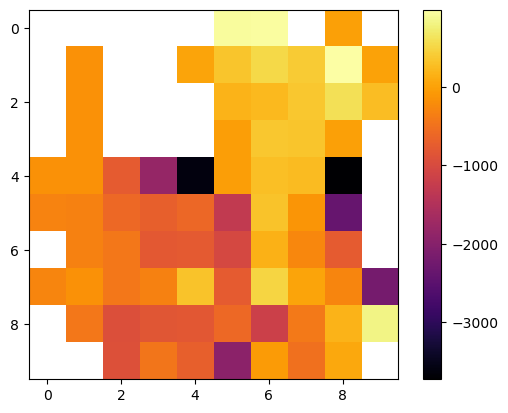

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 66 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

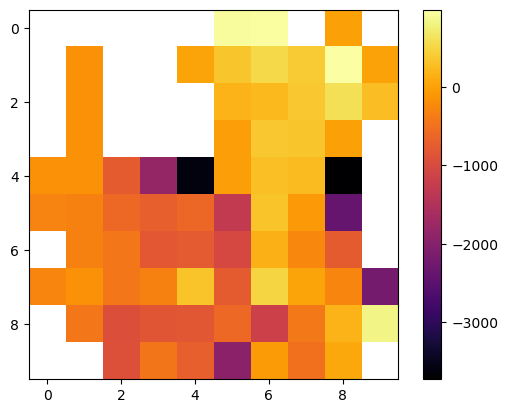

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 67 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

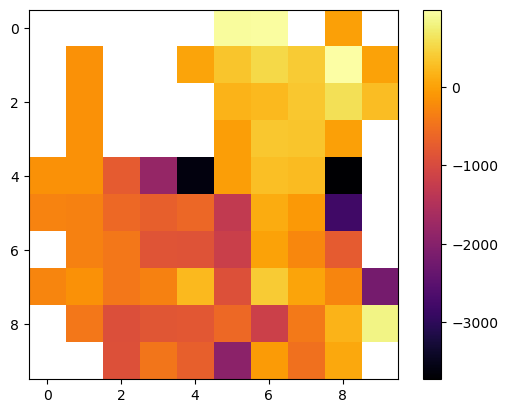

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 68 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 68 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

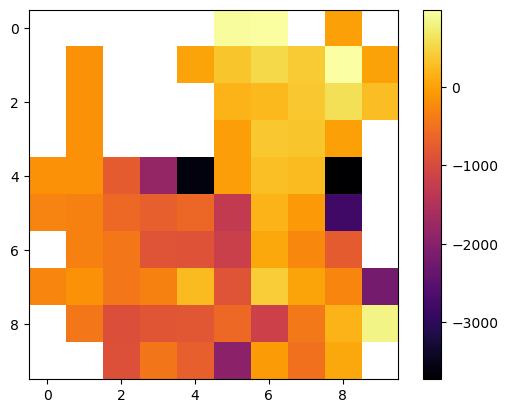

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 69 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

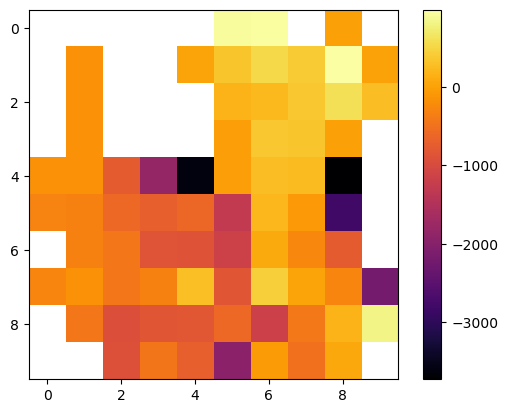

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 70 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

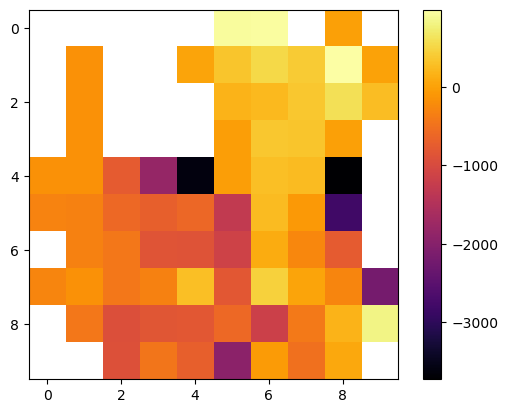

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 71 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 71 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

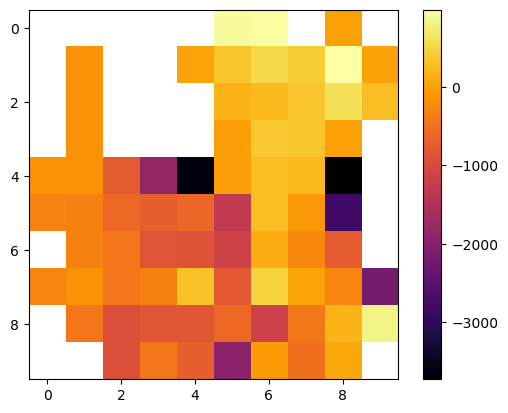

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 72 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

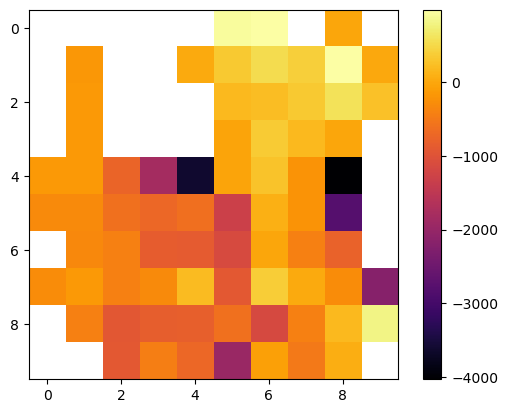

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 73 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

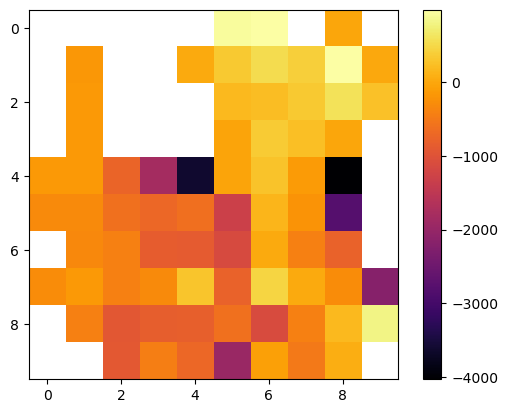

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 74 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

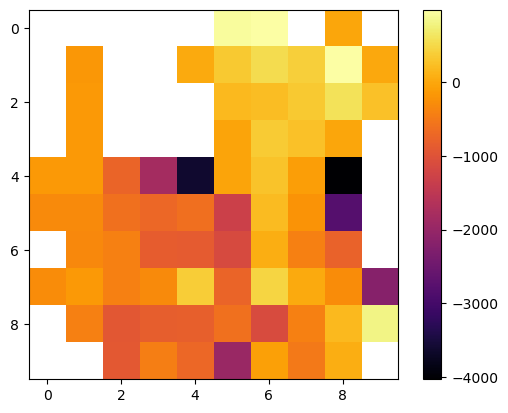

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 75 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

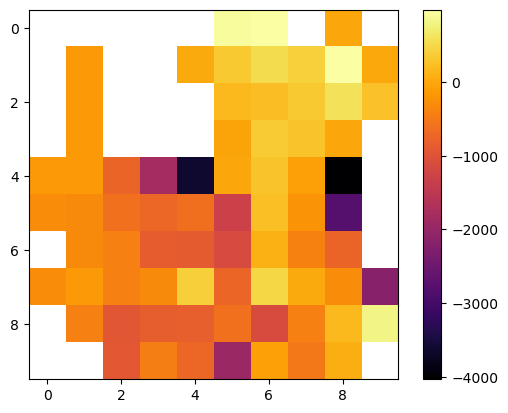

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 76 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

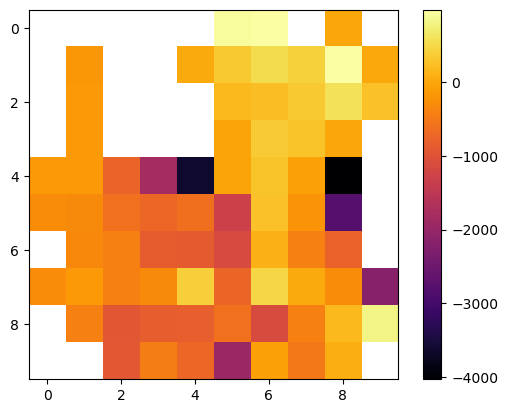

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 77 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

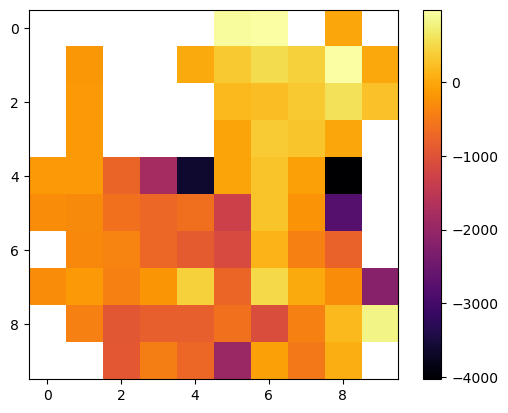

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 78 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 78 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

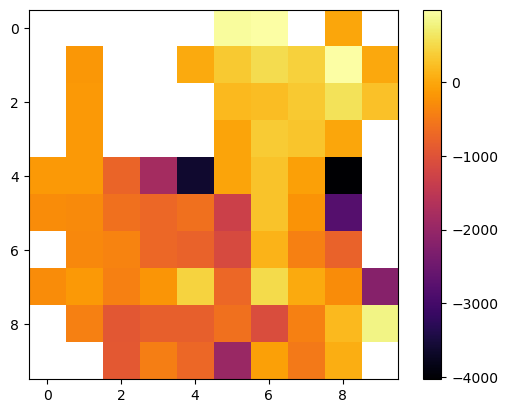

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 79 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 79 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

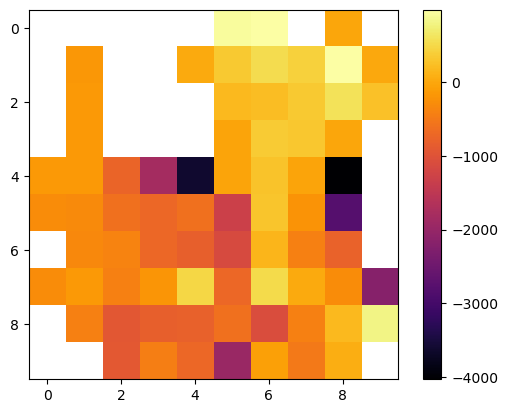

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 80 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

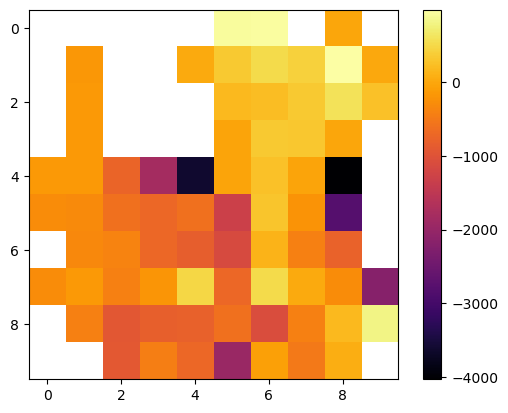

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 81 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

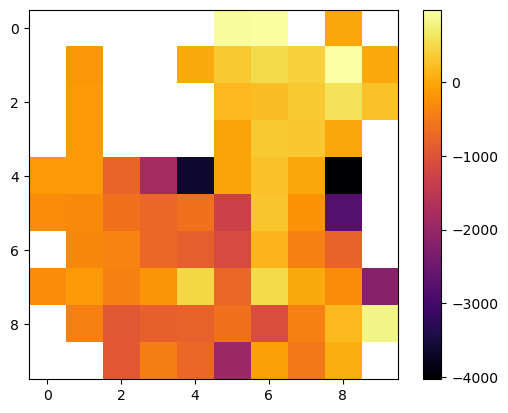

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 82 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 82 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 82 - STEP 24 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 82 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

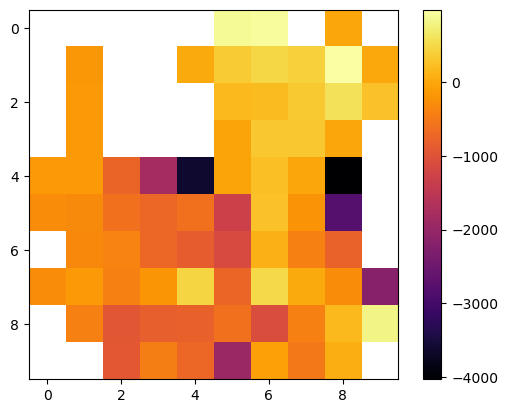

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 83 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

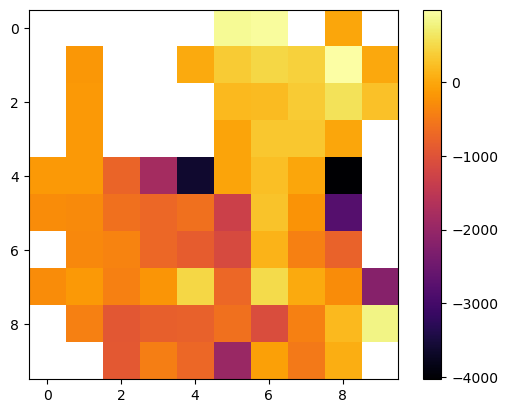

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 27 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 84 - STEP 28 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

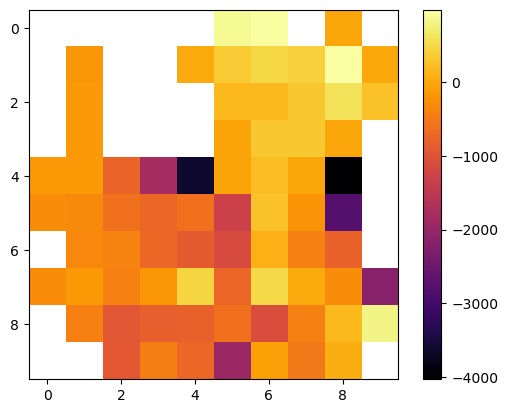

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 85 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 85 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

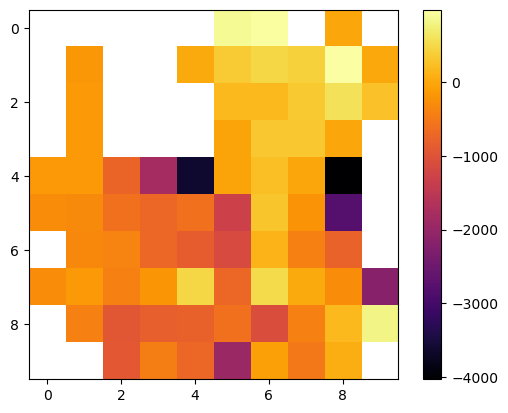

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 86 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

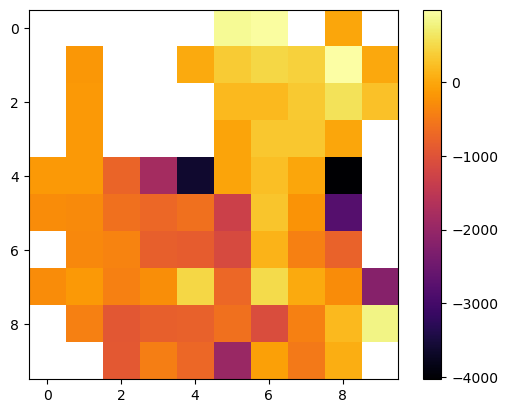

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 87 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 87 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

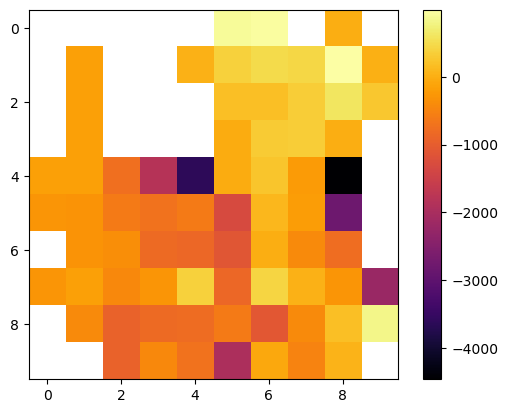

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 88 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 88 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

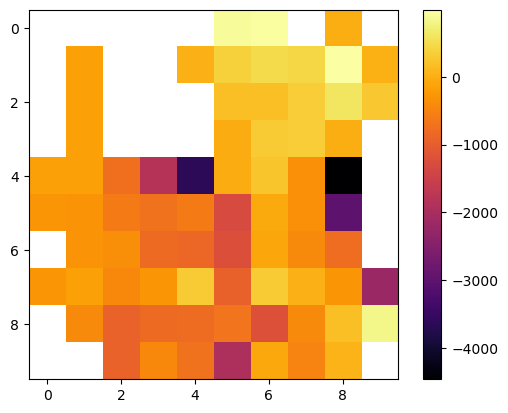

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 89 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 89 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 89 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 89 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

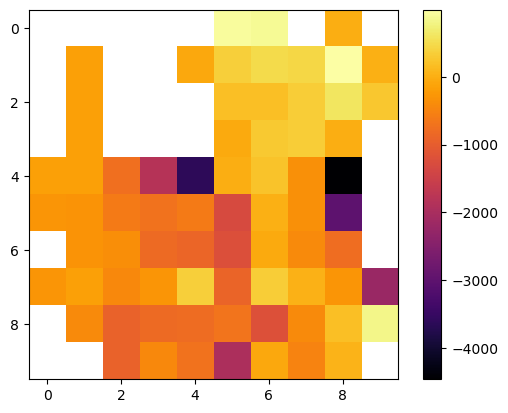

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 90 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 90 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

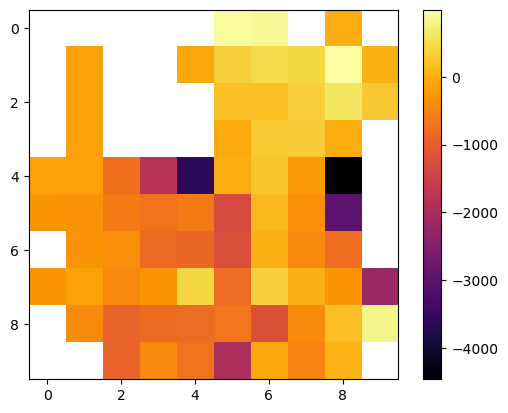

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 91 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

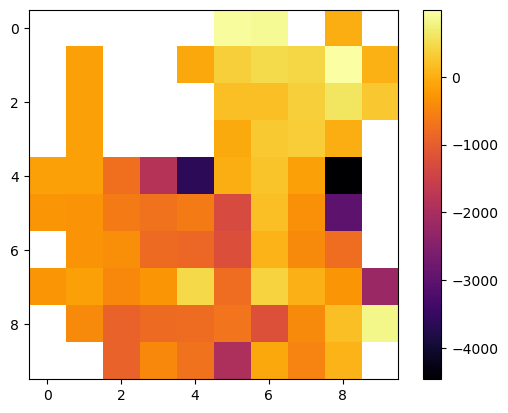

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 92 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 92 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 92 - STEP 24 end


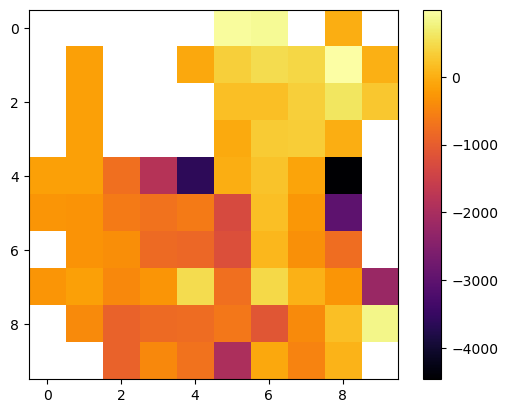

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 93 - STEP 27 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPIS

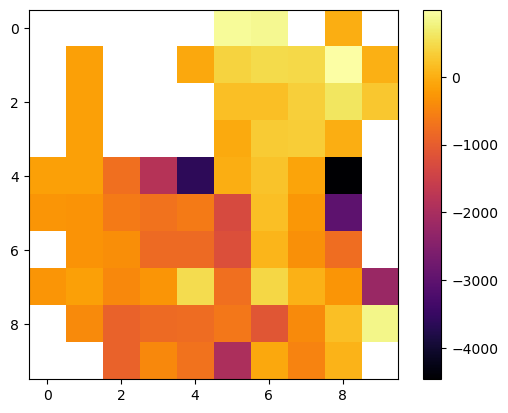

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 94 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 94 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

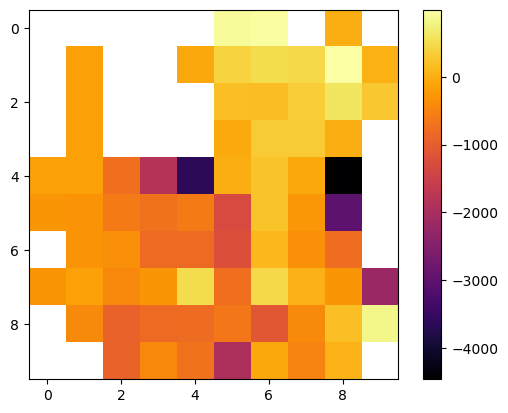

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 95 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 95 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

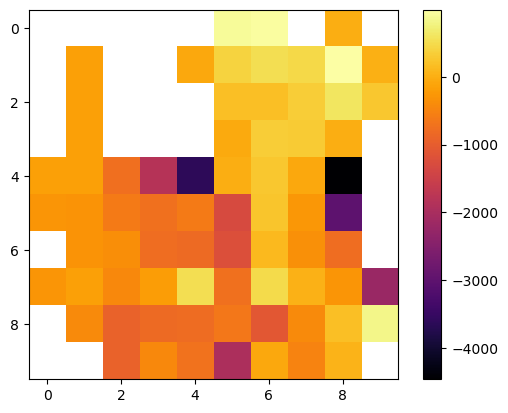

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 96 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 96 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

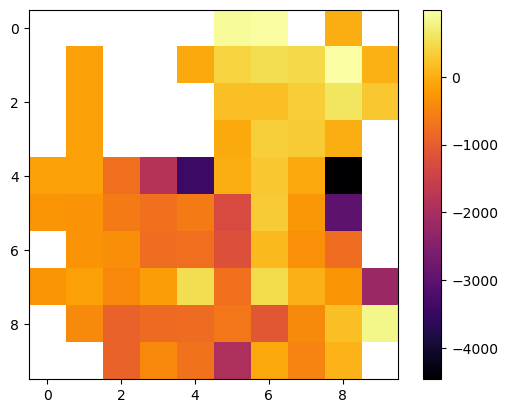

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 97 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 97 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

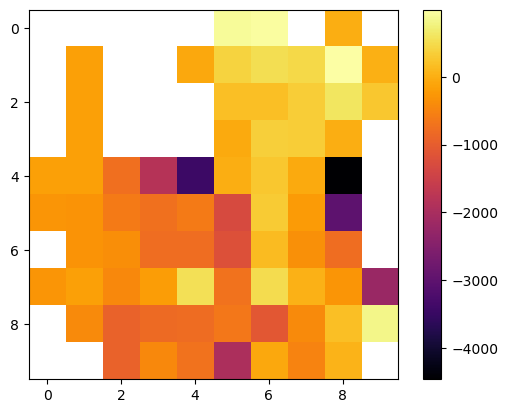

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 98 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

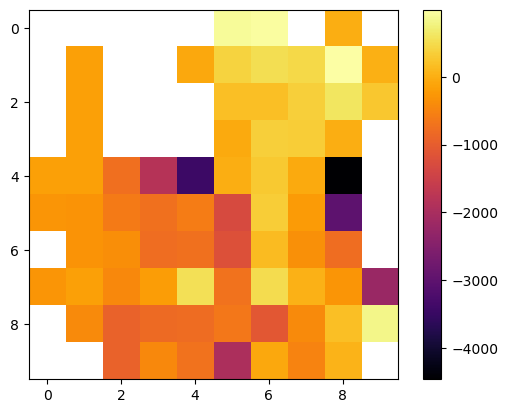

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 99 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 99 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE

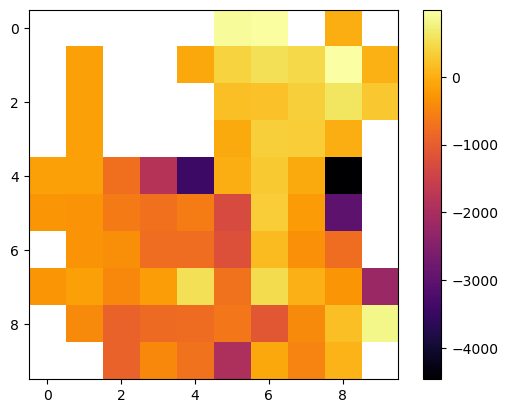

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 100 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 100 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

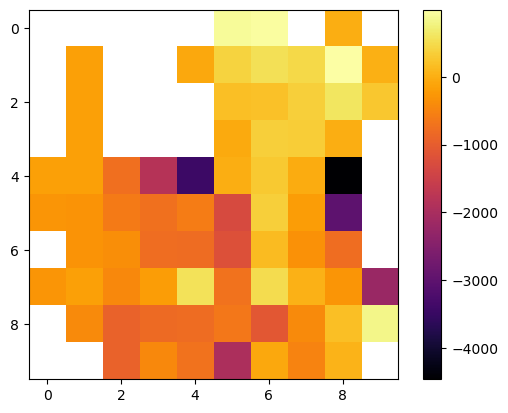

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 101 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 101 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

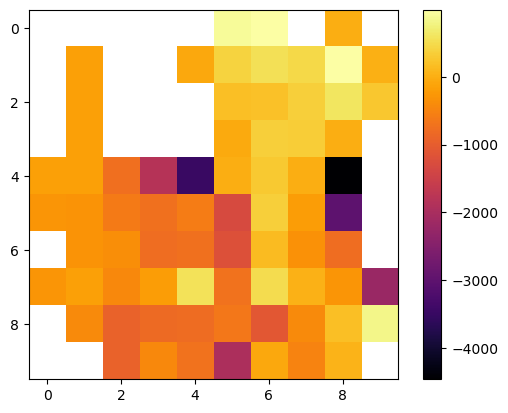

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 102 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 102 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

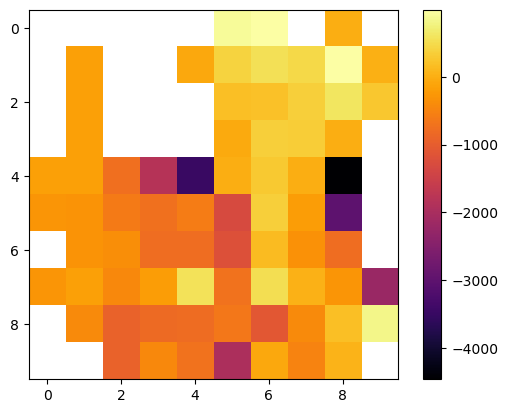

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 103 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 103 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

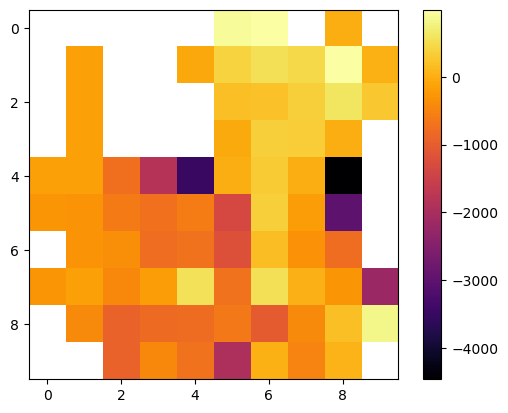

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 104 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 104 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 104 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 104 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

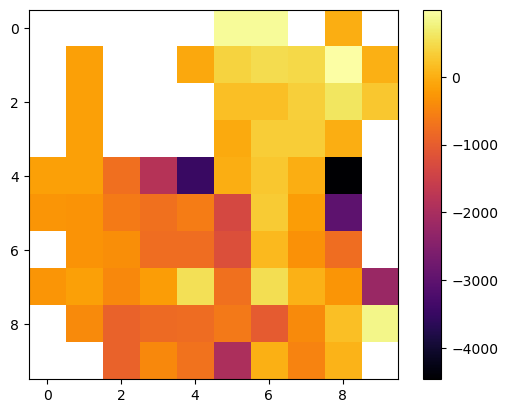

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 105 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 105 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

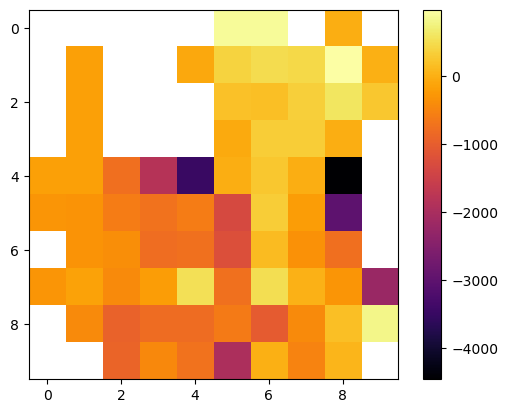

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 106 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 106 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

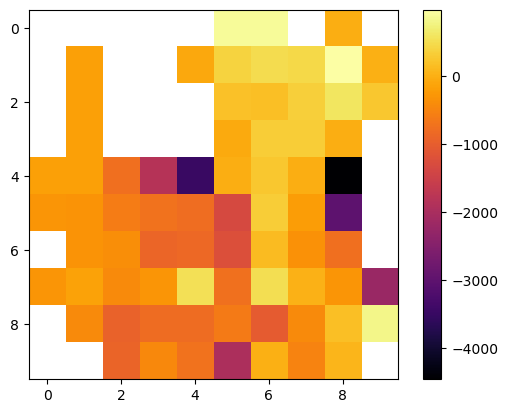

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 107 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 107 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

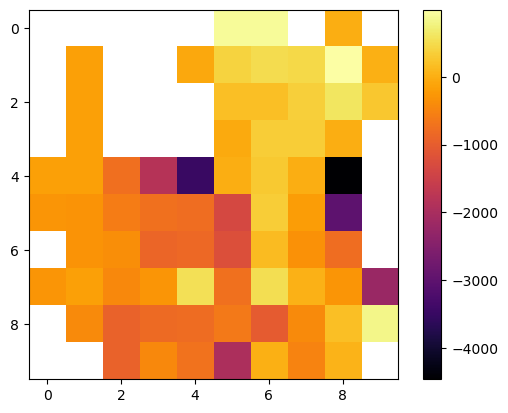

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 108 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 108 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

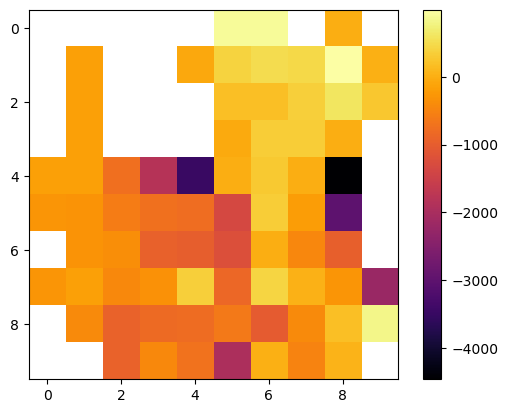

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 109 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 109 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

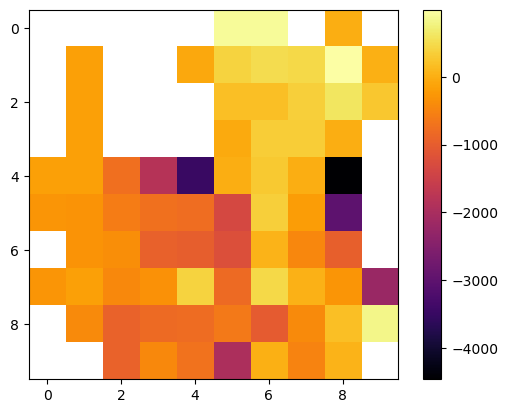

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 110 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 110 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

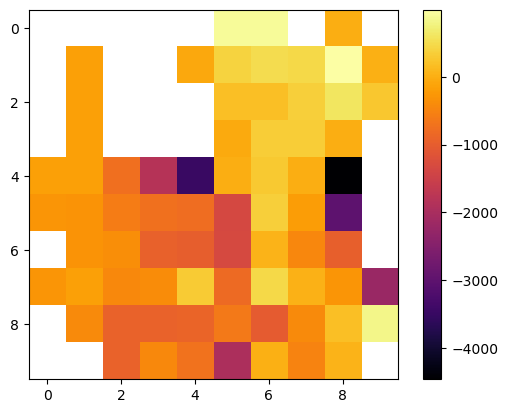

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 111 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 111 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

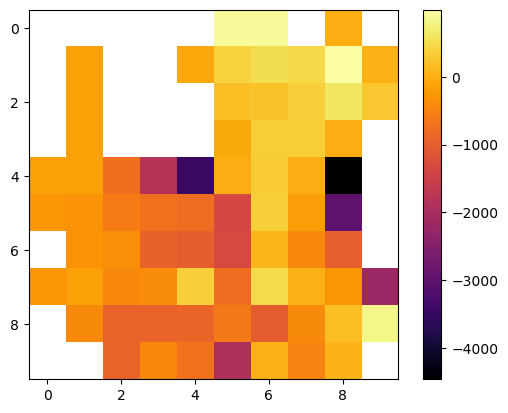

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 112 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 112 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

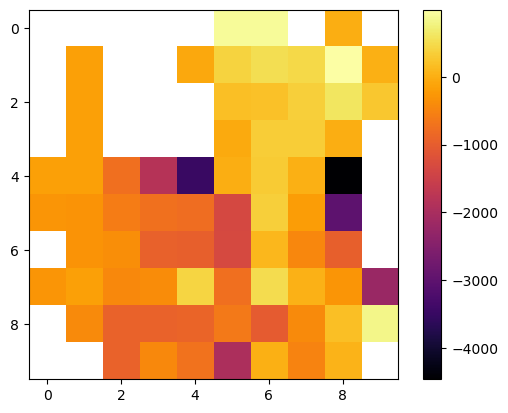

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 113 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 113 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

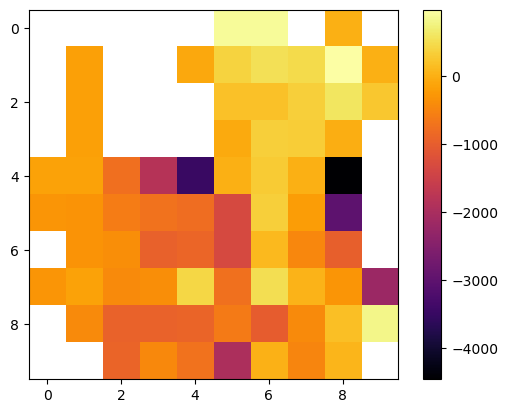

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 114 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 114 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 114 - STEP 24 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ×  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 114 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

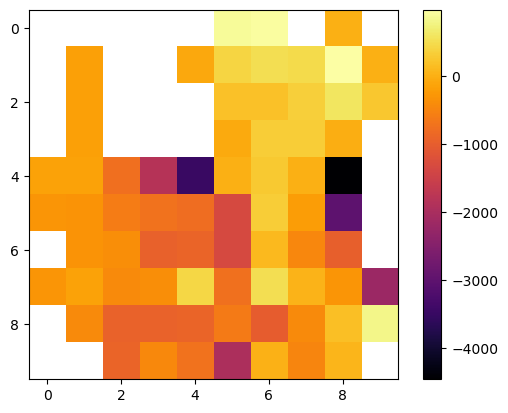

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 115 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 115 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

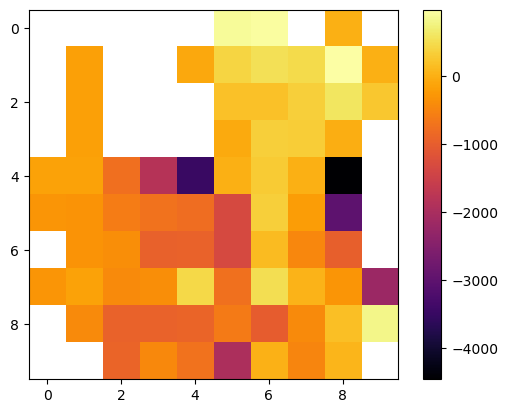

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 116 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 116 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

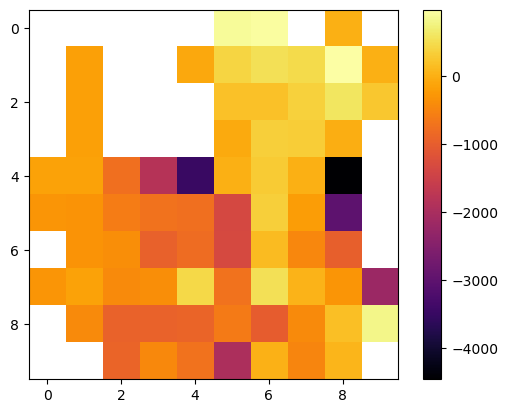

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 117 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 117 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

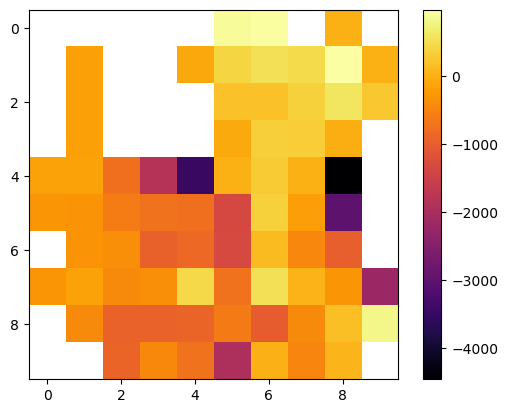

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 118 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 118 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ×  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 118 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 118 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

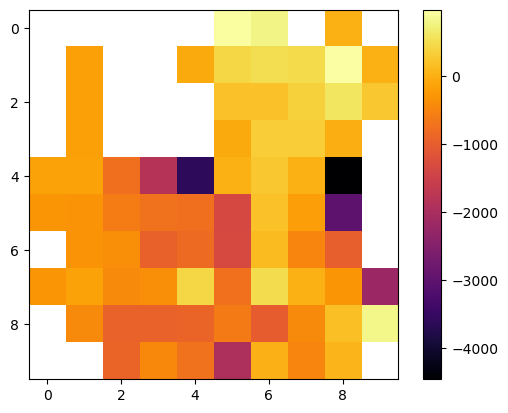

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 119 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 119 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 119 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 119 - STEP 27 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

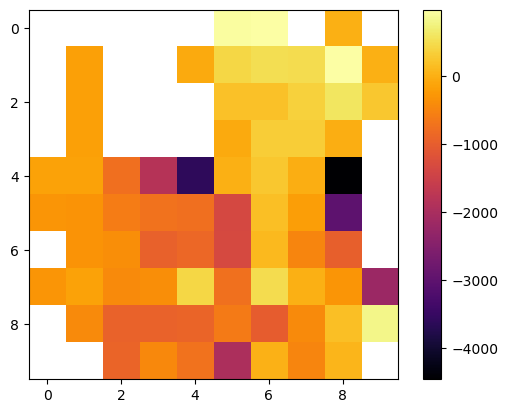

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 120 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 120 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

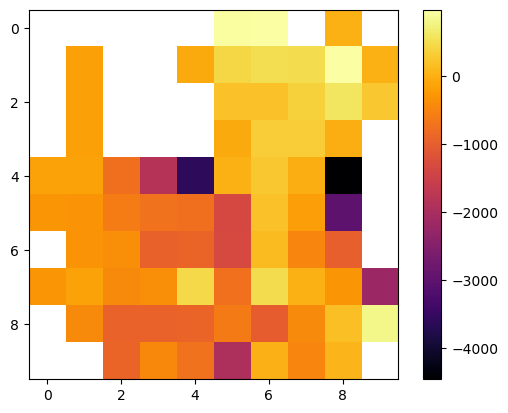

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 121 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 121 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

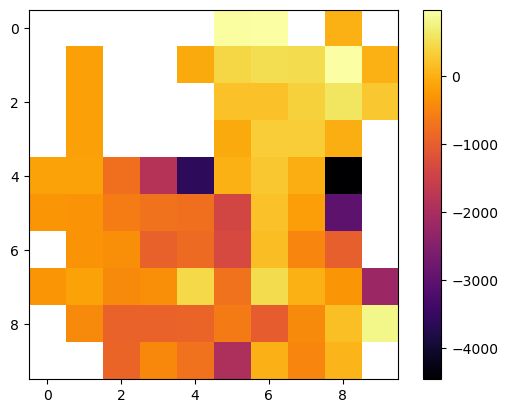

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 122 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 122 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 122 - STEP 24 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 122 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ×  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 122 - STEP 48 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 122 - STEP 49 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

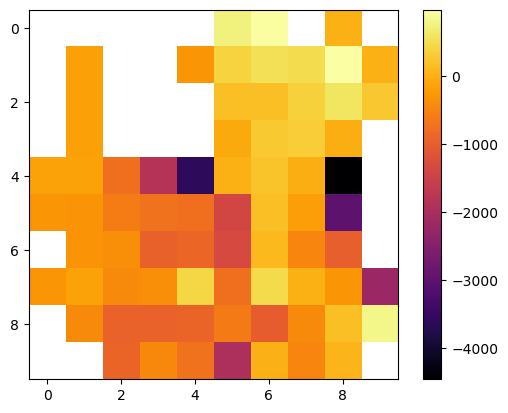

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 123 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 123 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

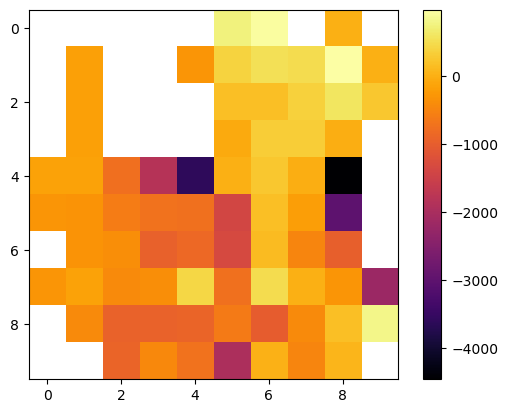

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 124 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 124 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

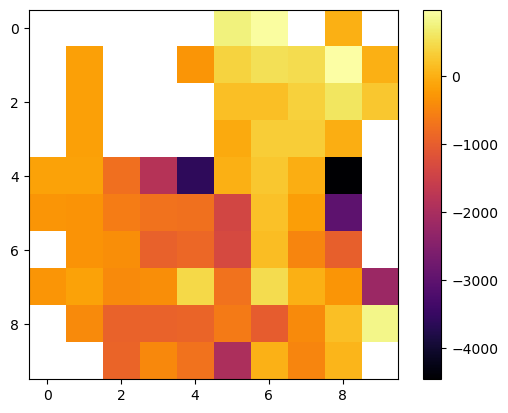

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 125 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 125 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

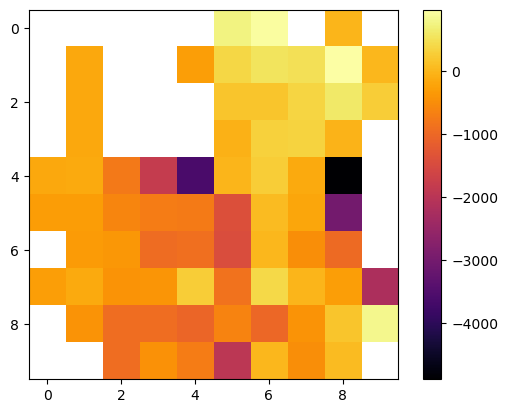

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 126 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 126 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

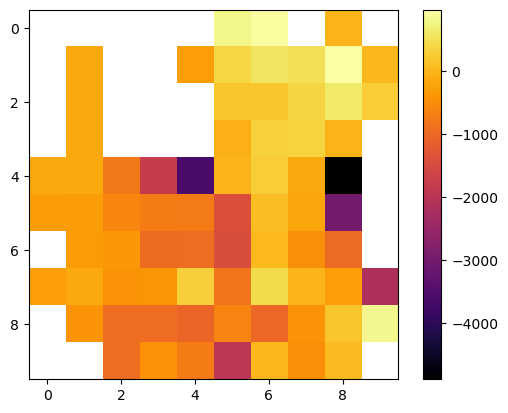

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 127 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 127 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

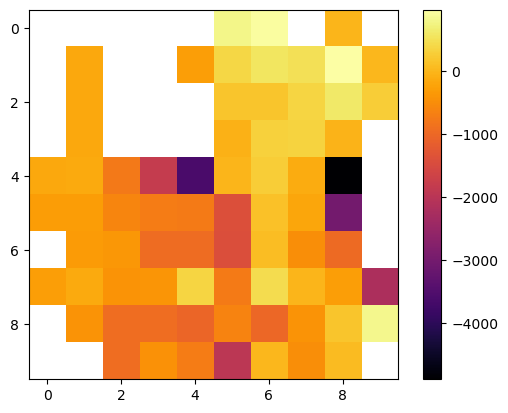

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 128 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 128 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 128 - STEP 24 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 128 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 128 - STEP 48 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 128 - STEP 49 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │  ×  ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

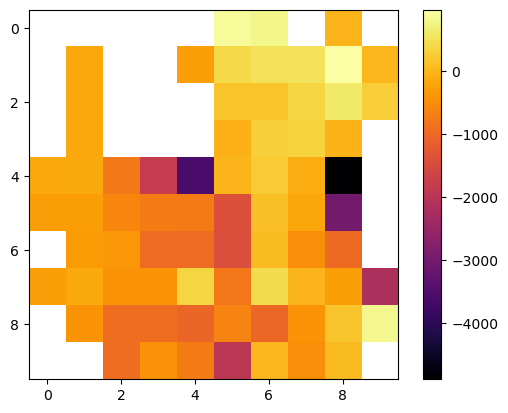

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 129 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 129 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

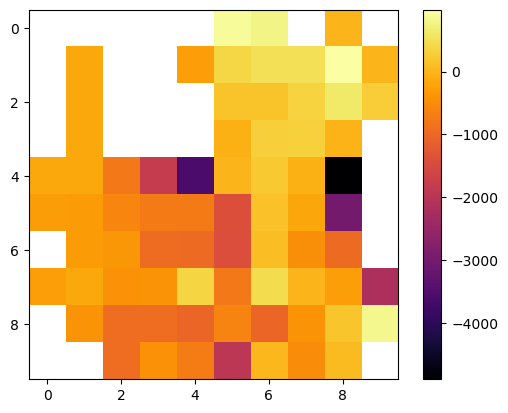

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 130 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 130 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

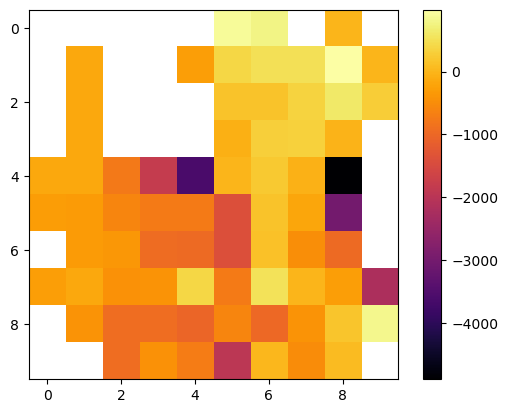

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 131 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 131 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ×  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 131 - STEP 26 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 131 - STEP 27 end


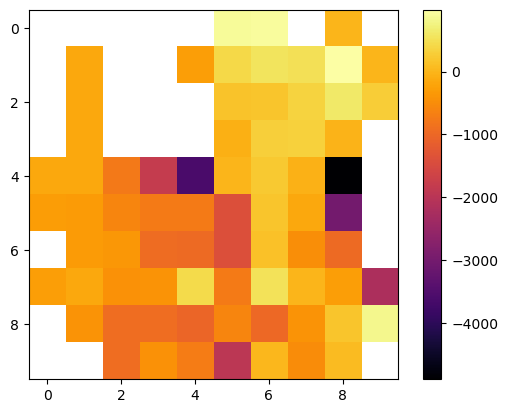

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 132 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 132 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

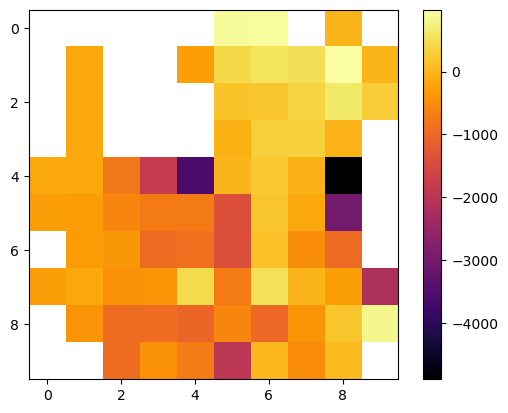

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 133 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 133 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

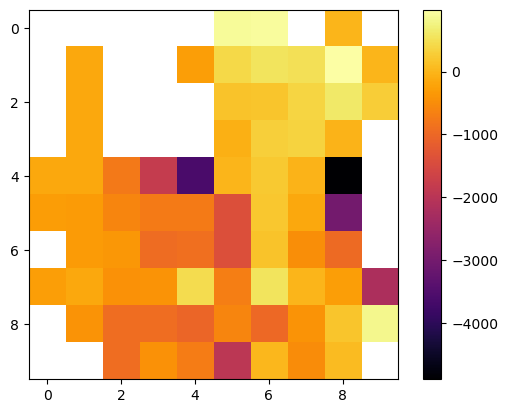

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 134 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 134 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

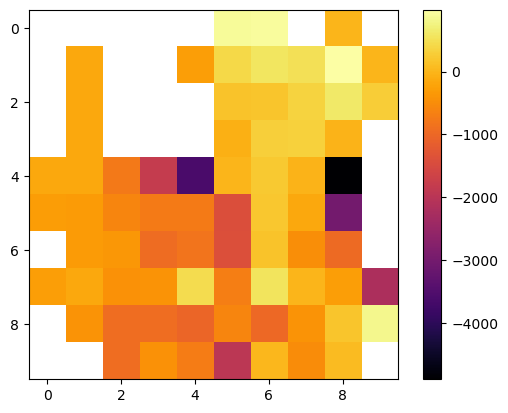

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 135 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 135 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

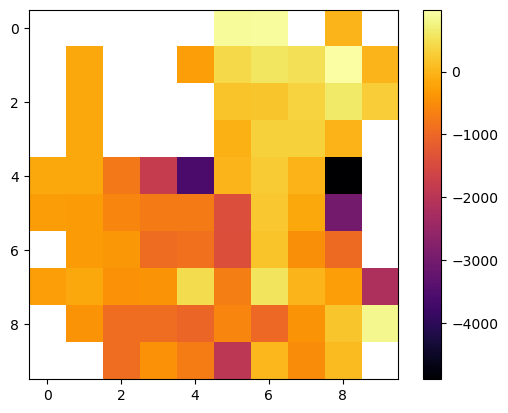

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 136 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 136 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

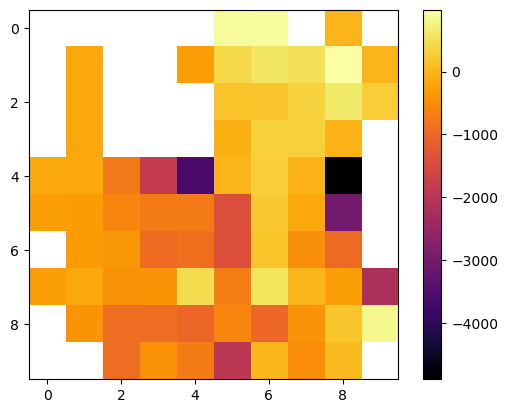

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 137 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 137 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

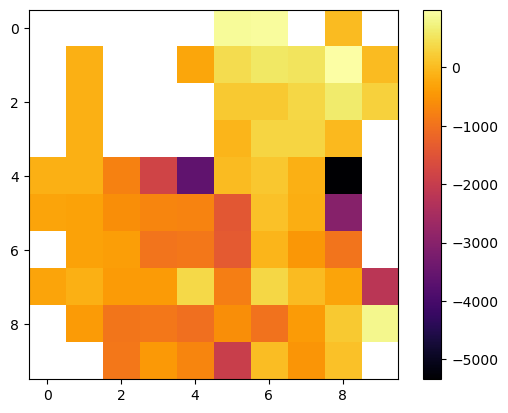

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 138 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 138 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

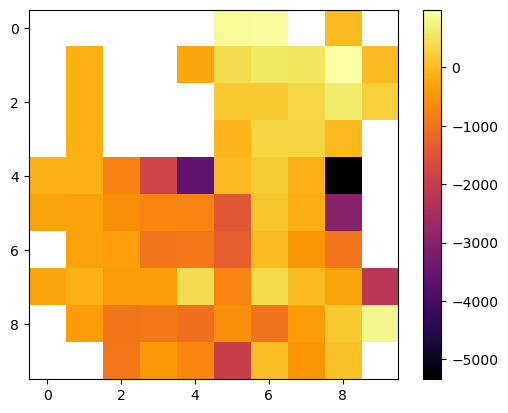

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 139 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 139 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

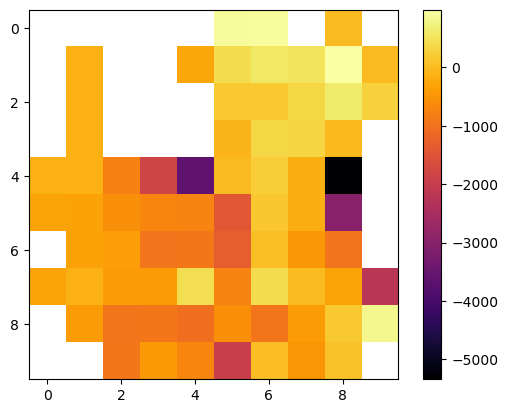

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 140 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 140 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

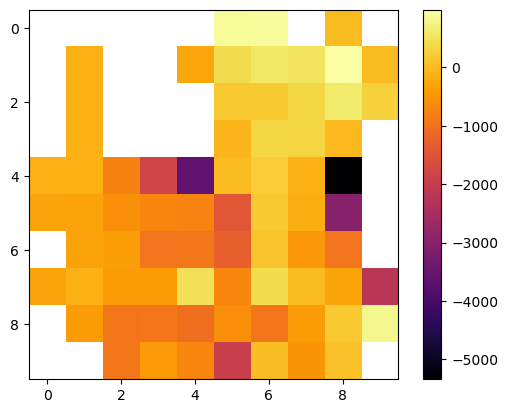

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 141 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 141 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

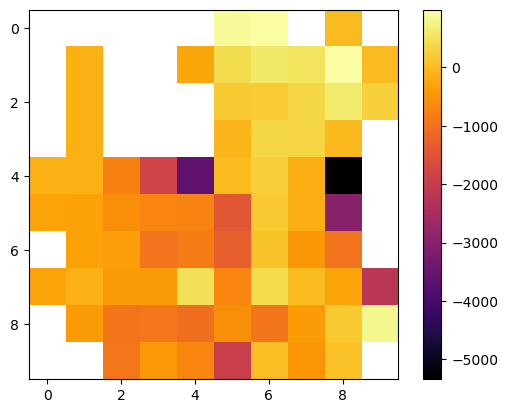

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 24 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │  ×  ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 49 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 50 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 75 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 142 - STEP 76 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

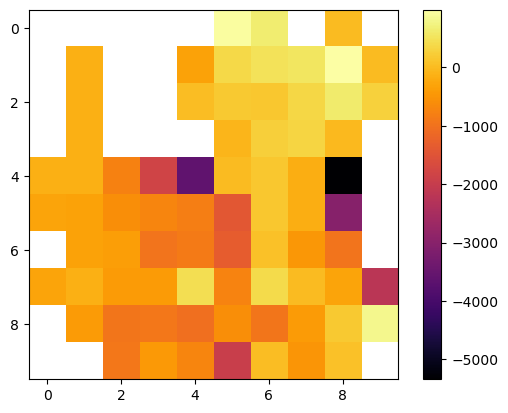

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 143 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 143 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

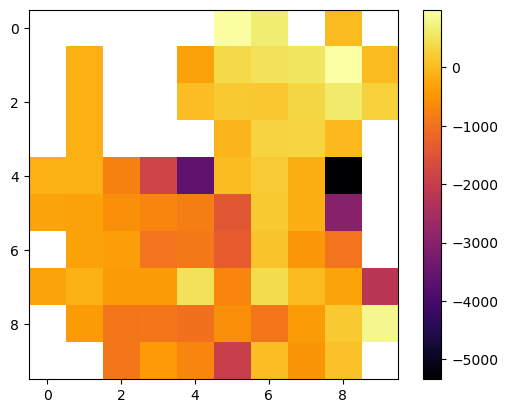

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 144 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 144 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

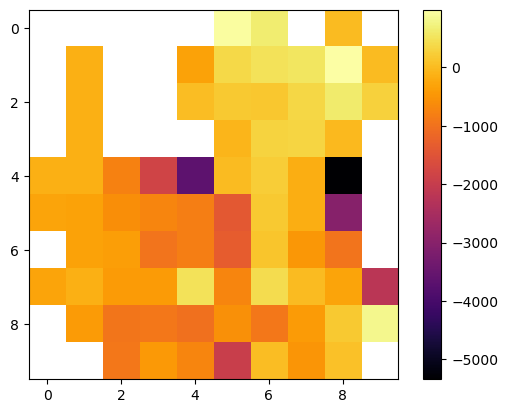

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 145 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 145 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

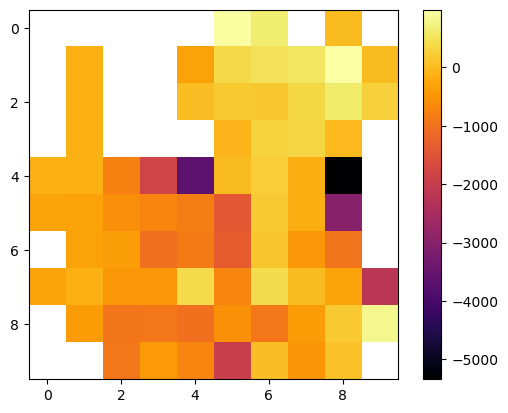

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 146 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 146 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

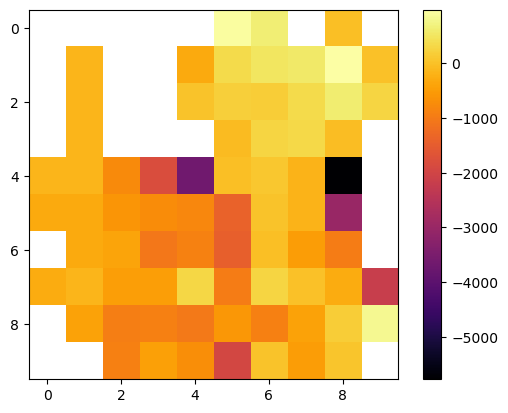

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 147 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 147 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

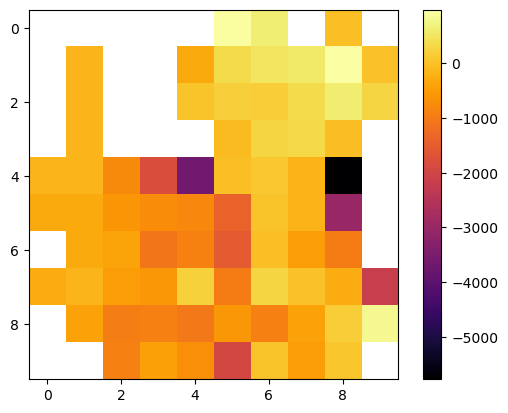

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 148 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 148 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

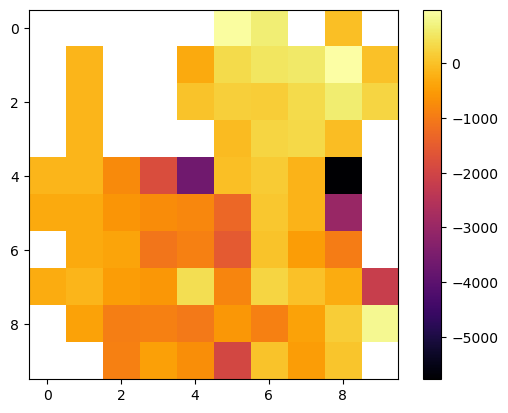

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 149 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 149 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

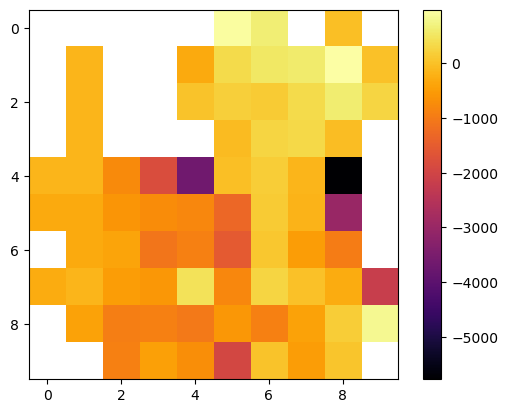

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 49 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 50 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖              ×  │ 
 └──────────────────────────┘ 
EP

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 73 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 150 - STEP 74 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

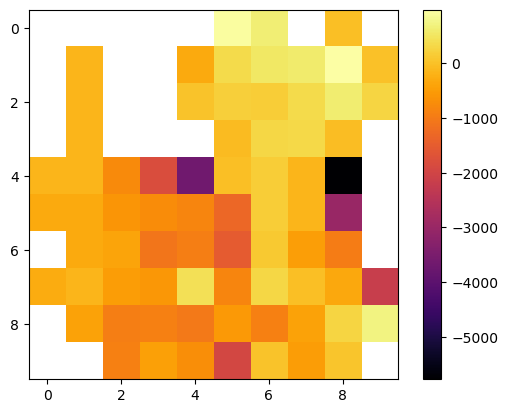

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 151 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 151 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →  ×  ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 151 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │        ×     │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 151 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ×  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

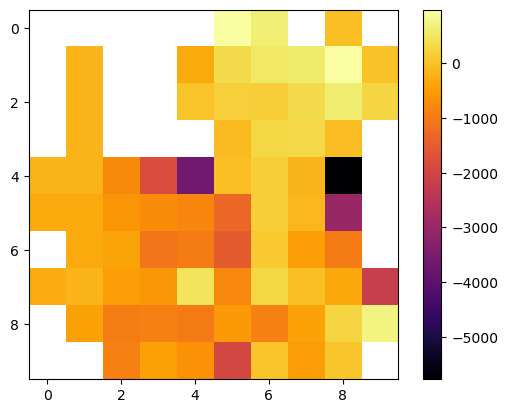

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 152 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 152 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 152 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←        ×        │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 152 - STEP 26 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←           ×     │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

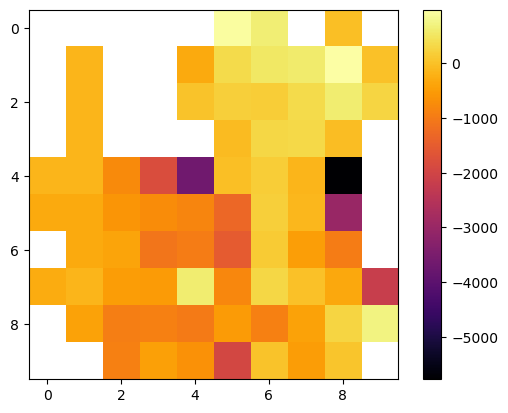

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 153 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 153 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

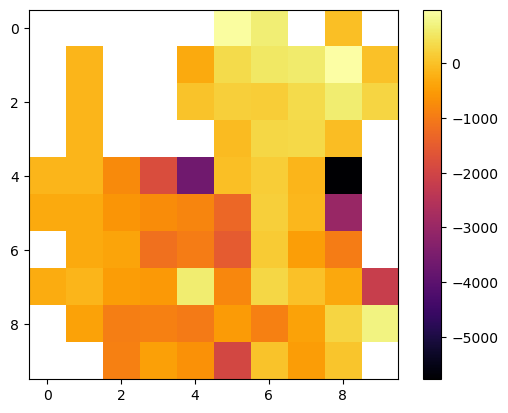

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 154 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 154 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ×  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 154 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 154 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

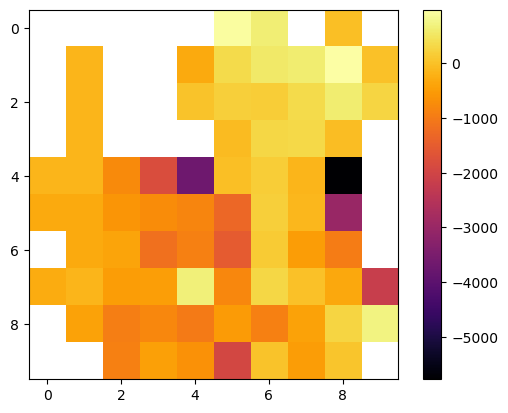

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 155 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 155 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

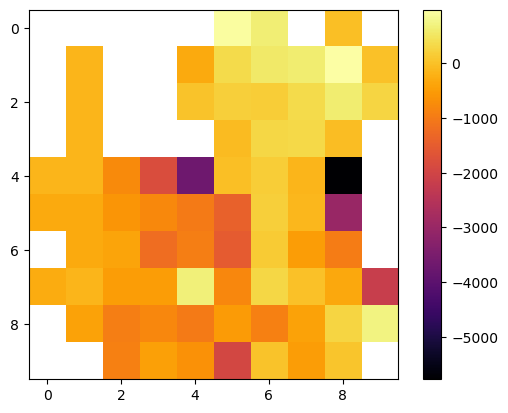

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 156 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 156 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

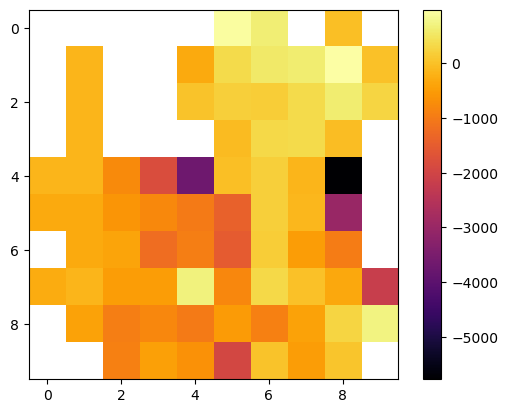

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 157 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 157 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

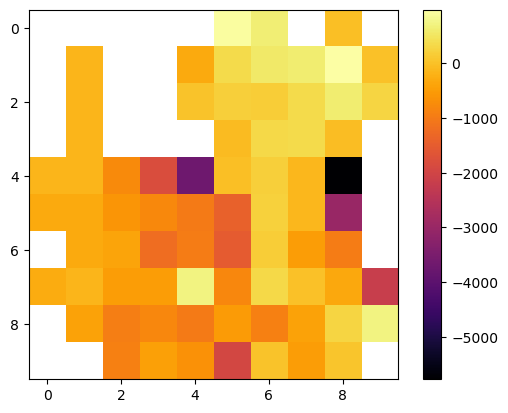

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 158 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 158 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →  ×  ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 158 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │        ×     │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 158 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ×  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

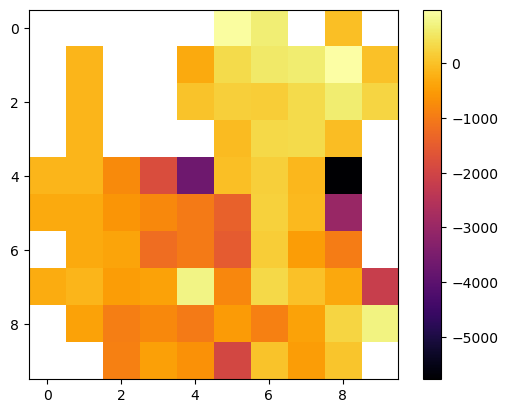

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 159 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 159 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖  ×              │ 
 └──────────────────────────┘ 
EPISODE 159 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 159 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←     ×           │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

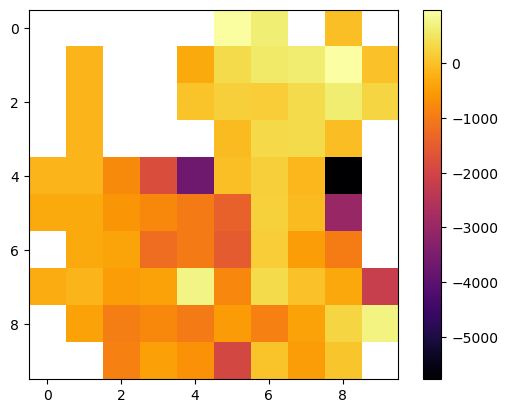

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 160 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 160 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

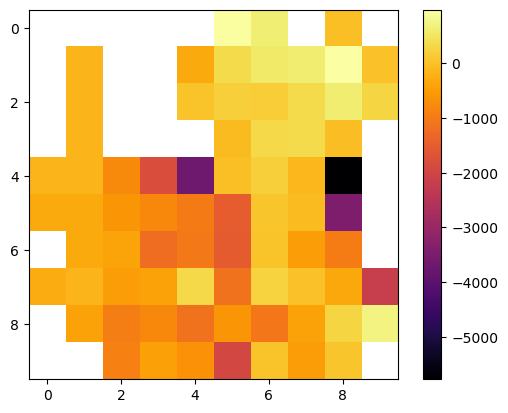

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 161 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 161 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

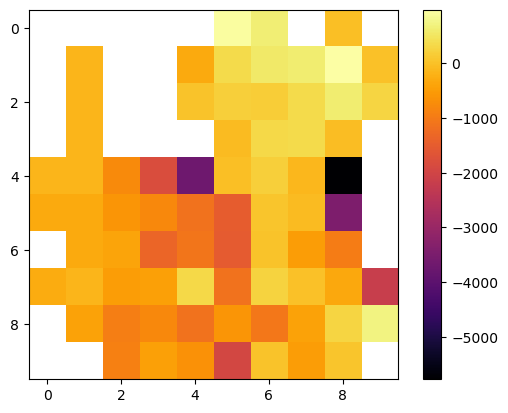

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 162 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 162 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

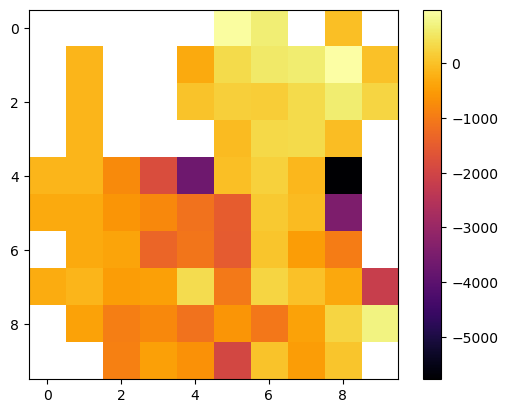

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 163 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 163 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

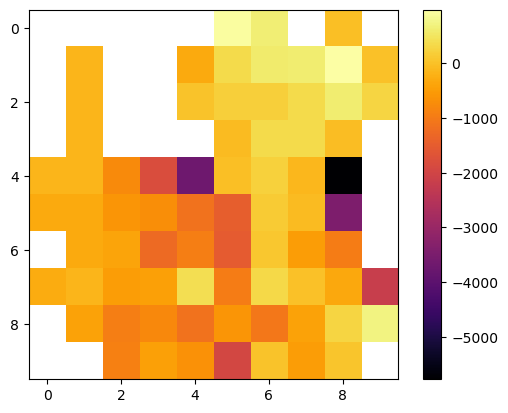

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 164 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 164 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

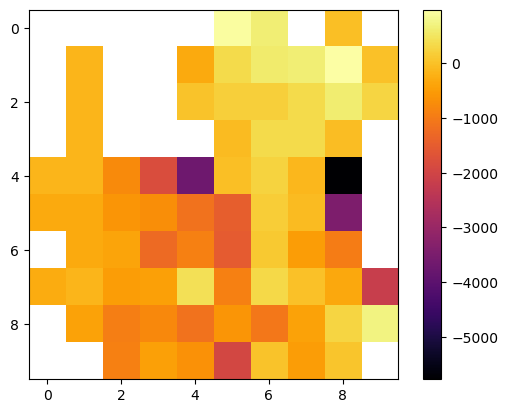

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 165 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 165 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

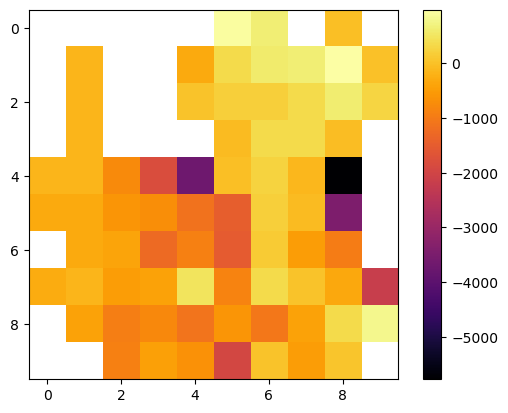

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 166 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 166 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

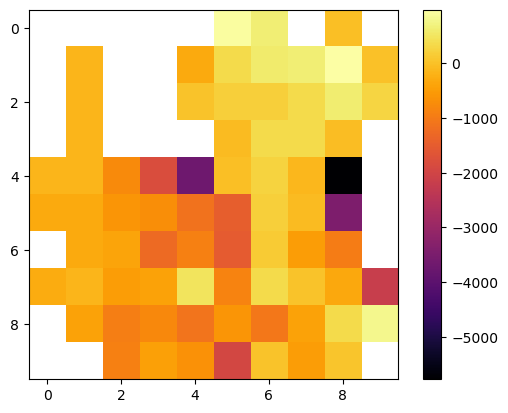

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 167 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 167 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

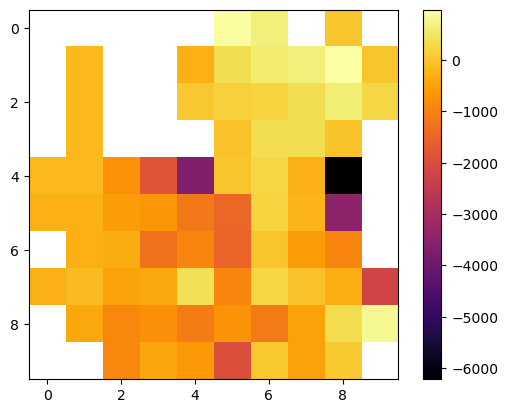

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 168 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 168 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

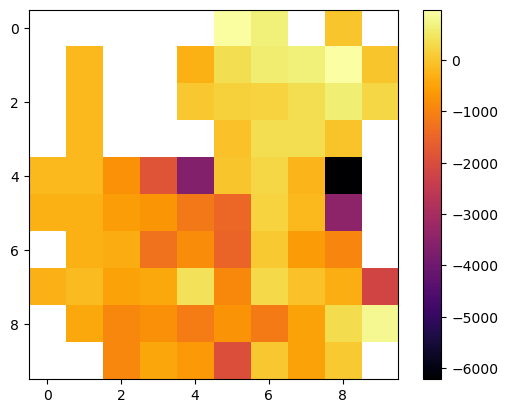

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 169 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 169 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

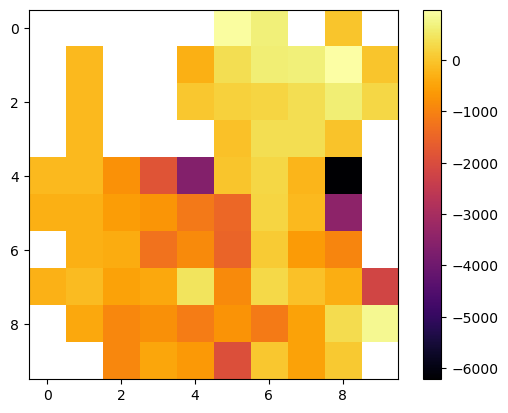

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 170 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 170 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

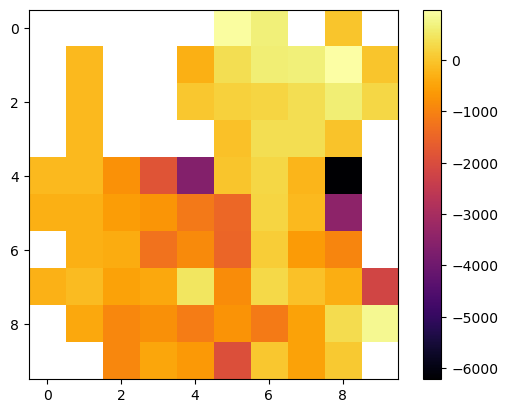

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 171 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 171 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

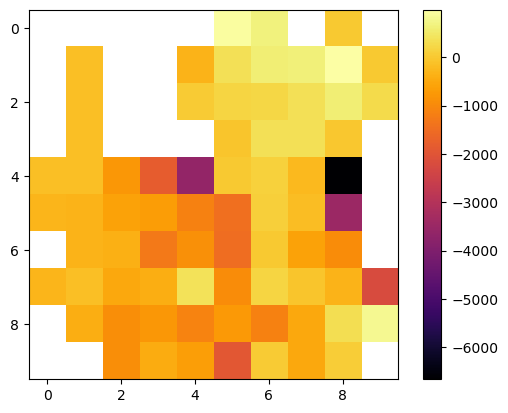

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 172 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 172 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

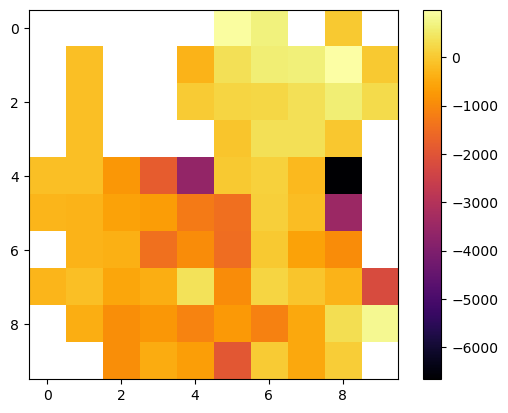

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 173 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 173 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

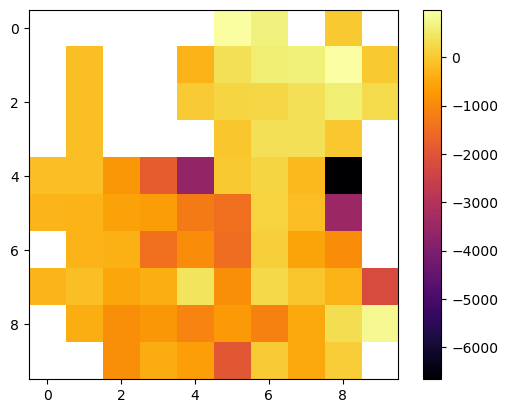

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 174 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 174 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

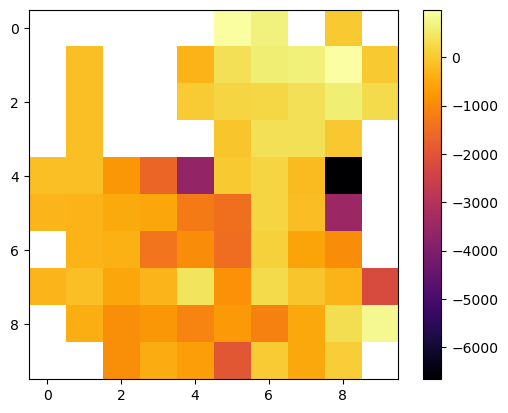

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 175 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 175 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

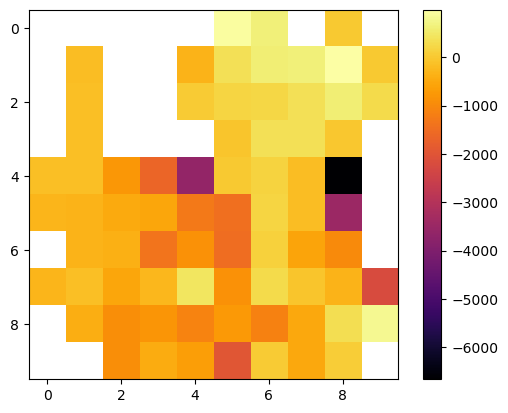

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 176 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 176 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

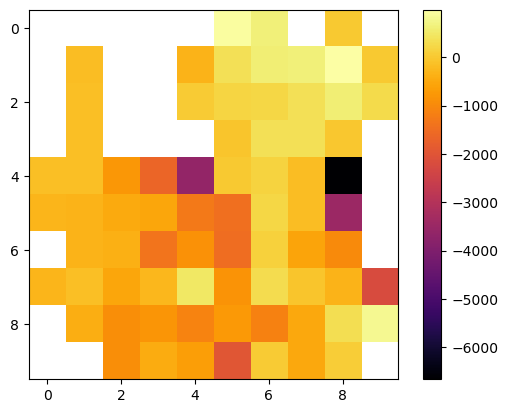

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 177 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 177 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

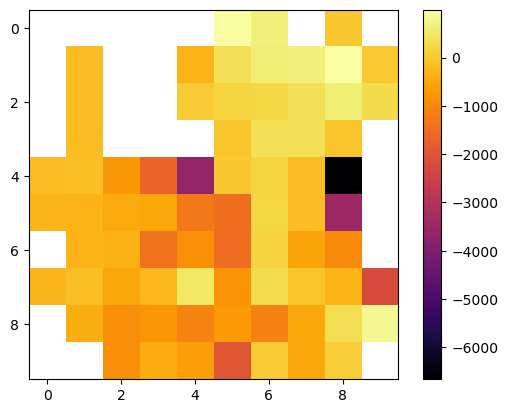

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 178 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 178 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

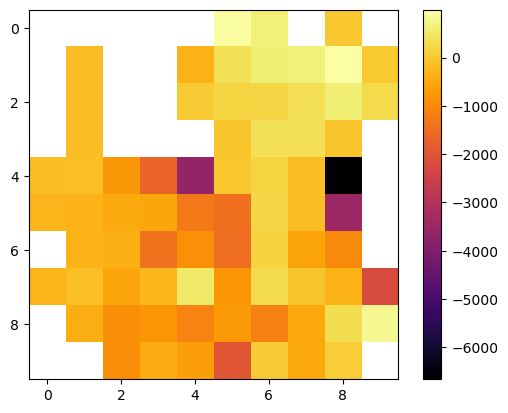

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 179 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 179 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

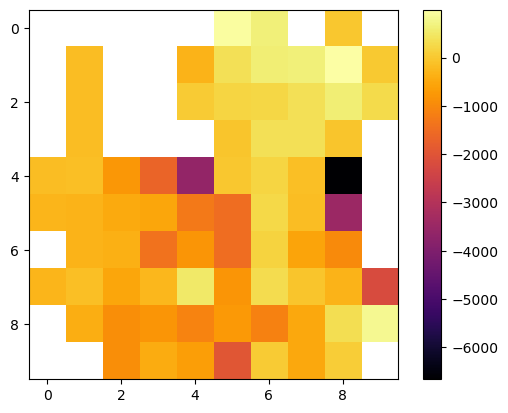

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 180 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 180 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

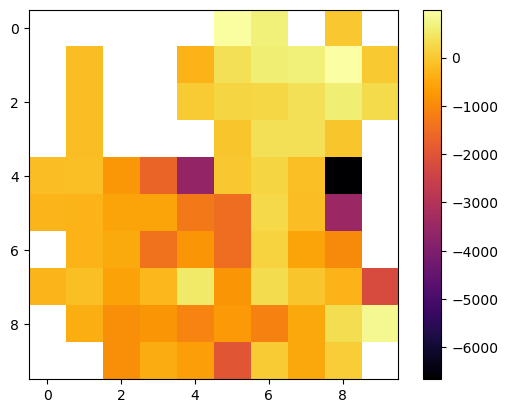

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 181 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 181 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

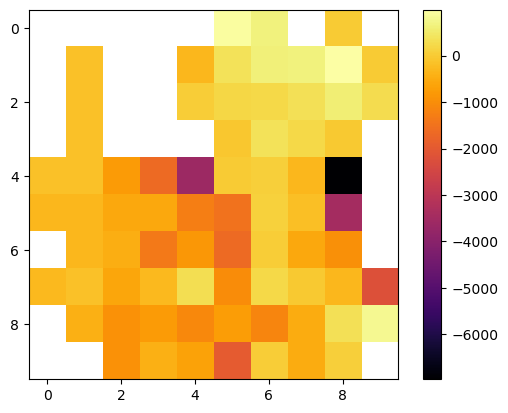

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 182 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 182 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

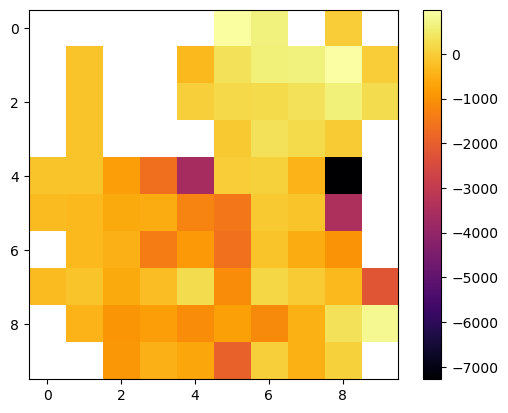

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 183 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 183 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

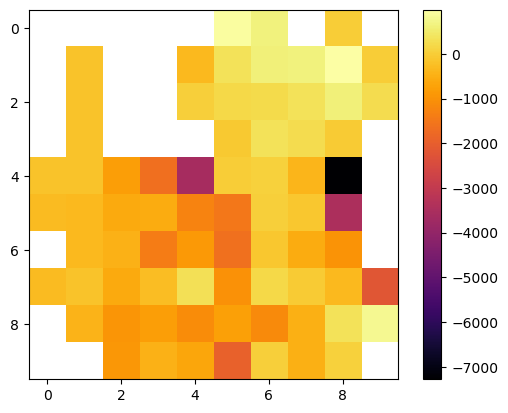

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 184 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 184 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

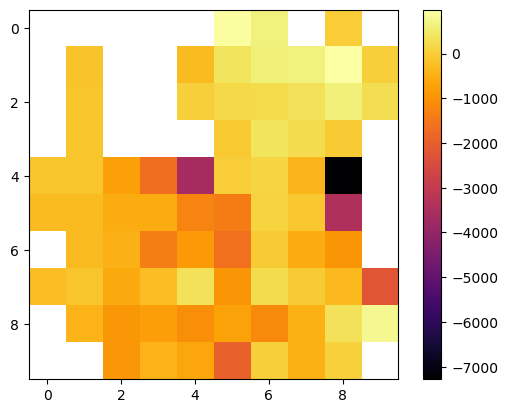

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 185 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 185 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

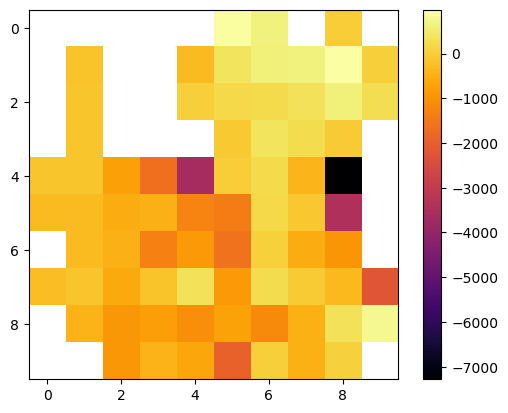

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 186 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 186 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

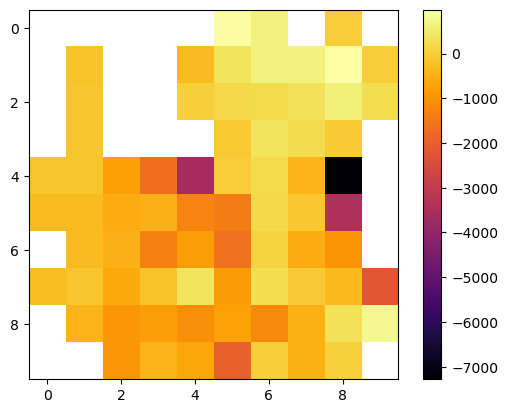

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 187 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 187 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 187 - STEP 24 end


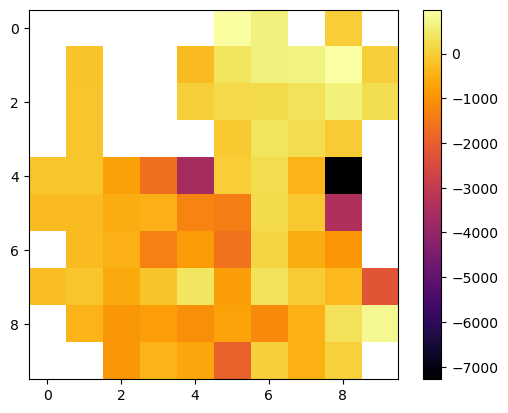

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 188 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 188 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

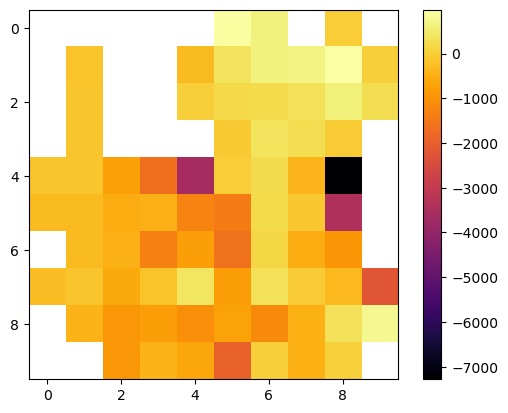

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 189 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 189 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

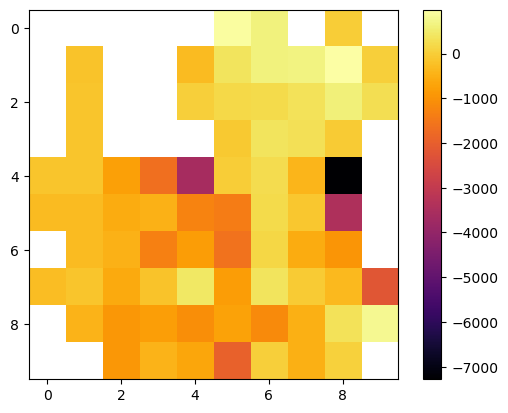

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 190 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 190 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

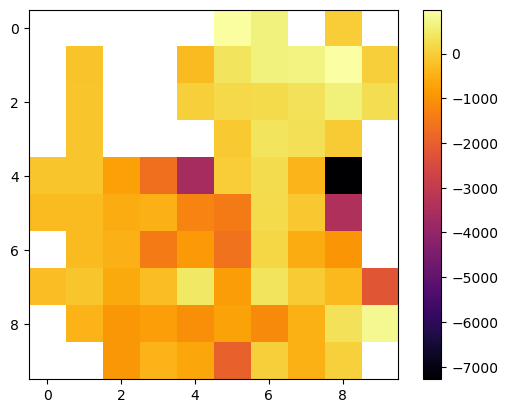

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 191 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 191 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

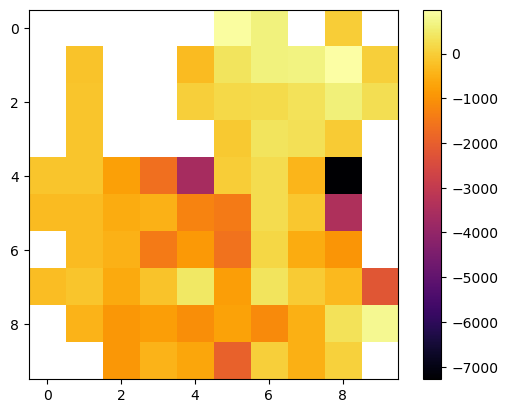

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 192 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 192 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

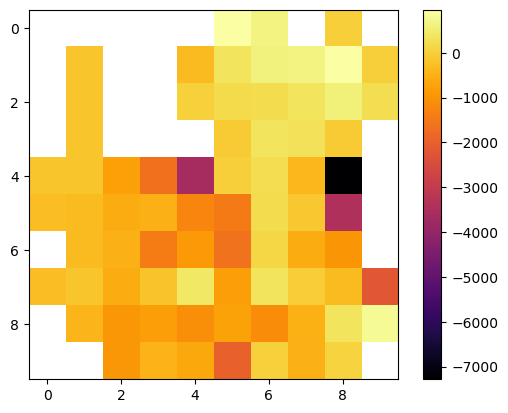

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 193 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 193 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

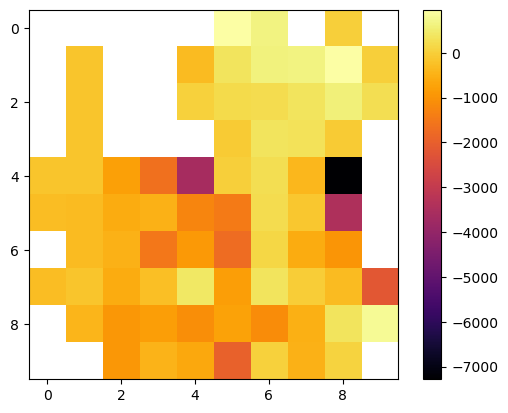

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 194 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 194 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

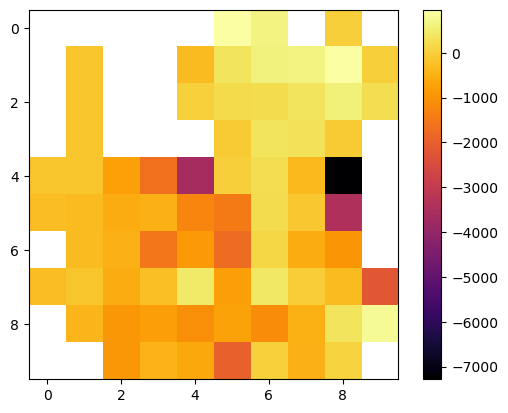

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 195 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 195 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

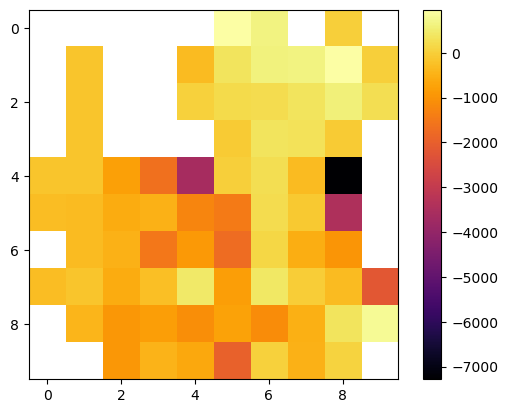

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 196 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 196 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

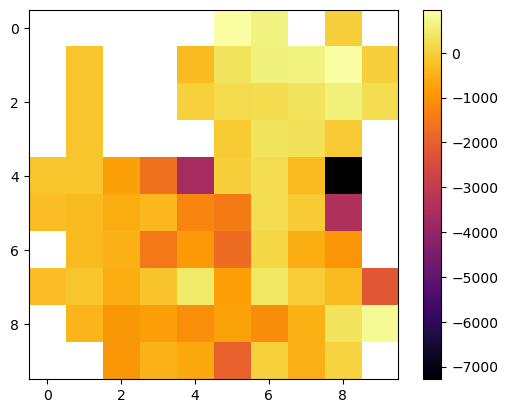

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 197 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 197 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

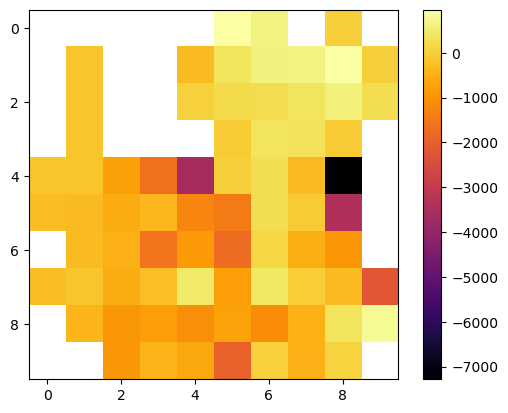

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 198 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 198 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

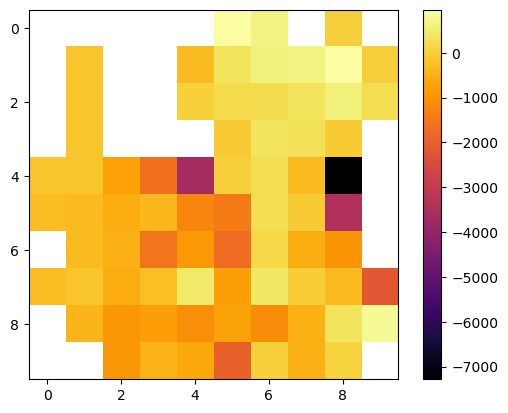

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 199 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 199 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

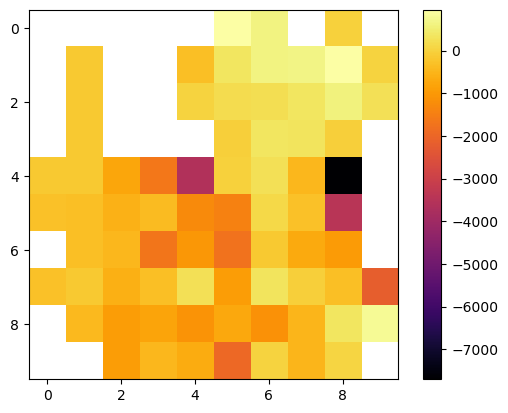

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 200 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 200 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

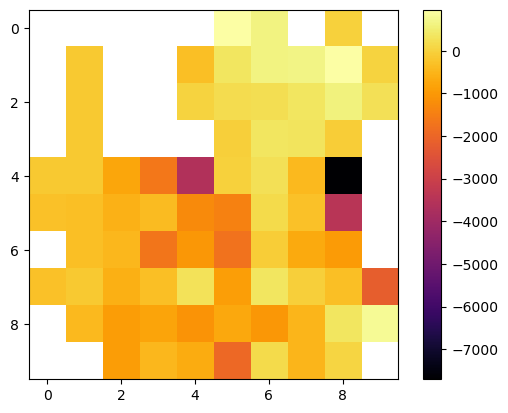

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 201 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 201 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

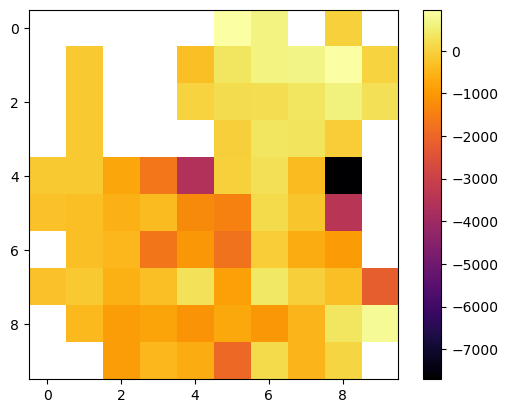

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 202 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 202 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

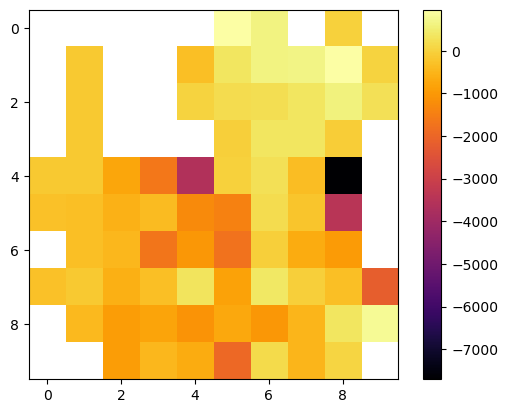

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 203 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 203 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

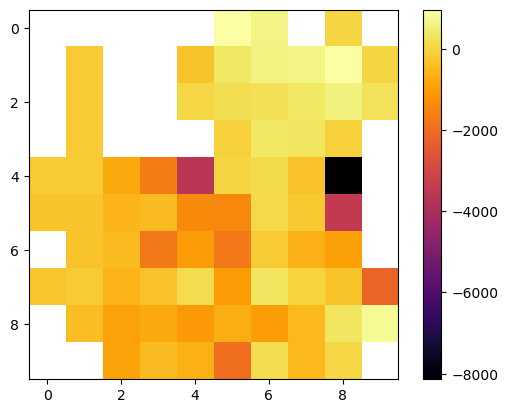

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 204 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 204 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

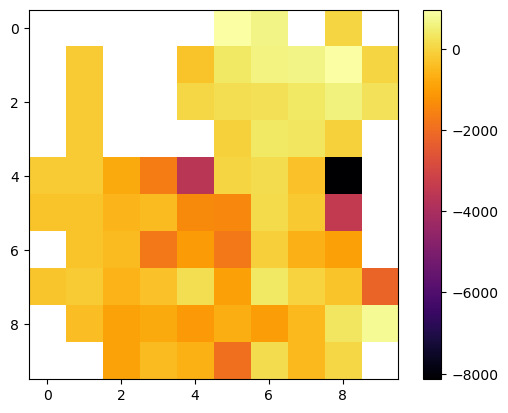

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 205 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 205 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

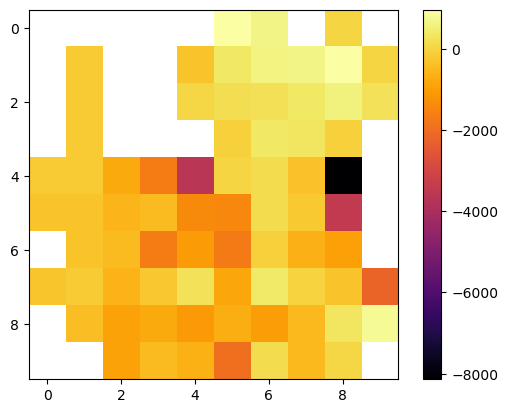

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 206 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 206 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

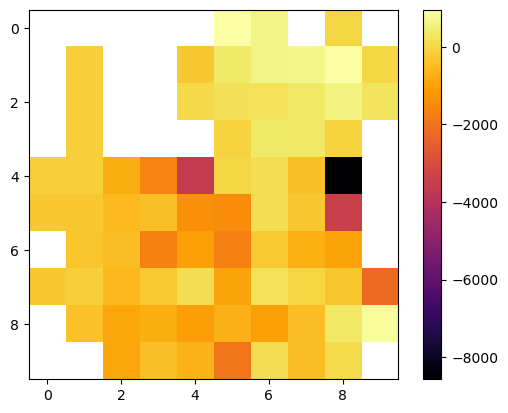

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 207 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 207 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

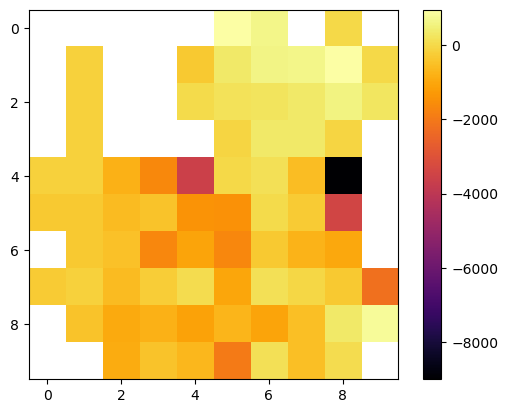

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 208 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 208 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

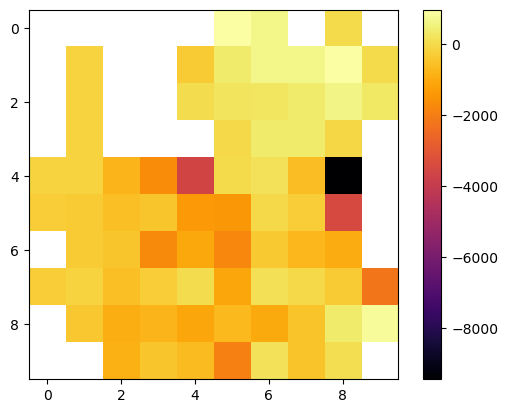

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 209 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 209 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

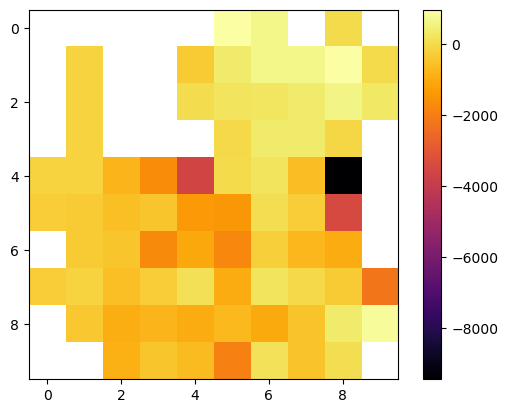

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 210 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 210 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

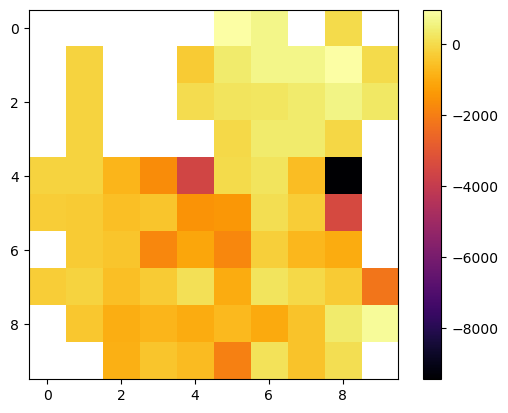

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 211 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 211 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

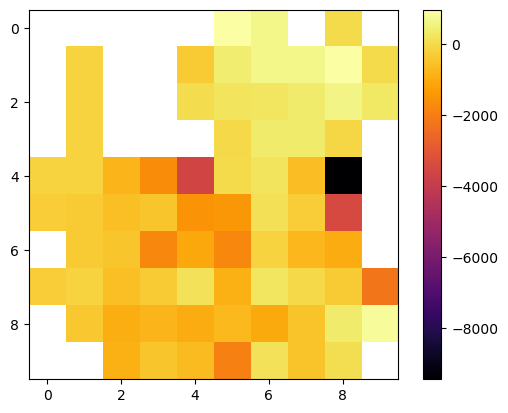

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 212 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 212 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

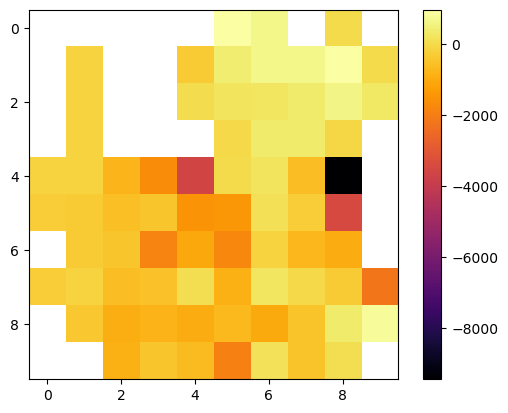

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 213 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 213 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

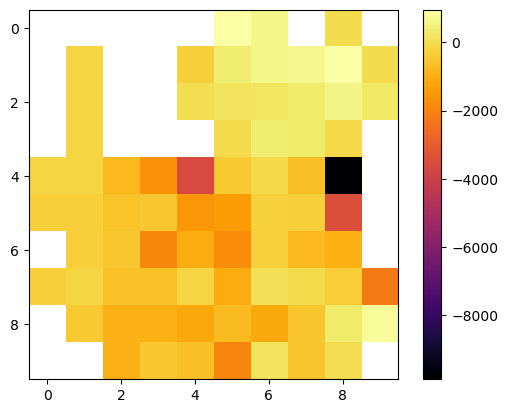

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 214 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 214 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

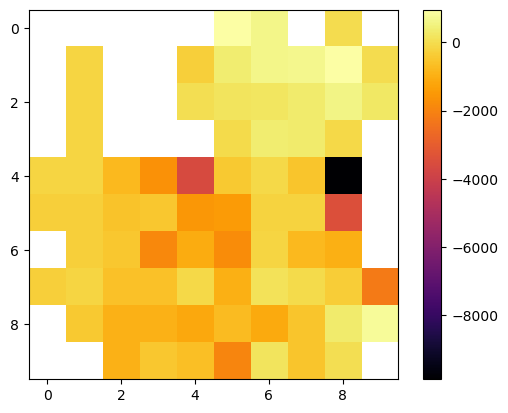

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 215 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 215 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

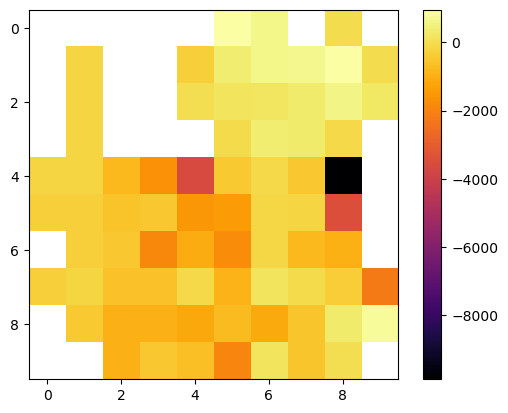

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 216 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 216 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

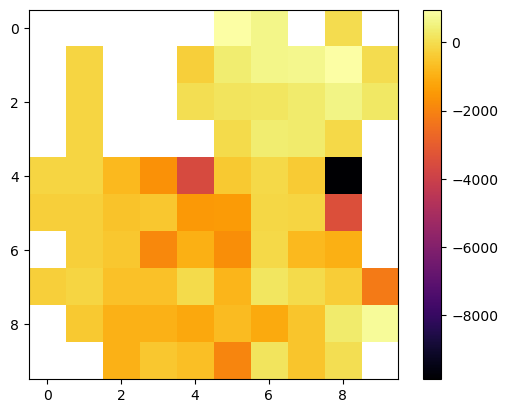

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 217 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 217 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

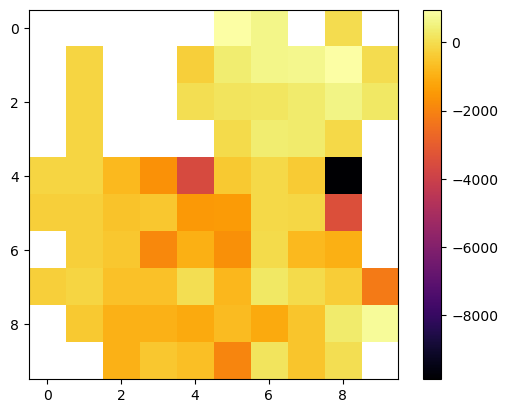

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 218 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 218 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

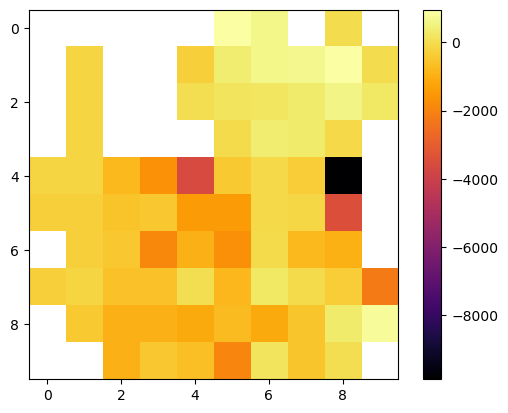

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 219 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 219 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

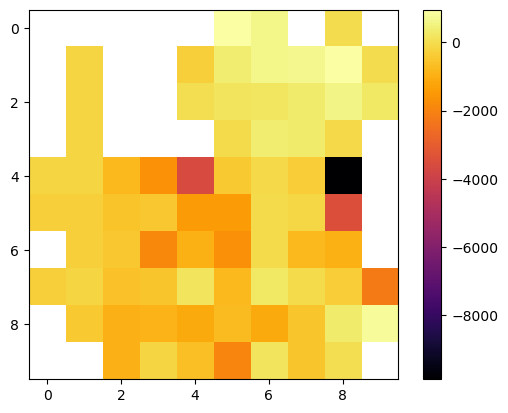

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 220 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 220 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

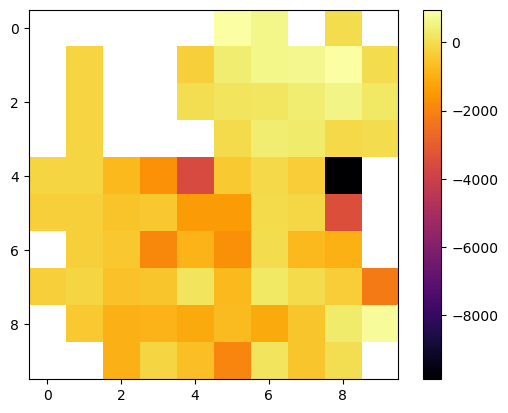

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 221 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 221 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

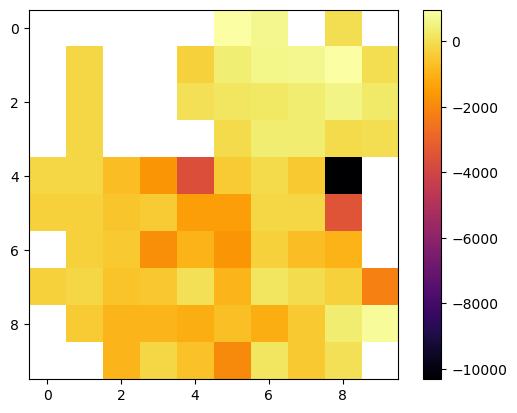

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 222 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 222 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

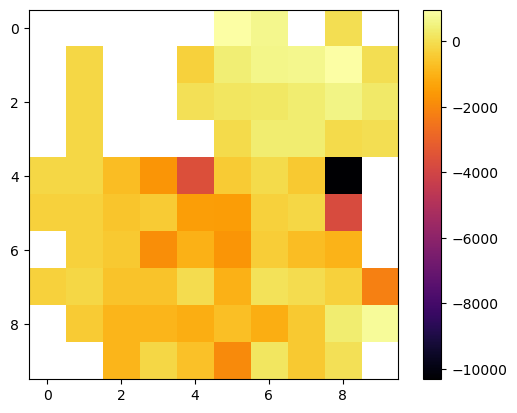

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 223 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 223 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

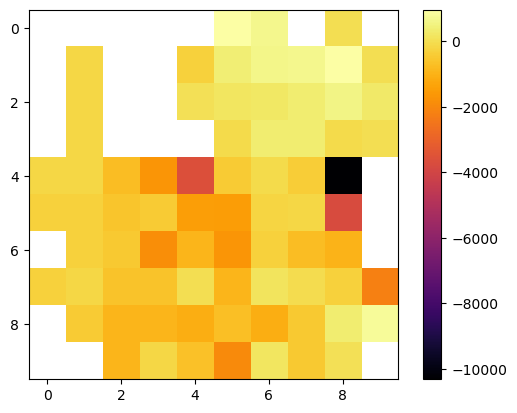

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 224 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 224 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

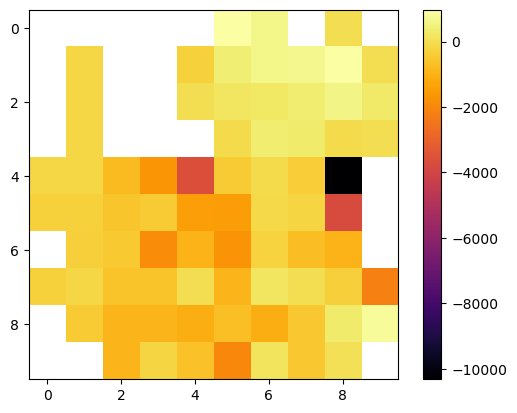

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 225 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 225 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

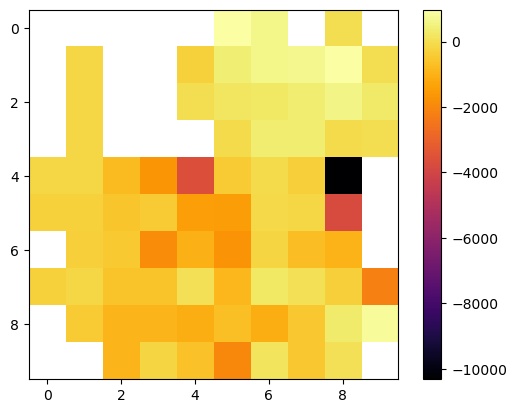

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 226 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 226 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

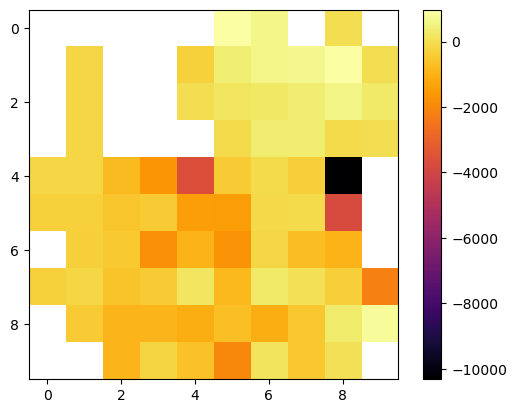

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 227 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 227 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

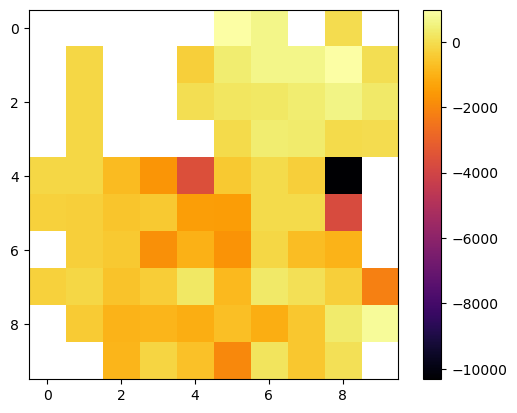

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 228 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 228 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

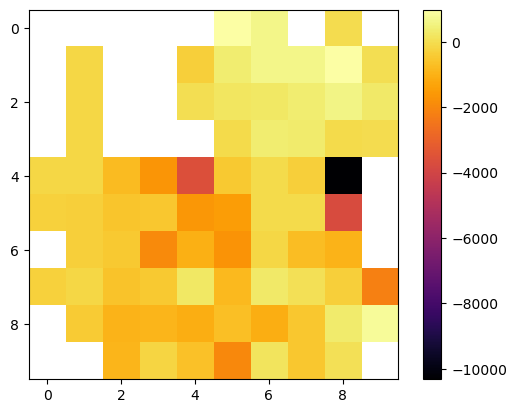

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 229 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 229 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

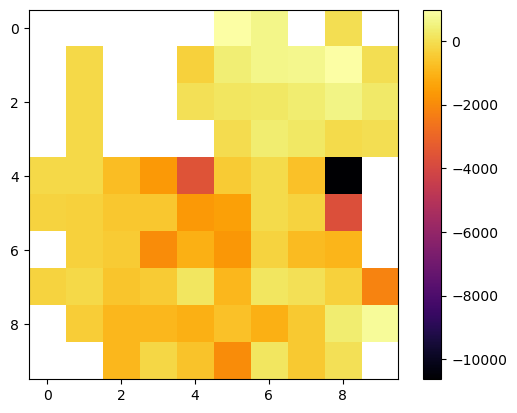

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 230 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 230 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

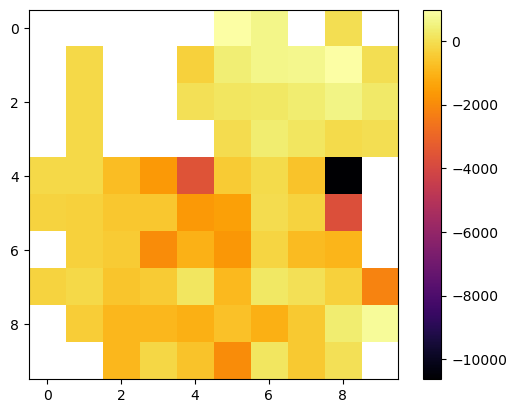

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 231 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 231 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

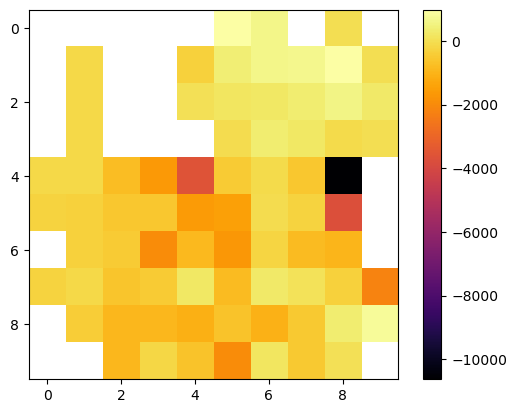

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 232 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 232 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

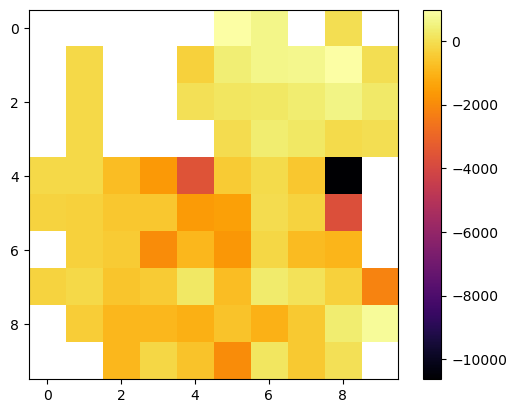

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 233 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 233 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

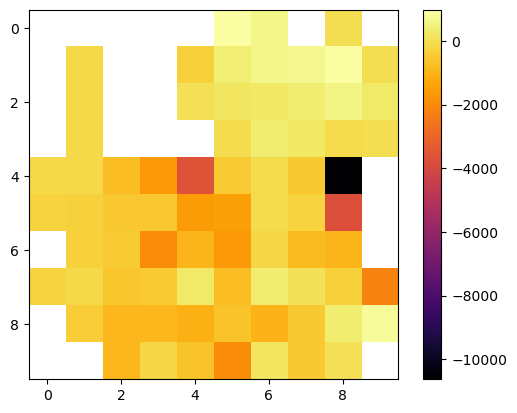

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 234 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 234 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

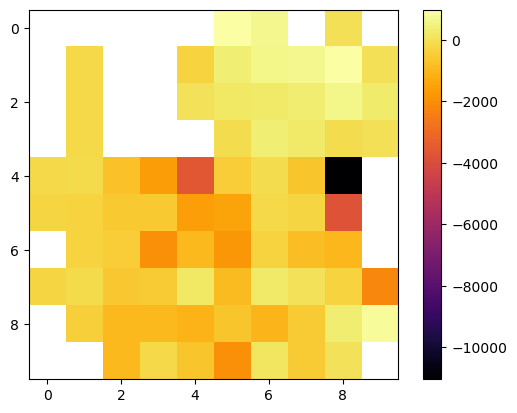

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 235 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 235 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │     ×        │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

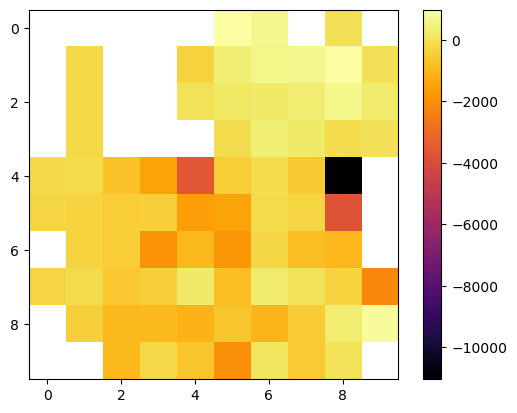

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 236 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 236 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

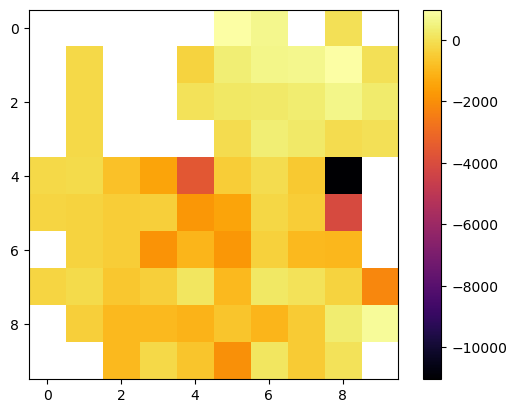

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 237 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 237 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

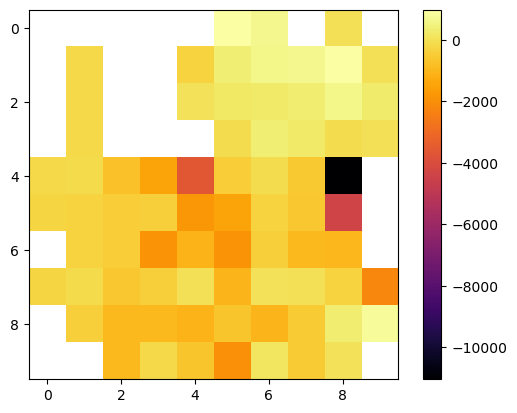

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 238 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 238 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

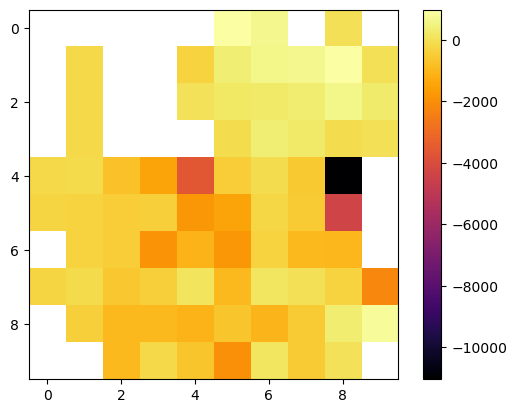

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 239 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 239 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

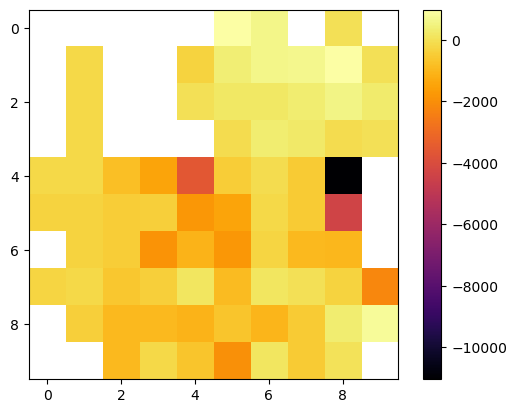

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 240 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 240 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

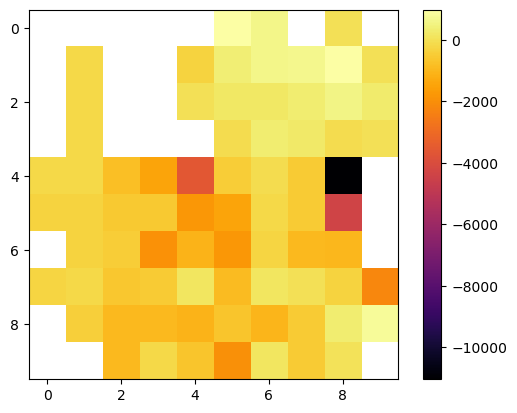

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 241 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 241 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

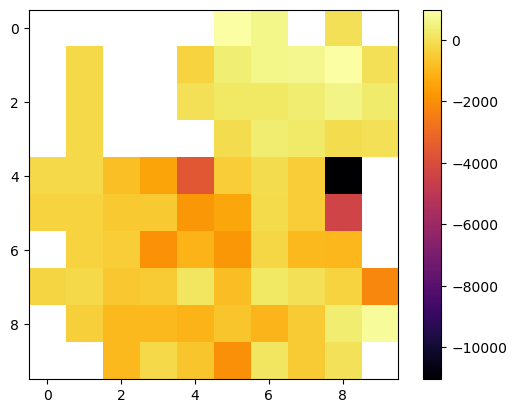

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 242 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 242 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

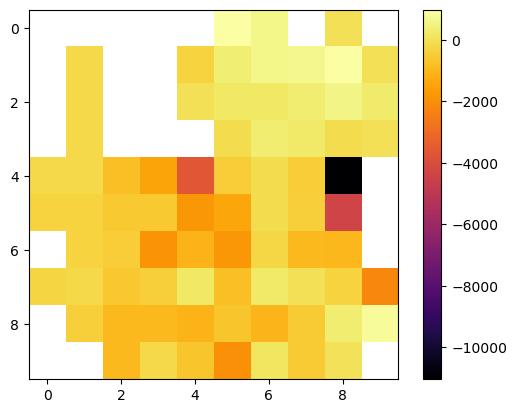

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 243 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 243 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

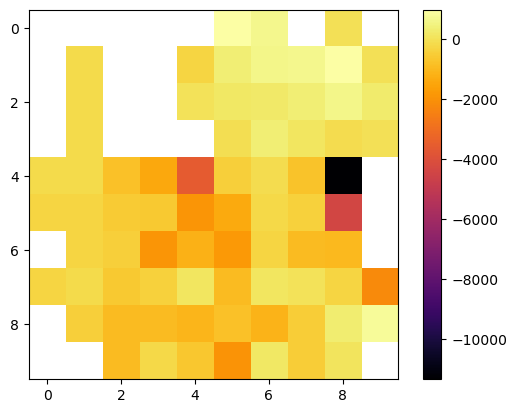

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 244 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 244 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

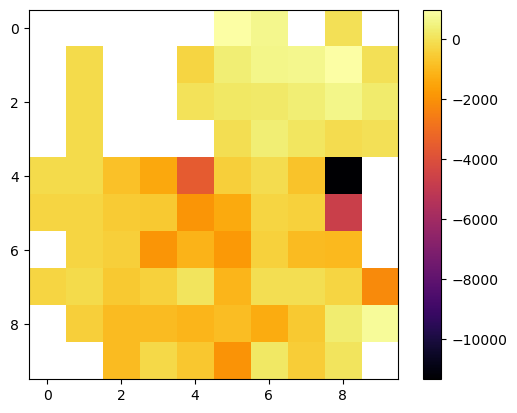

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 245 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 245 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │        ×     │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 245 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ×  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 245 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ×  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

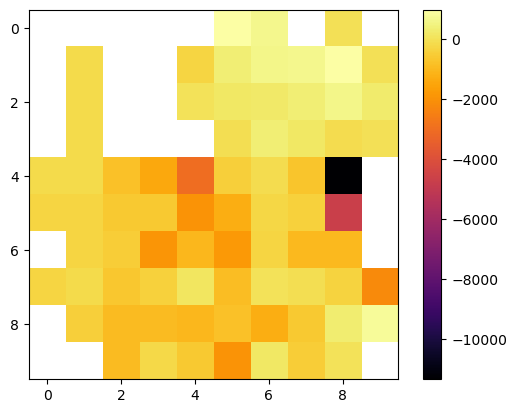

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 246 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 246 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  ×     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 246 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 246 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →  ×  ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

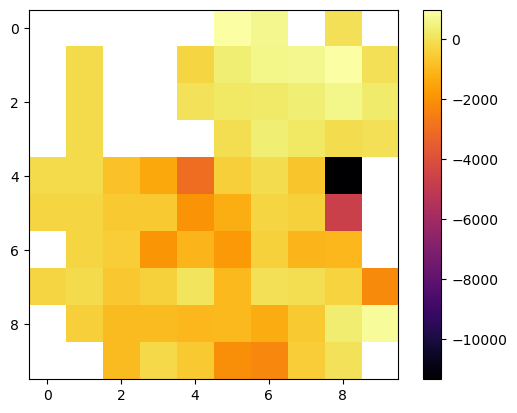

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 247 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 247 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

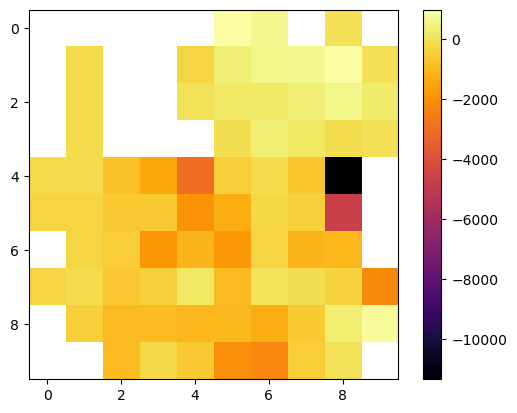

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 248 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 248 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

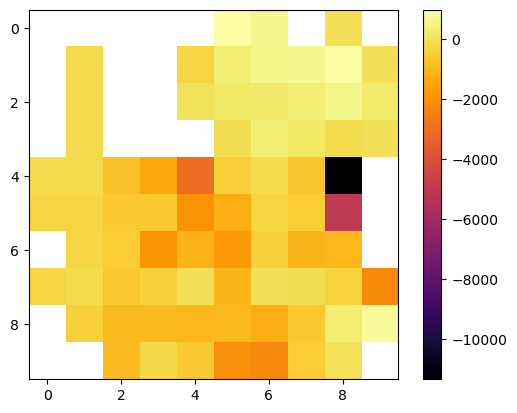

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 249 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 249 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

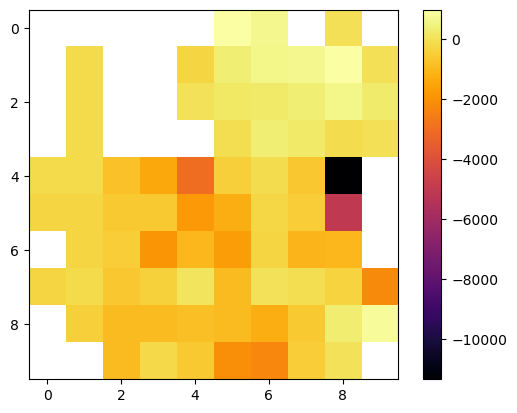

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 250 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 250 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

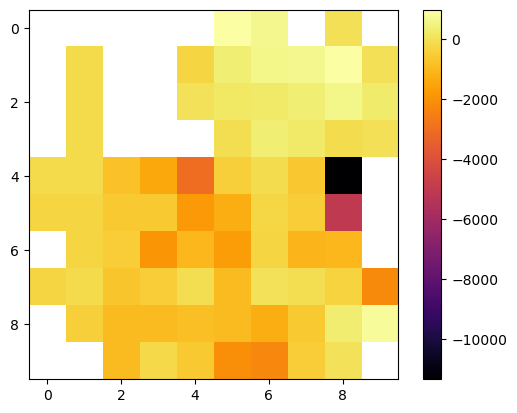

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 251 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 251 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

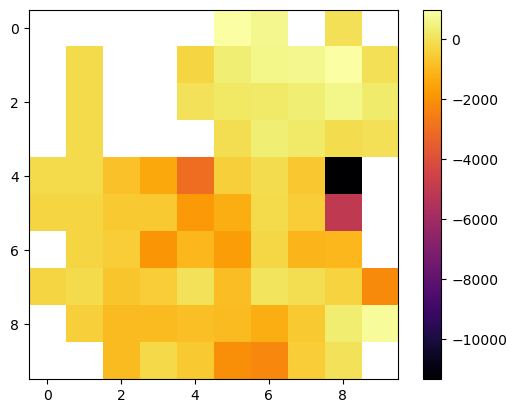

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 252 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │        ×     │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 252 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

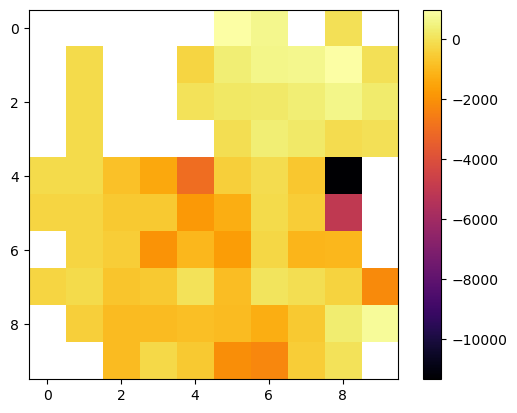

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 253 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 253 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

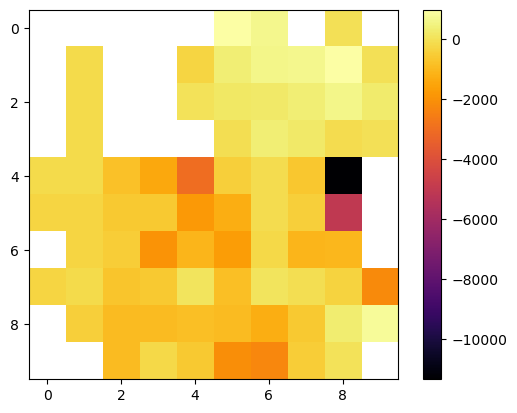

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 254 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 254 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

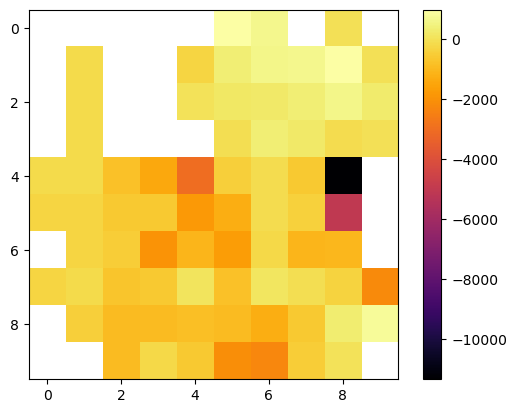

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 255 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 255 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

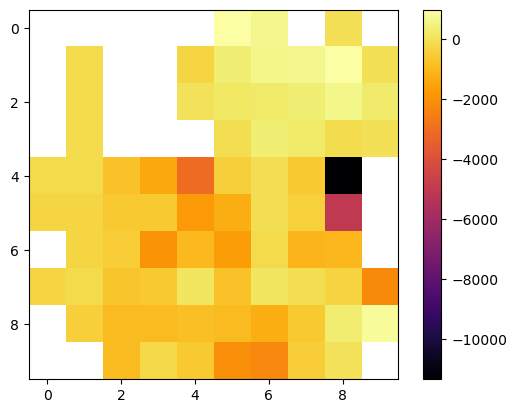

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 256 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 256 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

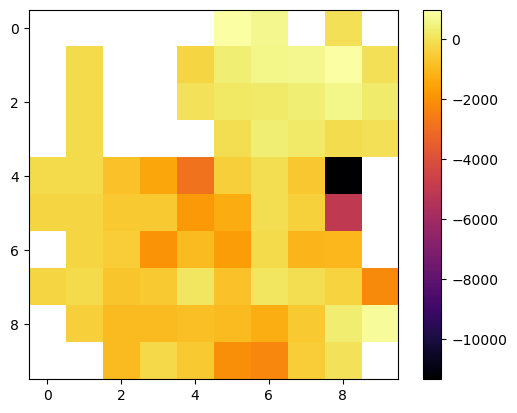

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 257 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 257 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

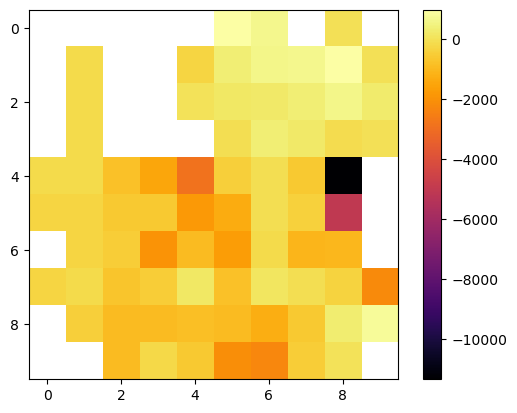

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 258 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 258 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

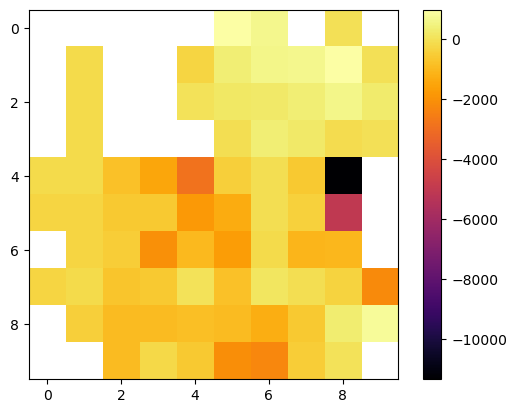

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 259 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 259 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

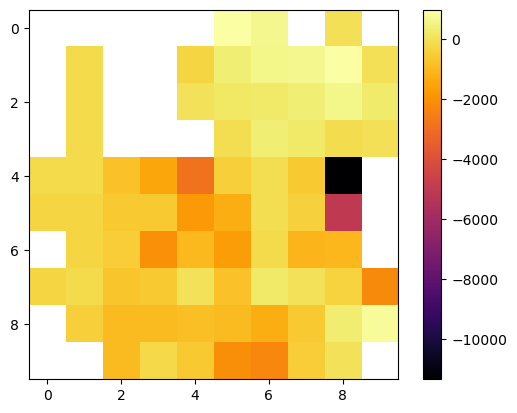

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 260 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 260 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

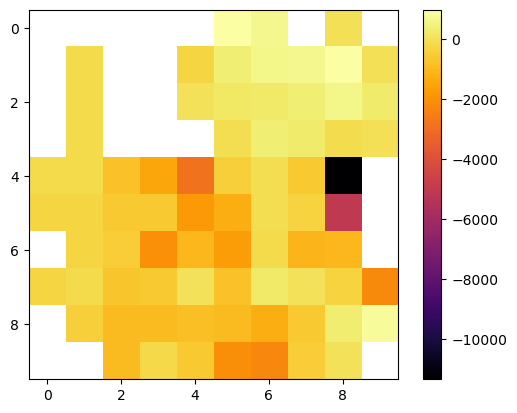

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 261 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 261 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

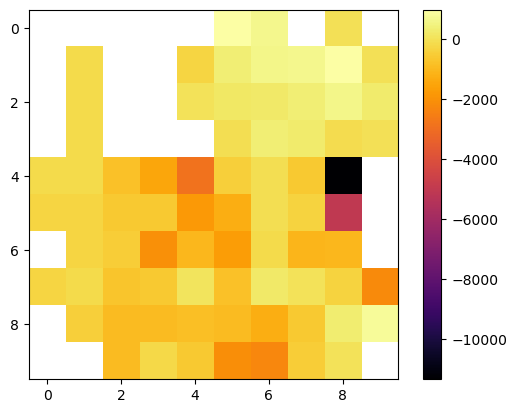

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 262 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 262 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

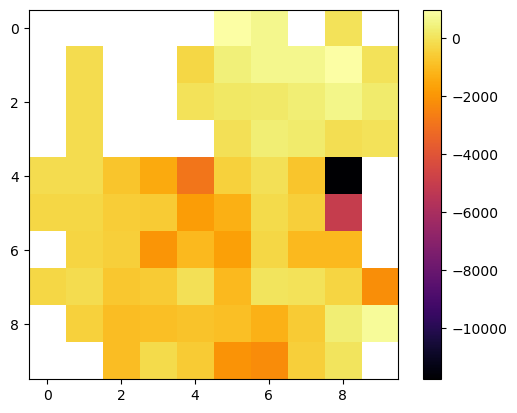

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 263 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 263 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

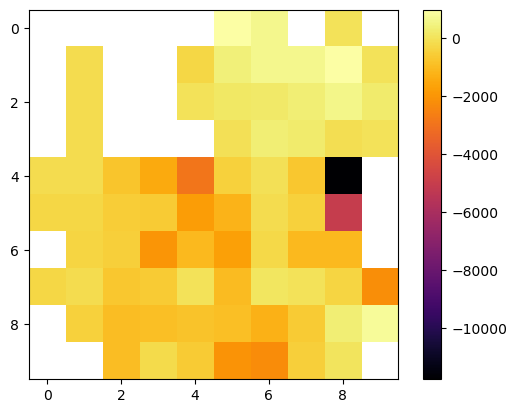

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 264 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 264 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

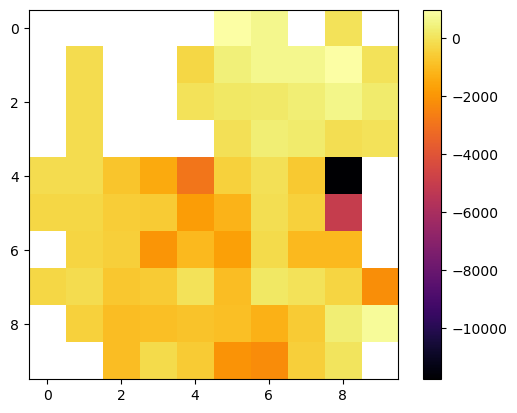

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 265 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 265 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

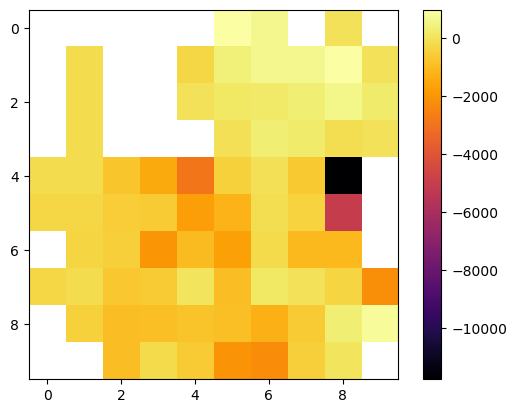

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 266 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 266 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ×  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 266 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ×  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 266 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ×  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

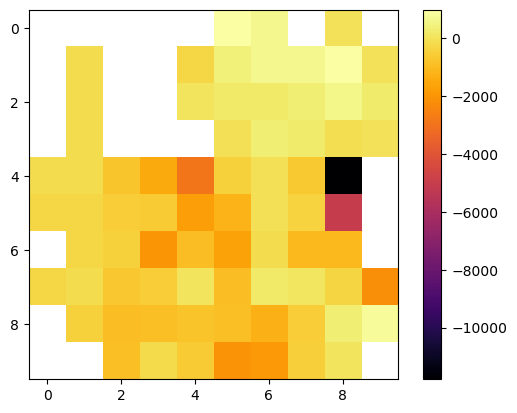

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 267 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 267 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

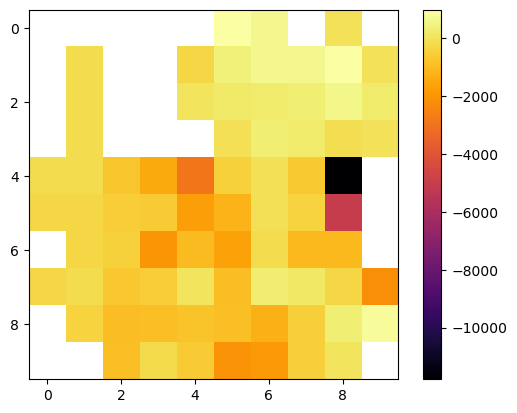

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 268 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 268 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

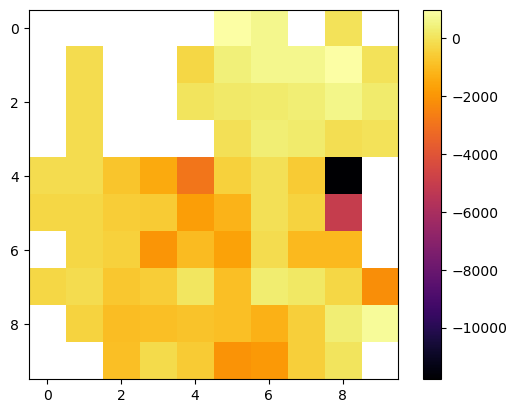

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 269 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 269 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

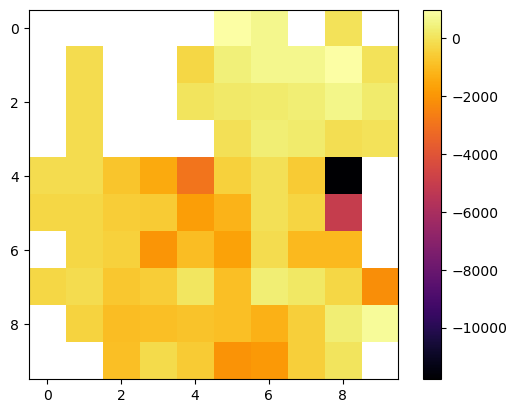

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 270 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 270 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

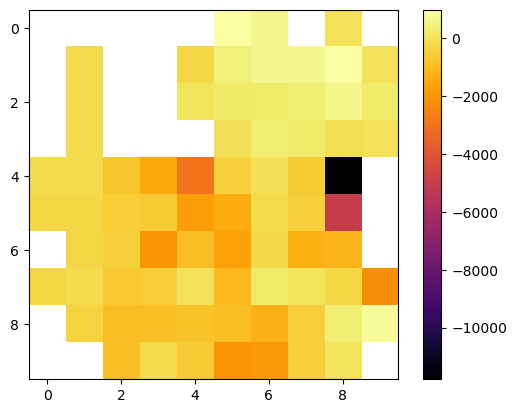

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 271 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 271 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

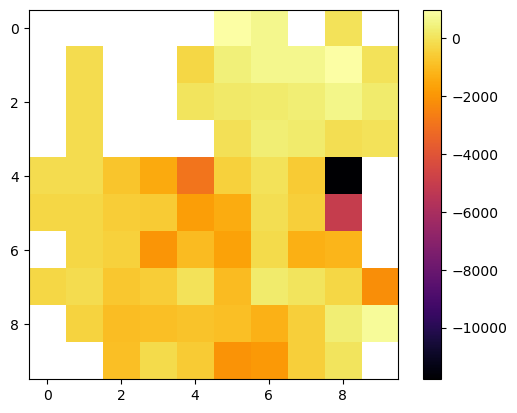

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 272 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 272 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

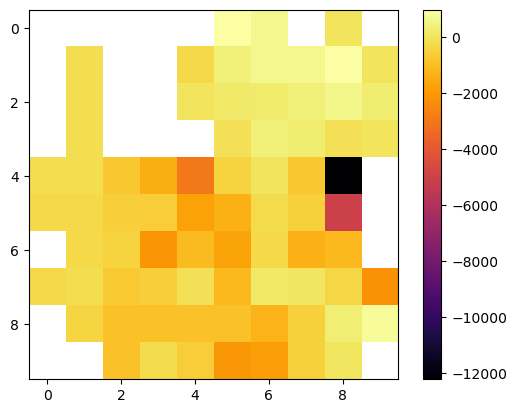

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 273 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 273 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

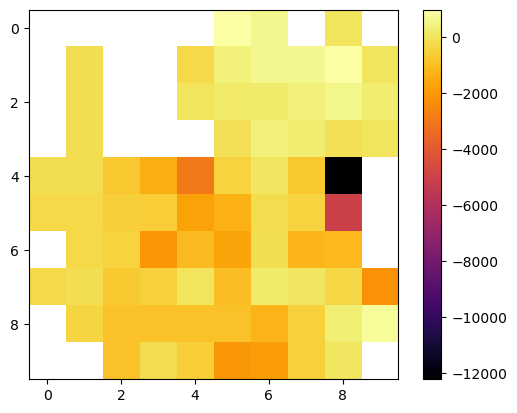

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 274 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 274 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  ×     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 274 - STEP 24 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →  ×  ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 274 - STEP 25 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →  ×  ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

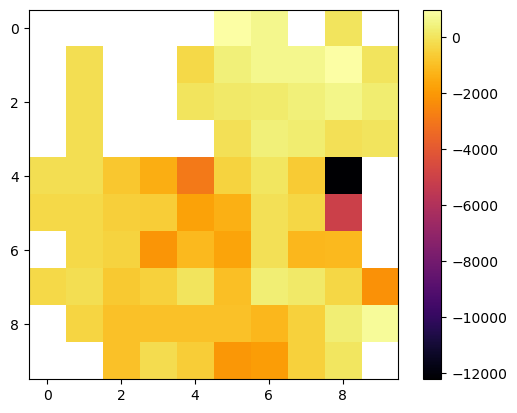

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 275 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 275 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

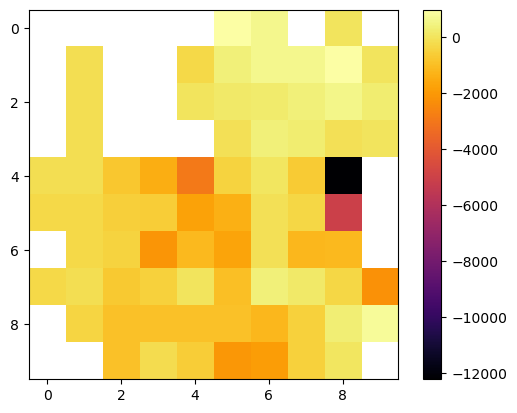

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 276 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 276 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

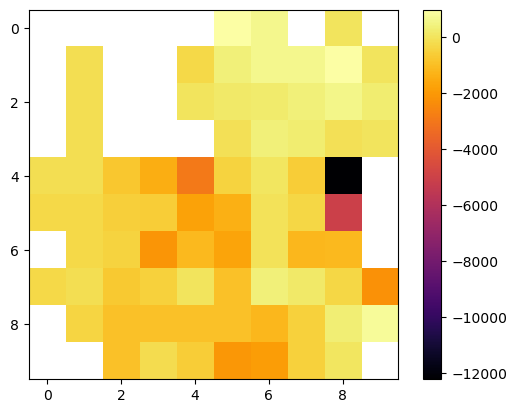

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 277 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 277 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

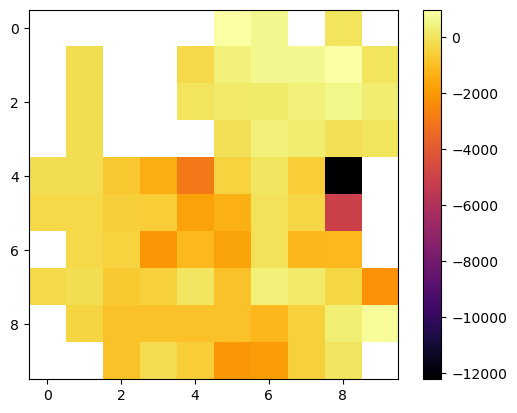

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 278 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 278 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

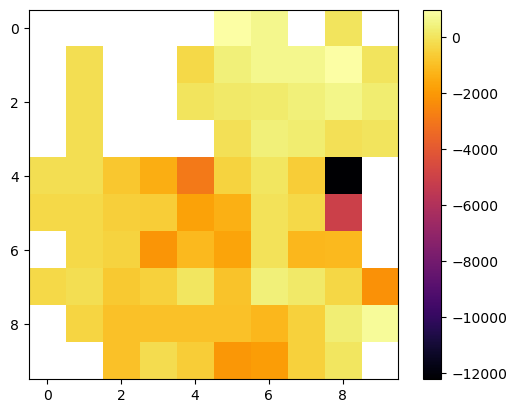

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 279 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 279 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

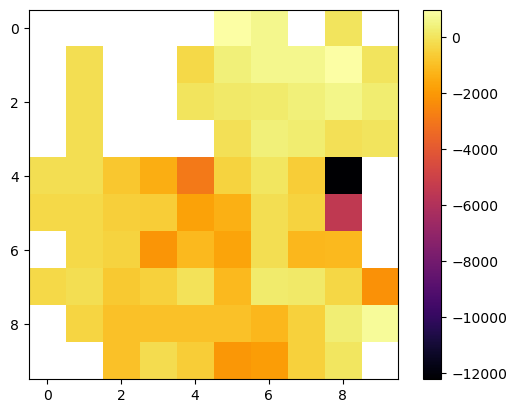

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 280 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 280 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

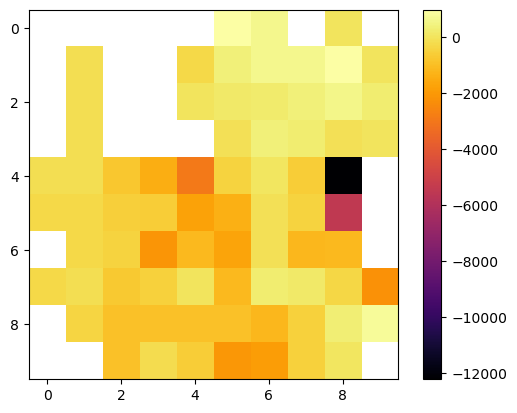

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 281 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 281 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

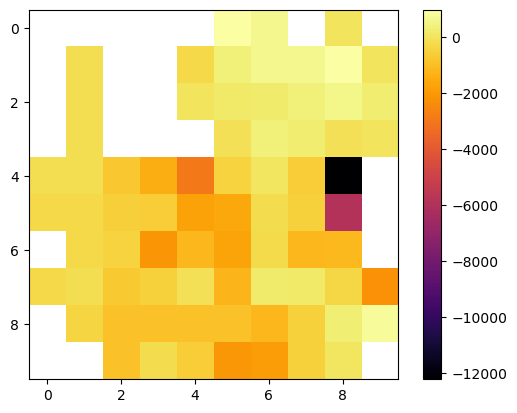

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 282 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 282 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

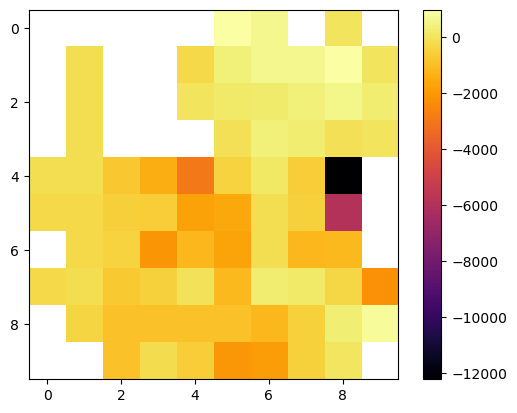

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 283 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 283 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

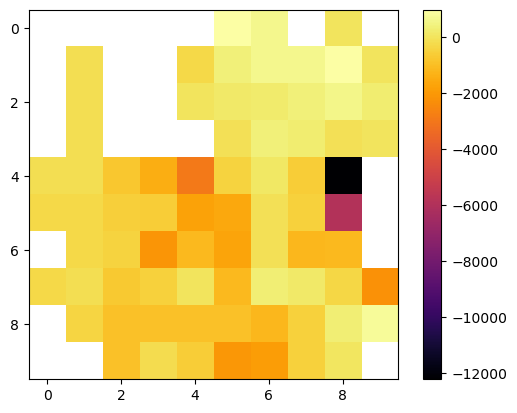

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 284 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 284 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

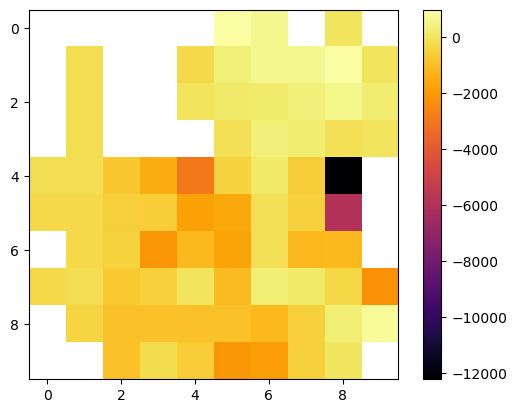

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 285 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 285 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

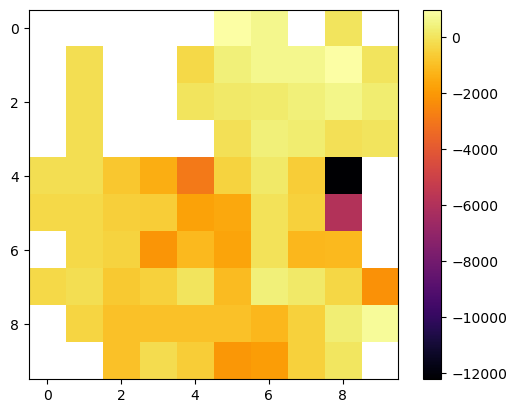

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 286 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 286 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

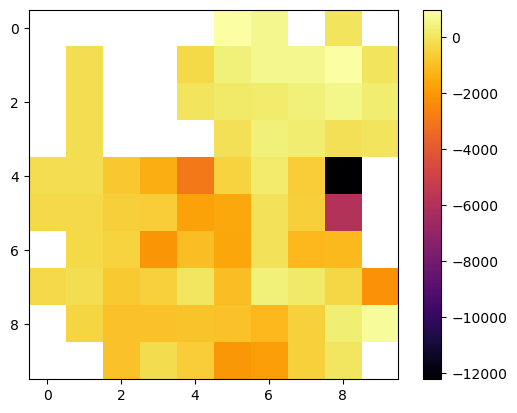

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 287 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 287 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ×     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

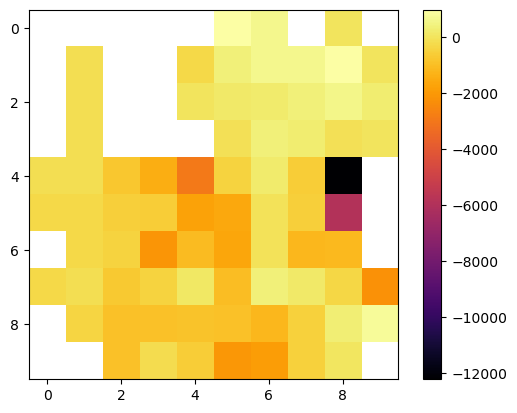

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 288 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 288 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

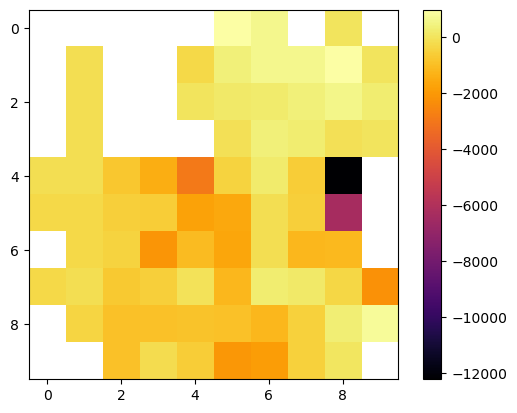

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 289 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 289 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

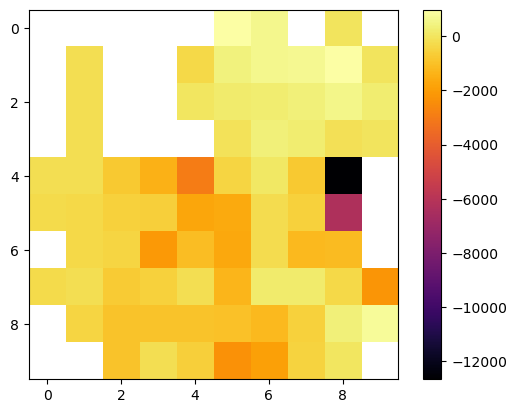

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 290 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 290 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

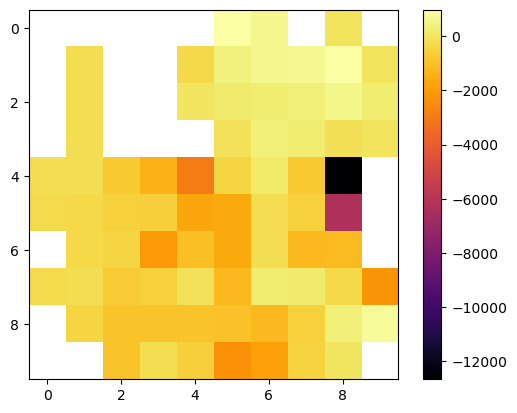

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 291 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 291 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ×  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 291 - STEP 25 end


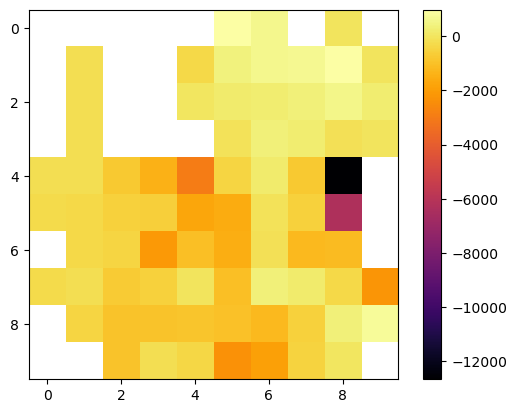

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 292 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 292 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

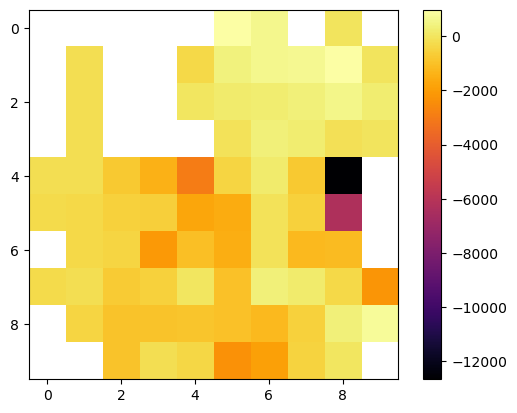

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 293 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 293 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

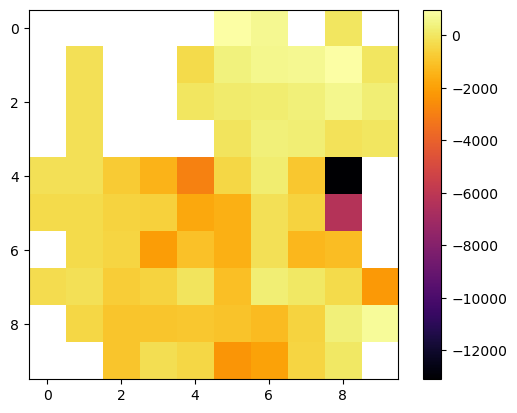

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 294 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 294 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

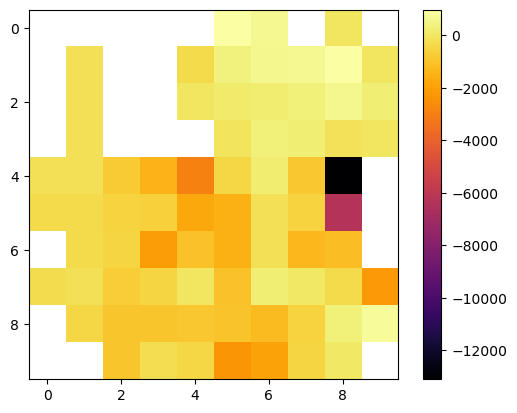

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 295 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 295 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

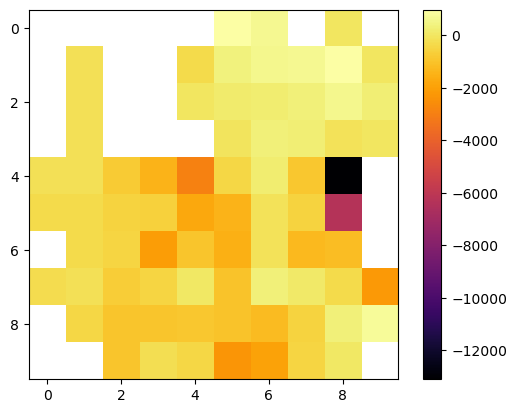

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 296 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 296 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

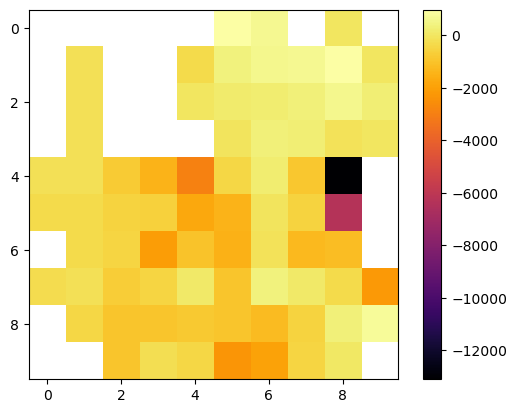

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 297 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 297 - STEP 1 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

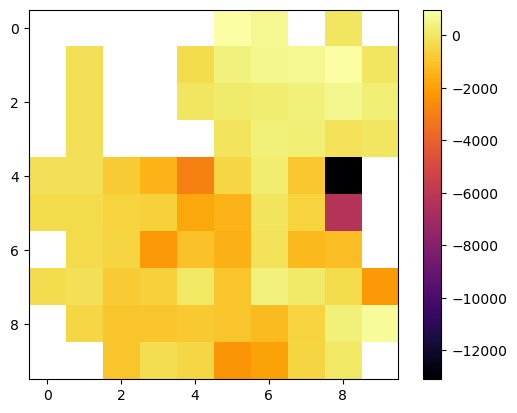

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 298 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 298 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 298 - STEP 25 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │  ×  →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 298 - STEP 26 - Last R -3
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     ×  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EP

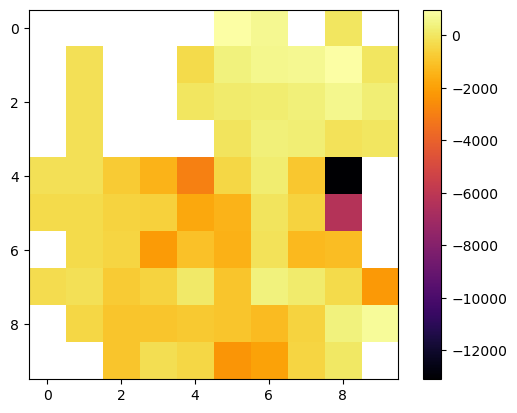

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 299 - STEP 0 - Last R 0
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISODE 299 - STEP 1 - Last R -1
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
EPISO

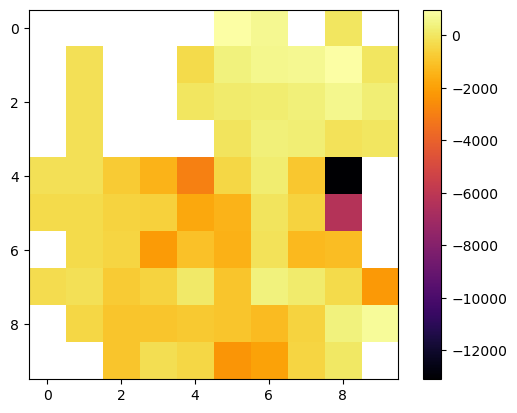

In [148]:
env = GridWORLD()
env.seed(42)
MC = TabularQ(env, policy=EpsilonGreedy, alpha=0.3, gamma=0.99, N=float('inf'))
MC.train(episodes=300, render={'mode': 'human', 'speed': 0.001})

# env = Labyrinth()
# env.seed(42)
# MC = TabularSarsa(env, policy=EpsilonGreedy, alpha=0.3, gamma=0.99, N=float('inf'))
# MC.train(episodes=100, render={'mode': 'human', 'speed': 0.001})

In [149]:
MC.save('gridworld_q_MC-SARSA-03.pkl')
# MC.load('gridworld_q_MC-SARSA-03.pkl')
# MC.save('gridworld_q_MC-Q-03.pkl')
# MC.load('gridworld_q_MC-Q-03.pkl')
MC(render={'mode': 'human', 'speed': 0.1})

 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │           ×  │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙  ×  │  →     ☢  │ 
 │  →  ☢  ←                 │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗  ☢  │     ↗  ↑  ↖  │ 
 │  ↗  ↗  ☢  │              │ 
 │    ───────┴──┐  →     ☢  │ 
 │              │  →     ☢  │ 
 │  ↘  ↓  ↙     │  →     ☢  │ 
 │  →  ☢  ←  ×              │ 
 │  ↗  ↑  ↖                 │ 
 └──────────────────────────┘ 
 ┌───────────┬──────────────┐ 
 │  ☢  ☢  ☢  │     →  ★  ←  │ 
 │  ↗  ↗

### Plot of trainings success

###### Average Return-per-Episode plotted against (A) episodes sampled and (B) wallclock-time 

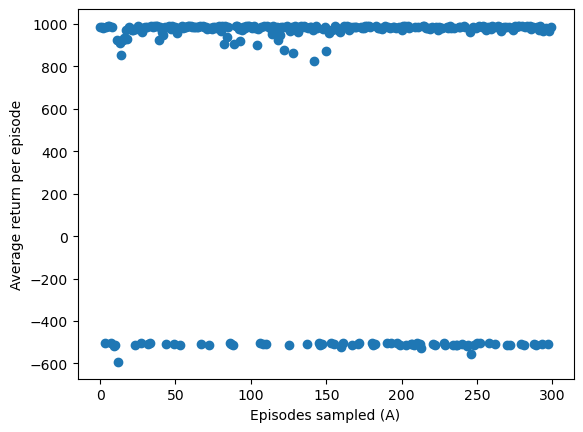

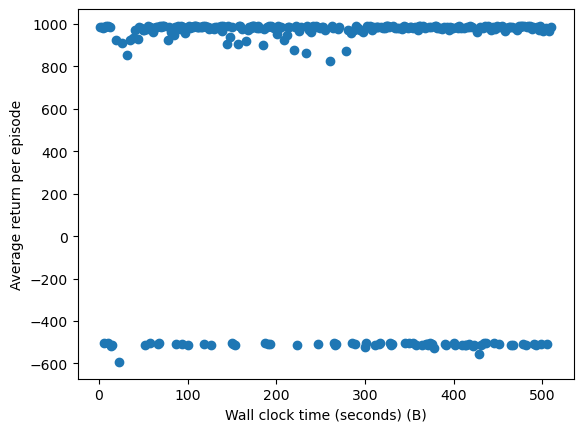

In [150]:
# plot average return per episode against episodes sampled
fig, ax = plt.subplots()
ax.scatter(range(len(MC.episode_returns)), MC.episode_returns)
ax.set_xlabel('Episodes sampled (A)')
ax.set_ylabel('Average return per episode')
plt.show()

# plot average return per episode against wall clock time
fig, ax = plt.subplots()
ax.scatter(MC.episode_times, MC.episode_returns)
ax.set_xlabel('Wall clock time (seconds) (B)')
ax.set_ylabel('Average return per episode')
plt.show()